In [ ]:
!nvidia-smi

Wed Jul  5 21:50:57 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P0    27W /  70W |    273MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#import libraries
import torch,pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
#visualization function:

def show(tensor, ch=1, size=(28,28), num=16):
  # tensor size: 128x784 [128x28x28]
  data = tensor.detach().cpu().view(-1,ch,*size) #deatches tensor from computational gradient, uses cpu and transforms the tensor to a shape of 128x1x28x28
  grid = make_grid(data[:num], nrow=4).permute(1,2,0) #take first 16 from the 128 images tensor and making square grid of 4x4 ; permute changes the order 1x28x28  to 28x28x1
  #pytorch uses channel*width*height convention for an image whereas matplotlib requires width*height*channels convention.
  plt.imshow(grid)
  plt.show()

In [ ]:
# setup of main parameters and hyperparameters.

epochs=500 #within an epoch , no. of steps.
cur_step=0 #each step->1 batch, current step starts from 0
info_step=300 #after how many batches do you want to display info(generated images look) on screen.
#acccumulate the gen loss and disc loss in:
mean_gen_loss = 0
mean_disc_loss= 0

z_dim = 64 #dimensionality of the random noise vector i.e input to the geneartor
lr = 0.00001 #learning rate for ADAM
loss_func = nn.BCEWithLogitsLoss() #applies sigmoid to the nn output to keep it to a range of [0->1] and passes through BCE loss, more numerically stable than BCE loss in this case

bs = 128 #batchsize
device = 'cuda'

dataloader = DataLoader(MNIST('.',download=True, transform = transforms.ToTensor()), shuffle=True, batch_size=bs)

#number of steps = 60000/128 = 469 steps



In [ ]:
from torch.types import Device
from torch.nn.modules.batchnorm import BatchNorm1d
#declare our models:


#GENERATOR:

def generatorblock(inp,out): #takes in input shape, output shape
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True) #adding non-linearity
  )

class Generator(nn.Module):
  def __init__(self,z_dim=64,i_dim=784, h_dim=128): #takes input : input size-> z_dim (random noise) , output-size-> i_dim= image output size (28,28), h_dim-> no. of hidden neurons
    super().__init__()
    self.gen = nn.Sequential( #model architecture defining
        generatorblock(z_dim,h_dim), #64,128
        generatorblock(h_dim,h_dim*2), #128,256
        generatorblock(h_dim*2,h_dim*4), #256,512
        generatorblock(h_dim*4,h_dim*8), #512,1024
        nn.Linear(h_dim*8,i_dim), #1024, 784
        nn.Sigmoid(),
    )
  def forward(self,noise):
      return self.gen(noise)


def gen_noise(number,z_dim):
  return torch.randn(number,z_dim).to(device) #produce random distribution of mean 0 standard deviation 1: standard normal distribution; number will correspond to batch size=128



# DISCRIMINATOR:

def discriminatorblock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self,i_dim=784,h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        discriminatorblock(i_dim,h_dim*4), #784,1024
        discriminatorblock(h_dim*4,h_dim*2), #1024, 512
        discriminatorblock(h_dim*2,h_dim), #512,256
        discriminatorblock(h_dim,1), #256,1
    )

  def forward(self,image):
    return self.disc(image)



## Questions you may have regarding the above generator and discriminator blocks code:
Answer Credits to [Javier Ideami](https://ideami.com/ideami/)



#### 1. Why in discriminator block we don't use batch normalization after linear layer, like we do it in generator block?

> As networks get deeper, we typically use normalization processes within the different blocks of the network in order to provide more stability and protect the networks from problems like exploding or vanishing gradients, for example. In more technical terms, normalization may reduce what is called Internal Covariate Shift. What you need to keep in mind at the end of the day is that normalization makes deep networks more stable, and prevents issues that may arise from weight values that are too extreme, by restricting the range of possible values that weights can take.


> And there are different ways in which we can normalize the values in the networks. We can normalize by batch, by instance, by layer or by group, for example. Depending on the method chosen, we will be normalizing the values across the mini batch being considered at that point in the training process, or across the features, or the channels or over groups of channels.
For a nice visual image that showcases these different methods, check Figure 2 on this paper: https://arxiv.org/pdf/1803.08494.pdf



> Now, the reason why we are normalizing by batch in the generator and by instance in the discriminator, is because experimentally researchers have found that in this specific configuration and architecture variation (this is key, its not an absolute answer, but specific to this kind of configuration) batch norm works better in the generator, whereas instance norm works better in the discriminator. These types of decisions are typically the result of long research processes performed by labs and individual researchers. The technical aspects behind those decisions would take quite a bit of time to go into but the key thing for you to remember is that in both cases the objective of normalization is to stabilize and accelerate the training process, and that we pick one or the other way of normalizing after having experimented with them across similar networks in the past and having found out that some of these methods work better than the others in different parts of these networks.



> Intuitively you can begin to see what could be one of the factors influencing this decision. In the generator, you are using a similar criteria to transform all the images in a batch, so using batch normalization can be useful to stabilize and speed up the process. In the discriminator, you are interested in predicting if each of the images is real or fake. And if you normalize across the entire mini-batch, this may cause problems in regards to the statistics that differentiate the various images being considered, so in the discriminator it could be better to normalize across images, across instances, to better preserve the differences across instances-images.



> However these are not absolute decisions, and in other types of GANs and variations of this same architecture you may find that we use instance norm all across or a different mix of methods, again highly empirical. Deep learning is sometimes as much art as is science. For example, despite massive amounts of research, nobody is yet totally sure about why exactly batchnorm helps so much to stabilize the training of very deep networks. We have theories but nobody is yet totally sure and research continues.



> And I also want you to get from all this that the difference between batch norm and instance norm is that in batch norm we calculate the statistics (needed to normalize the values) across batches of images, whereas in instance norm, we do the calculations per image.




#### 2. Number of neurons in our generator network is growing from layer to layer: 64, 128, 258... but in the output layer we have less neurons than in previous layer (784 after 1024). Why? And generally, what kind of intuition stands behind choosing layers dimentions?


> Those numbers you are referring to (64, 128, 256...1024.. 784), are the input and output dimensions of the layers of this simple basic GAN. In such a simple GAN we have two key objectives in the generator:



> a) First of all, we want to gradually grow and build the generated image from the small sized input (the initial patch of noise) till we arrive to the final image size we want.



> b) The intermediate layers should have enough number of parameters in comparison with the number of training samples we have (be overparametrized) to allow the network to create complex non-linear mappings.



> The number of parameters you use in the intermediate layers can be anything you like but you just have to make sure that you have way more parameters than training samples. In a way, you need to give breathing room, space to the network (in terms of numbers of parameters) for the network to be able to create the complex mappings it needs so that it can take the initial noise patch and transform it into an image of a number that is similar to the ones of the training dataset.
So you could use other numbers, you could go up gradually till 2048 or 4096 in the final layers, but of course, the more parameters, the more compute power you need and the slower the network will train! That's why there is not an absolute answer. But what you do need to remember is that you want way more parameters than training samples (your network should be overparametrized).



> But now you arrive to the final layer and you remember that the output of the generator should be an image. And that image should have the same size than the rest of the images of the dataset you are working with. And the images of the MNIST numbers dataset have a dimensionality of 28x28 pixels. And if you multiple 28x28 you get 784. And that's why at the very end of the process, you need to end up in a dimensionality of 784, regardless of what was the one immediately before (1024 or 512 or 2048, etc), because that last dimensionality will be your output, and your output should be 28x28 = 784 values.


#### 3. Why ReLU for generators and LeakyReLU for the discriminators?

> These are empirical choices picked by the original researchers after many, many experiments, it is what they found to work the best. You can read the academic paper of the architecture to dive deeper into this if needed

In [ ]:
gen = Generator(z_dim).to(device) #calling instance of a generator class and storing it to the gpu
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr) #our optimizer for generator
#same for discriminator as well.
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(),lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

track_running_stats  means we track the statistical characteristics of the batch during our training process i.e. the mean and the variance during the entire training process.

affine = true, we can use learnable parameters. batchnorm has some learnable parameters that allow it to adapt to data dynamically.

momentum- running average/mean or running bar computation that is used during evaluation/inference/test.

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Linear(in_features=256, out_features=1, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
  )
)

In [ ]:
x,y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([9, 5, 0, 5, 8, 8, 8, 6, 2, 0])


x -  128 images of shape 28x28x1

y - the labels of the 128 images

prints first 10 labels depicting the value that the first ten image correspond to.

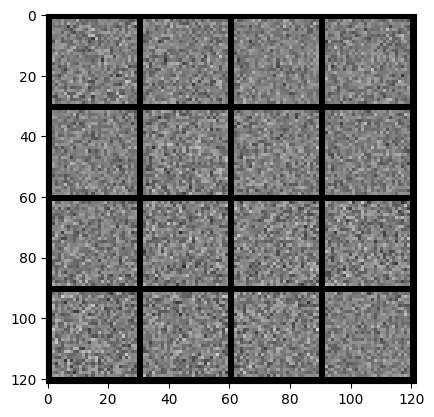

In [ ]:
noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

What we are seeing here is the initial output of the generator after passing through the random noise. Because the generator is not trained/ has not began to learn: it produces a very noisy output.

From here, we take the generator and train it well enough to produce images of numbers like in the dataset.

In [ ]:
# calculating generator loss and discriminator loss:

#generator loss:
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise = gen_noise(number, z_dim) #generate 128 noise vectors for each batch of z_dim latent noise dimensions.
  fake = gen(noise) # pass it as an input to the generator and obtain a fake image.
  pred = disc(fake) # take the output of the generator and pass it as an input to the discrimnator.
  targets = torch.ones_like(pred) # we have to fool the discriminator into thinking that the fake image generated is real, so our target must be series of ones in pred dimensions.

  gen_loss = loss_func(pred, targets) #loss function passed with our prediction from discriminator and our target to calculate the loss.
  return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach()) # important : while training the discriminator as we know, we only want to train the discriminator and dont want to change the generator loss.
  # Hence, we detach it from the generator to avoid backpropagation and changes to the generator weights/params.
  disc_fake_targets = torch.zeros_like(disc_fake) #fake images have to be compared here with fake: so 0s
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)


  # remember, we also pass the real images to the discriminator during its training : because we want it to better learn to differentiate between fake and real images.
  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets) # real images to be predicted as real: so 1s

  disc_loss = (disc_fake_loss + disc_real_loss)/2 #average of fake and real inputs loss as our returned disc_loss.
  return disc_loss


  0%|          | 0/469 [00:00<?, ?it/s]

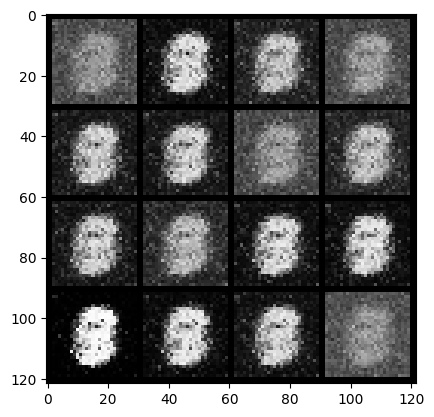

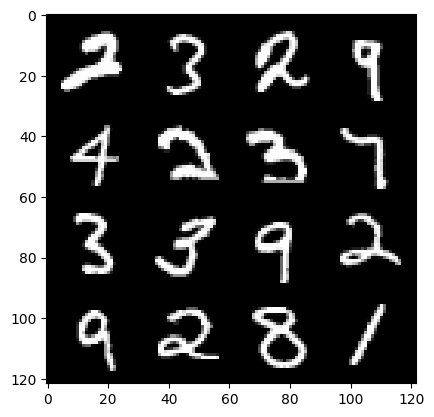

0: step 300/ Gen loss: 0.8590510549147917 / disc_loss: 0.4753997912009556


  0%|          | 0/469 [00:00<?, ?it/s]

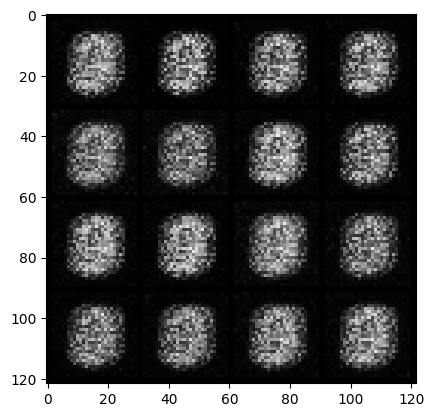

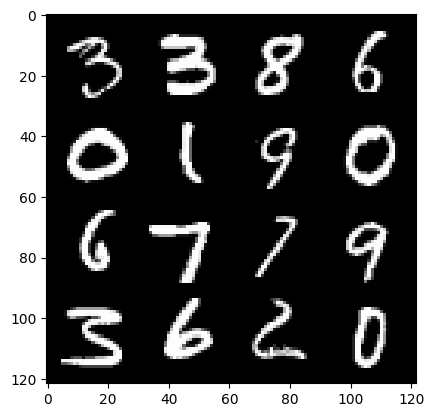

1: step 600/ Gen loss: 1.4049799505869547 / disc_loss: 0.6975748827060062


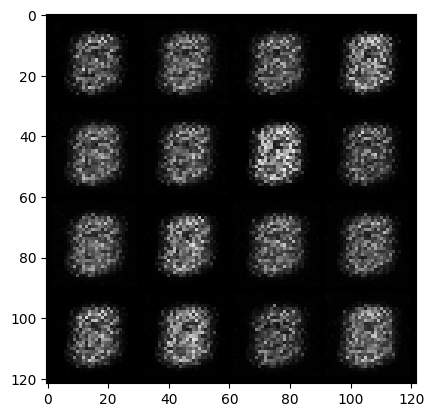

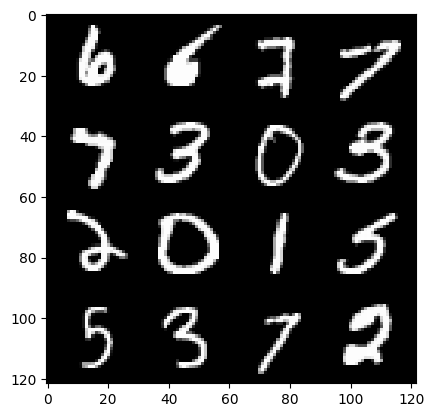

1: step 900/ Gen loss: 1.4599755108356474 / disc_loss: 0.8661354804038996


  0%|          | 0/469 [00:00<?, ?it/s]

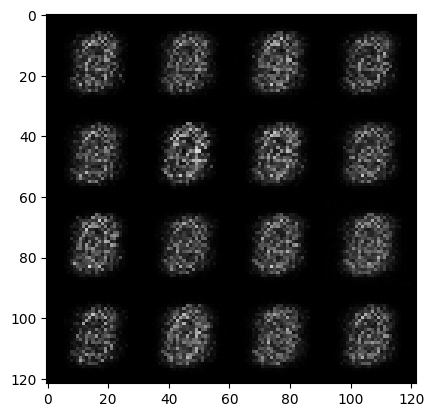

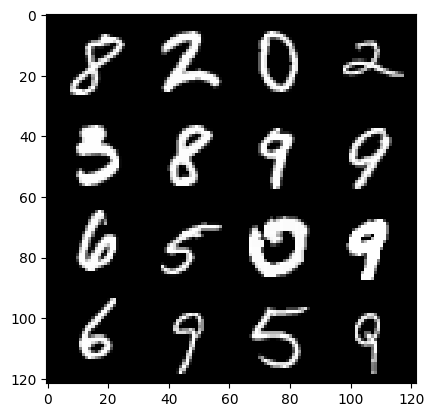

2: step 1200/ Gen loss: 1.460977305968603 / disc_loss: 1.0284884200990196


  0%|          | 0/469 [00:00<?, ?it/s]

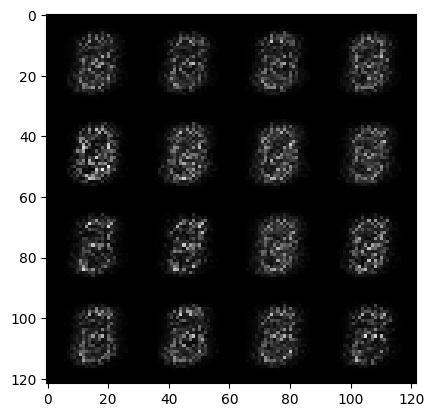

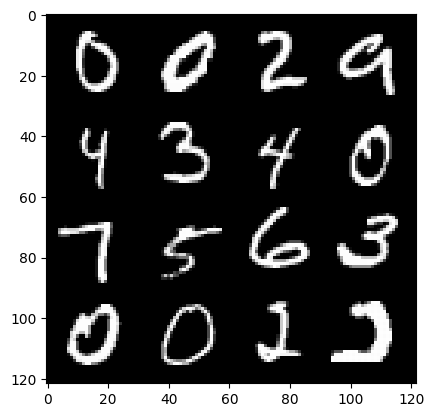

3: step 1500/ Gen loss: 1.4357369867960617 / disc_loss: 1.1947551524639122


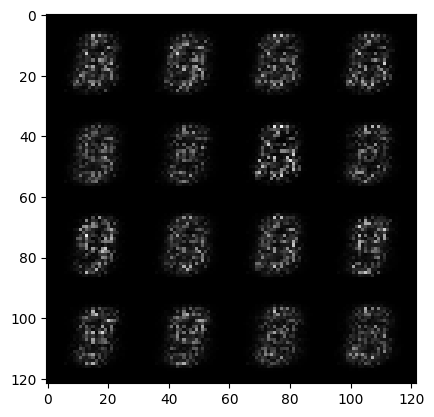

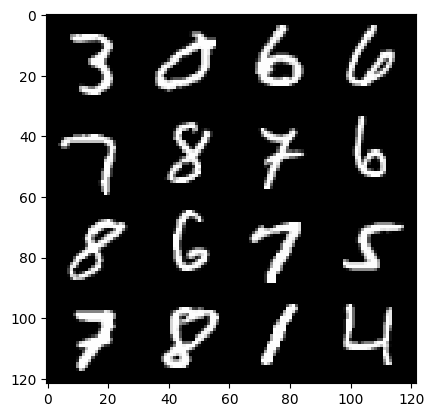

3: step 1800/ Gen loss: 1.4987958459059387 / disc_loss: 1.3483339041471478


  0%|          | 0/469 [00:00<?, ?it/s]

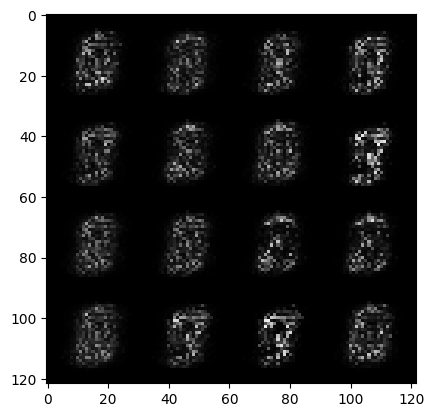

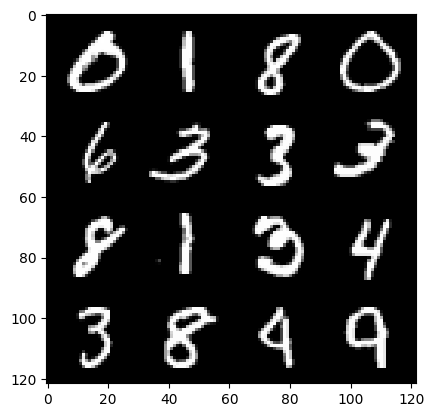

4: step 2100/ Gen loss: 1.6329995306332914 / disc_loss: 1.4851305085172255


  0%|          | 0/469 [00:00<?, ?it/s]

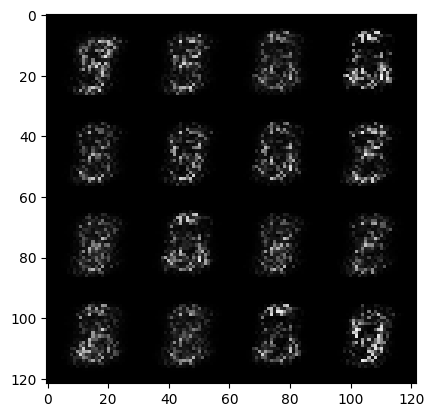

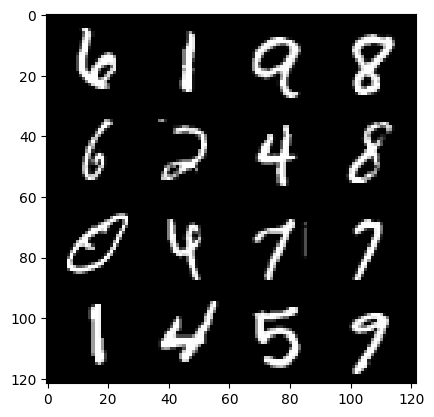

5: step 2400/ Gen loss: 1.8926955326398216 / disc_loss: 1.5952859424799686


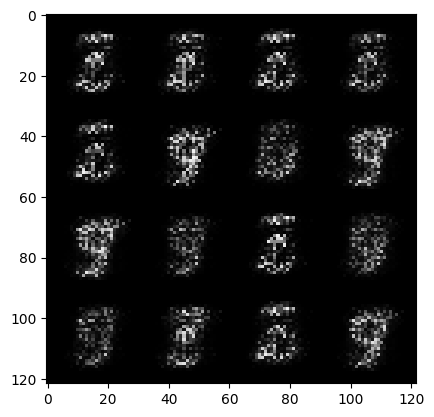

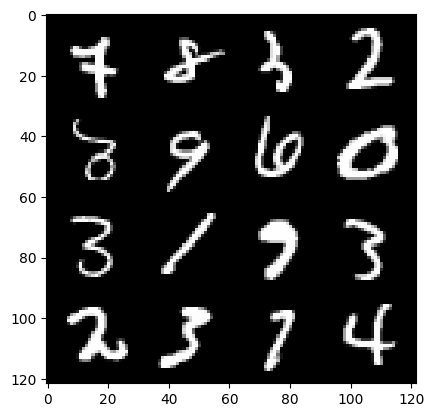

5: step 2700/ Gen loss: 2.222928973833718 / disc_loss: 1.6782213612149148


  0%|          | 0/469 [00:00<?, ?it/s]

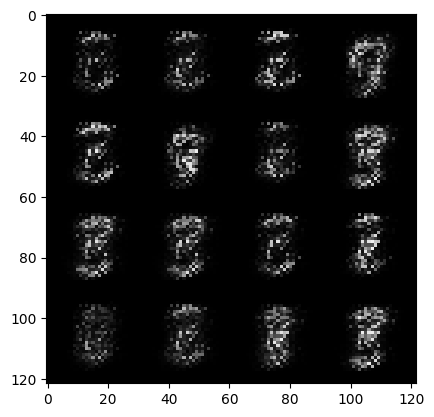

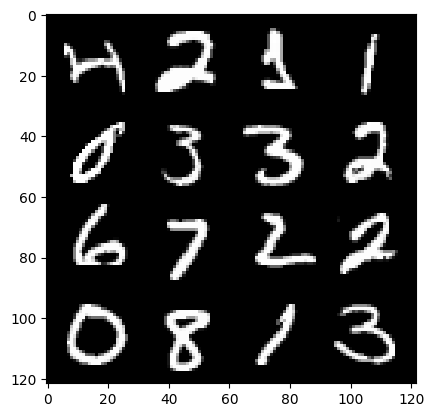

6: step 3000/ Gen loss: 2.5073943702379866 / disc_loss: 1.746064791306853


  0%|          | 0/469 [00:00<?, ?it/s]

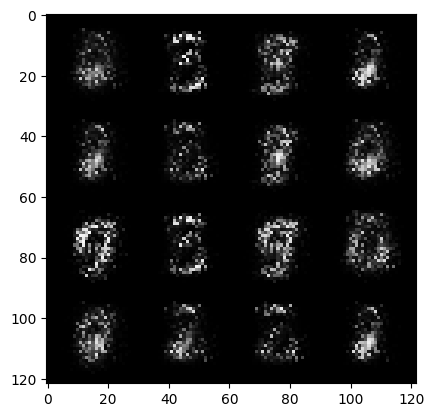

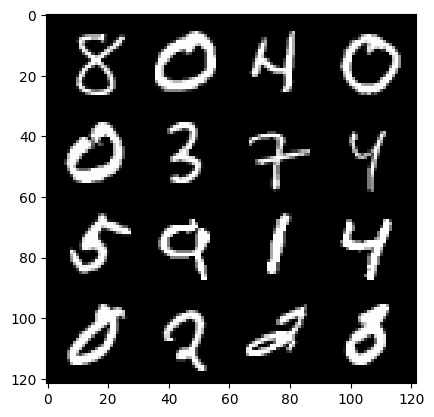

7: step 3300/ Gen loss: 2.6555600333213802 / disc_loss: 1.8103643796220434


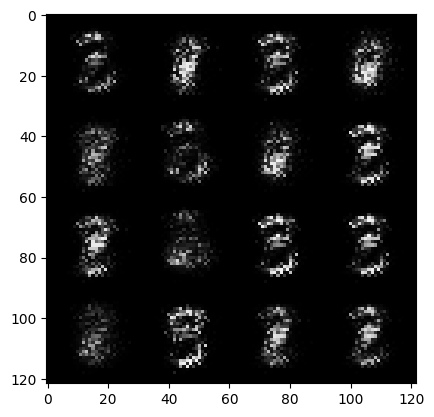

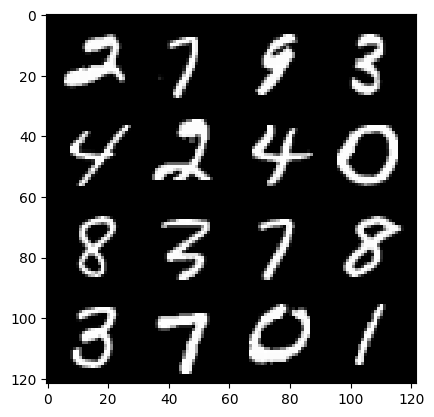

7: step 3600/ Gen loss: 2.8079442731539395 / disc_loss: 1.8731925491119423


  0%|          | 0/469 [00:00<?, ?it/s]

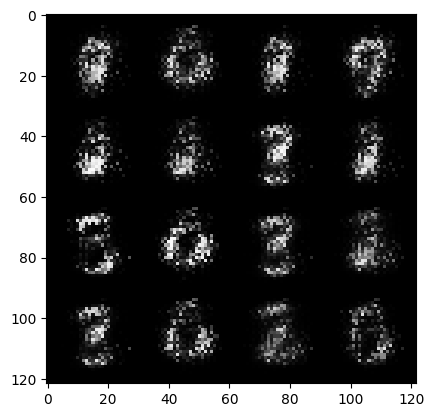

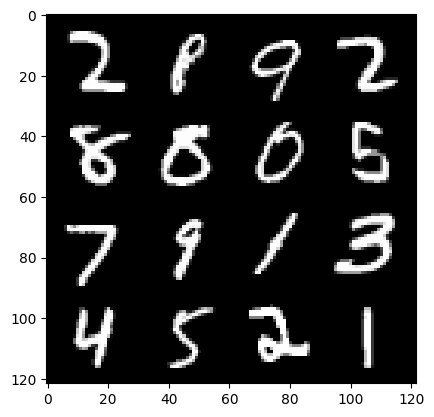

8: step 3900/ Gen loss: 2.947824432055154 / disc_loss: 1.9301415350536482


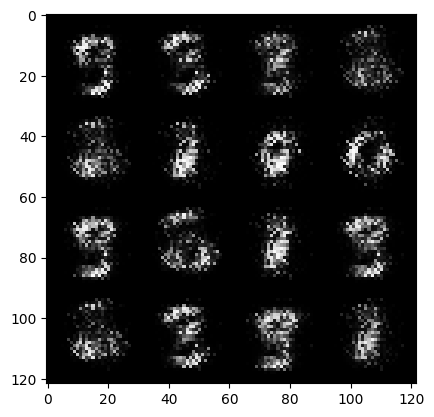

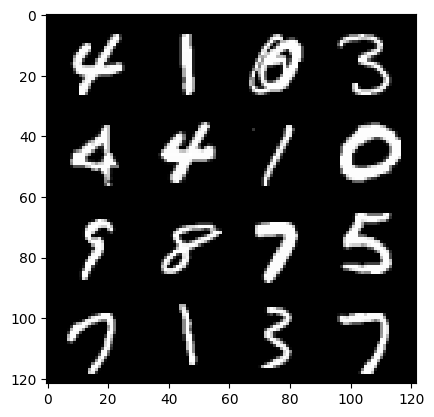

8: step 4200/ Gen loss: 3.1780703560511268 / disc_loss: 1.9783252803484574


  0%|          | 0/469 [00:00<?, ?it/s]

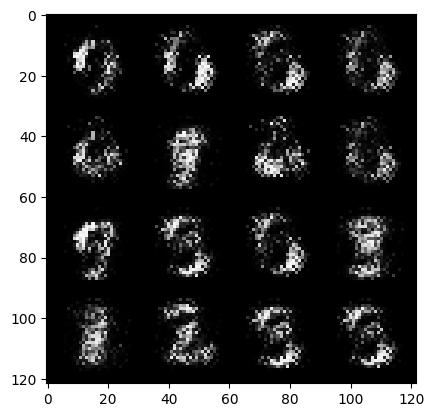

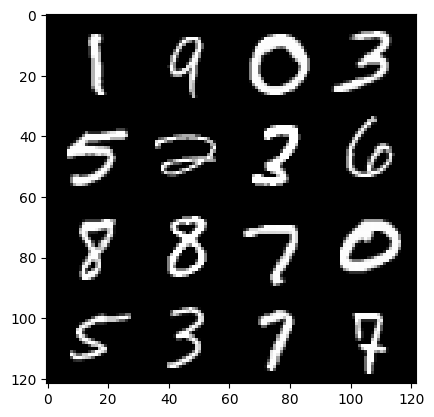

9: step 4500/ Gen loss: 3.371477630933129 / disc_loss: 2.018735025556135


  0%|          | 0/469 [00:00<?, ?it/s]

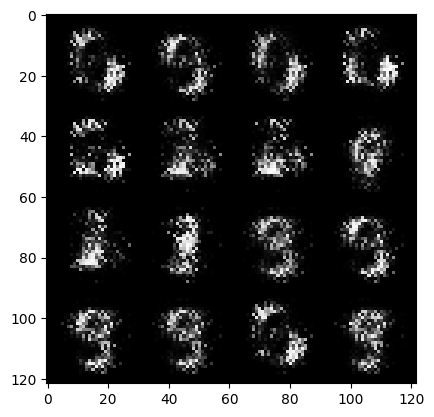

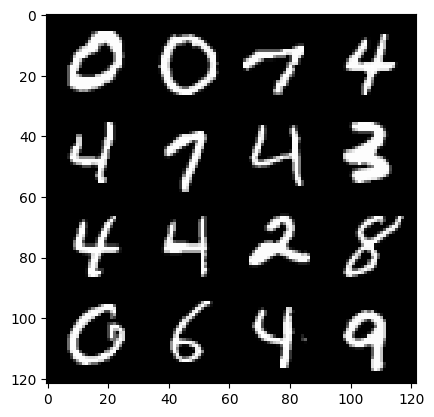

10: step 4800/ Gen loss: 3.5790158367156963 / disc_loss: 2.0549283086756858


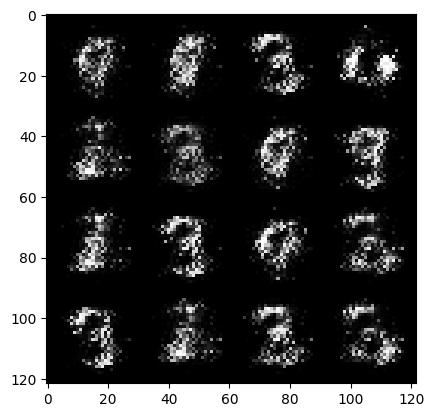

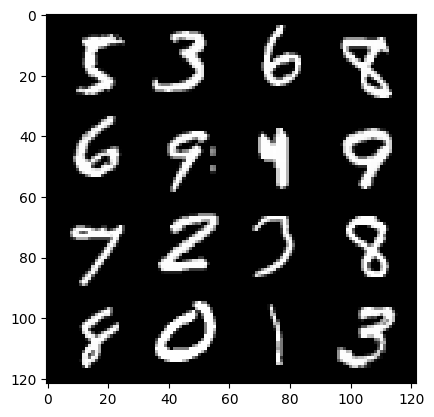

10: step 5100/ Gen loss: 3.8842944860458393 / disc_loss: 2.0846535456180573


  0%|          | 0/469 [00:00<?, ?it/s]

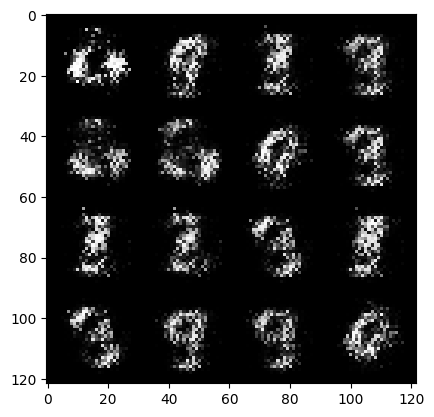

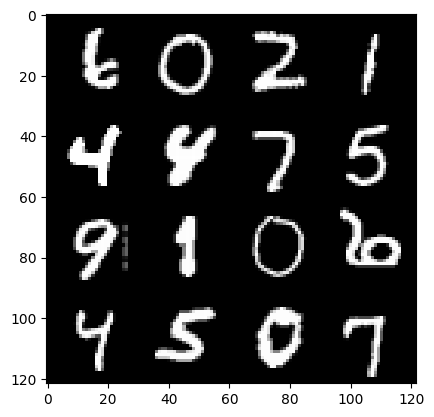

11: step 5400/ Gen loss: 3.9144207557042456 / disc_loss: 2.1121463007821433


  0%|          | 0/469 [00:00<?, ?it/s]

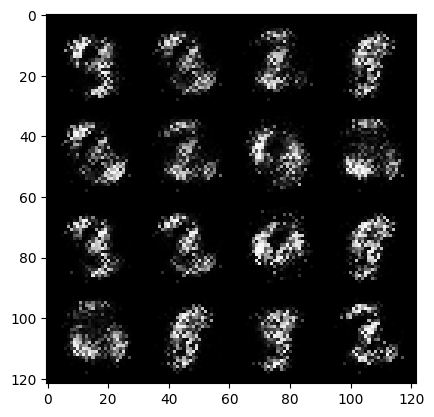

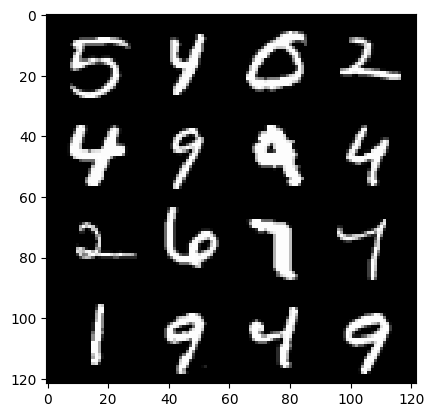

12: step 5700/ Gen loss: 3.9979993120829262 / disc_loss: 2.139059727204346


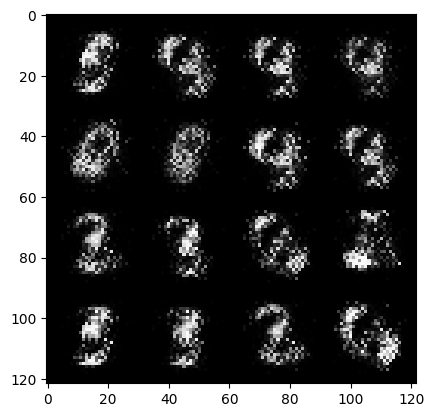

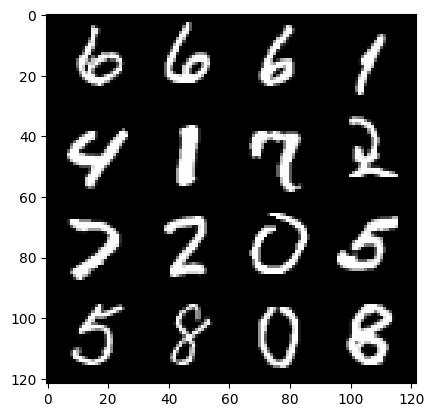

12: step 6000/ Gen loss: 4.116748157342278 / disc_loss: 2.1649784050105785


  0%|          | 0/469 [00:00<?, ?it/s]

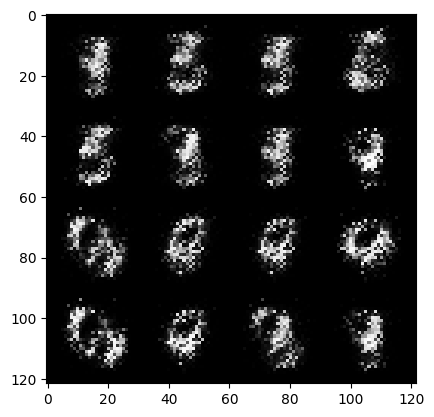

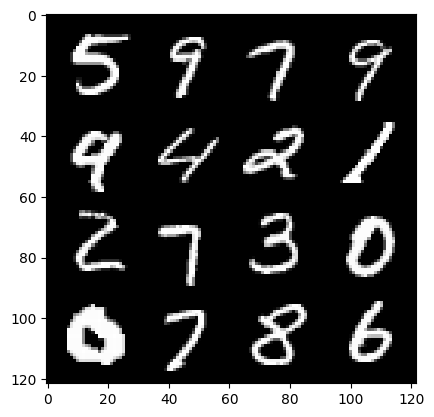

13: step 6300/ Gen loss: 3.9876728439331077 / disc_loss: 2.194592292175318


  0%|          | 0/469 [00:00<?, ?it/s]

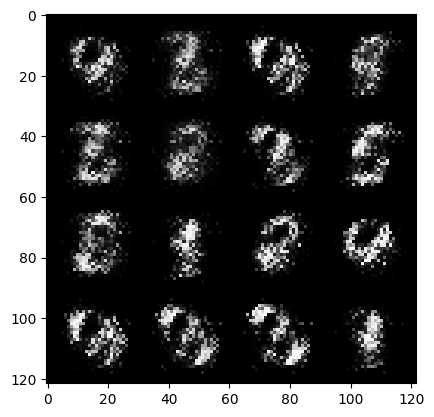

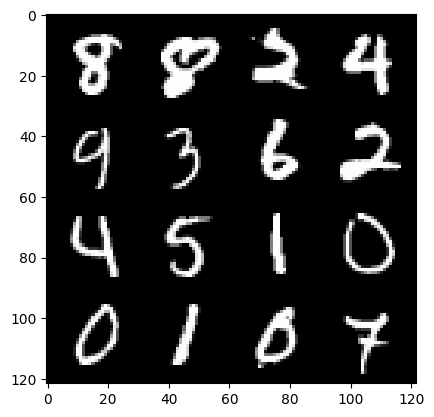

14: step 6600/ Gen loss: 4.093599571386971 / disc_loss: 2.224602109973011


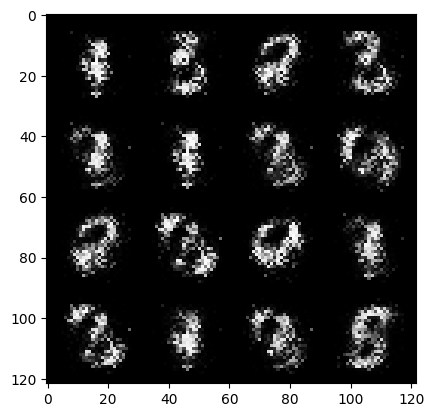

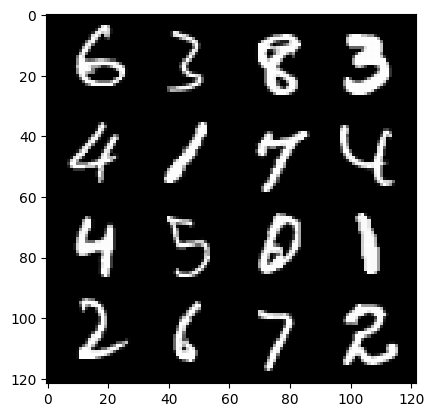

14: step 6900/ Gen loss: 4.239254008134207 / disc_loss: 2.2529063420308164


  0%|          | 0/469 [00:00<?, ?it/s]

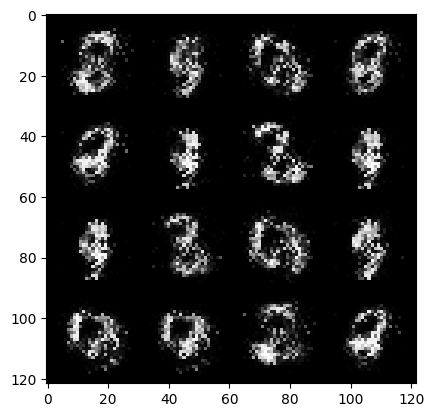

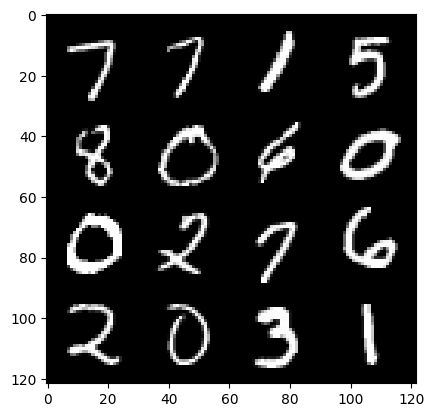

15: step 7200/ Gen loss: 4.327063893477121 / disc_loss: 2.2782907429616923


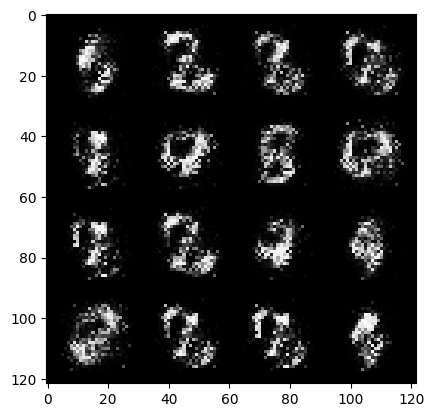

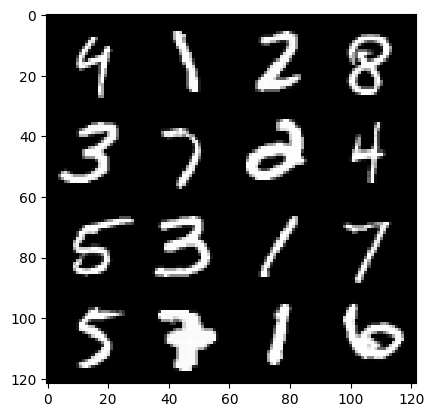

15: step 7500/ Gen loss: 4.421246148745221 / disc_loss: 2.3037604083803824


  0%|          | 0/469 [00:00<?, ?it/s]

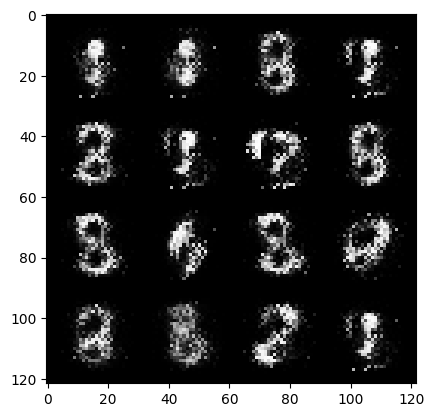

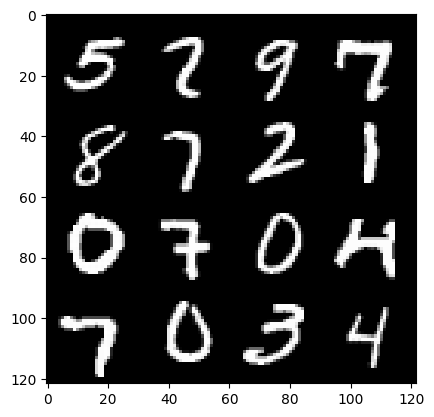

16: step 7800/ Gen loss: 4.52335414648056 / disc_loss: 2.331352858080842


  0%|          | 0/469 [00:00<?, ?it/s]

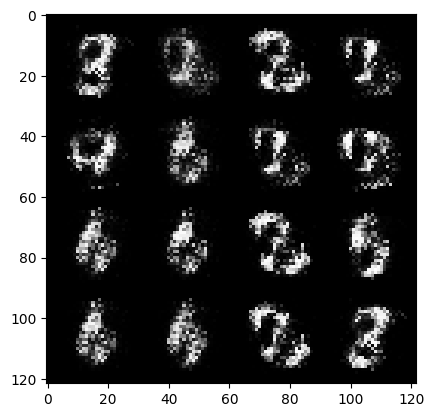

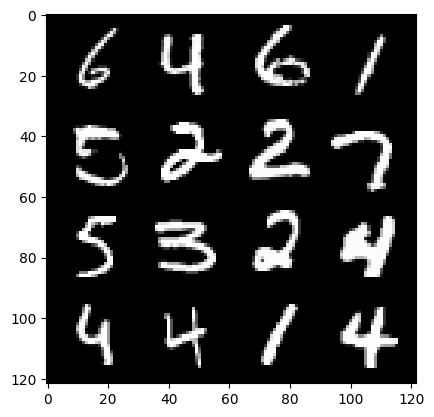

17: step 8100/ Gen loss: 4.3900078105926506 / disc_loss: 2.360503476395584


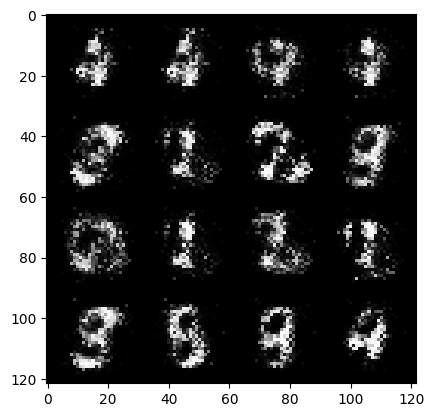

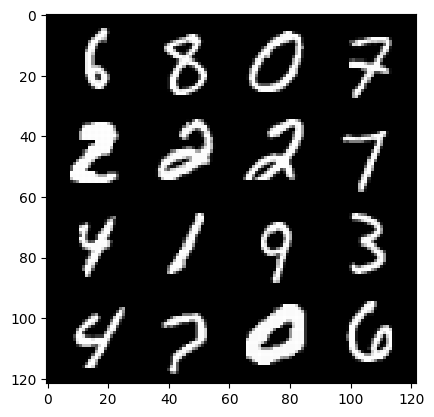

17: step 8400/ Gen loss: 4.590375466346739 / disc_loss: 2.387617957694458


  0%|          | 0/469 [00:00<?, ?it/s]

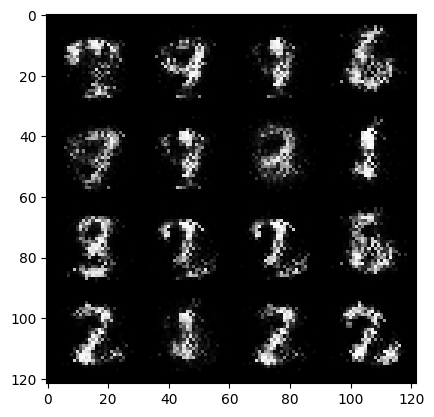

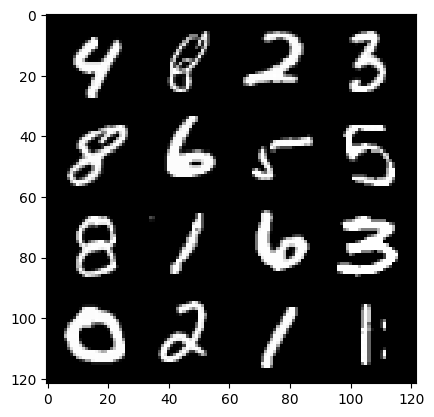

18: step 8700/ Gen loss: 4.598487674395242 / disc_loss: 2.4128647979069475


  0%|          | 0/469 [00:00<?, ?it/s]

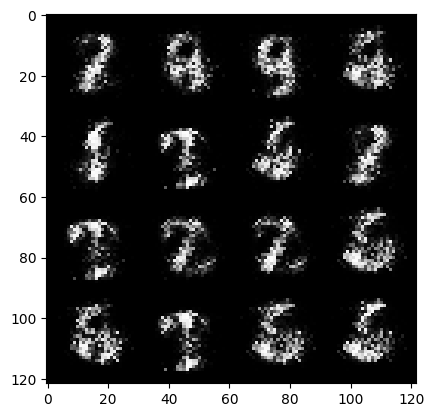

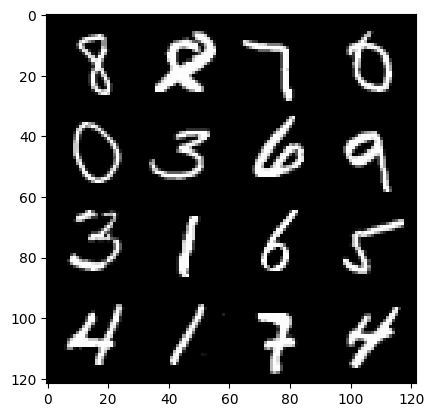

19: step 9000/ Gen loss: 4.633672030766803 / disc_loss: 2.433900905173889


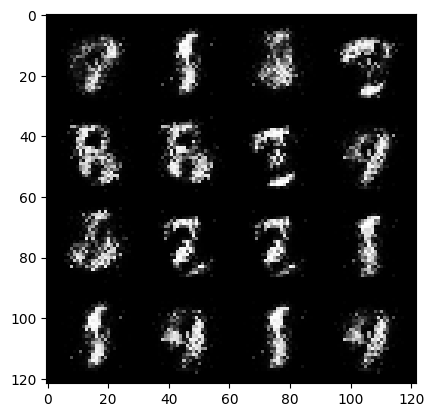

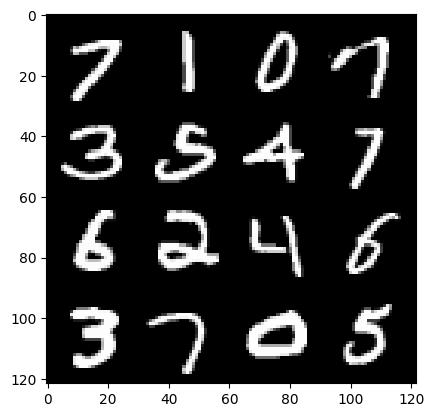

19: step 9300/ Gen loss: 4.563590788841248 / disc_loss: 2.458310695930068


  0%|          | 0/469 [00:00<?, ?it/s]

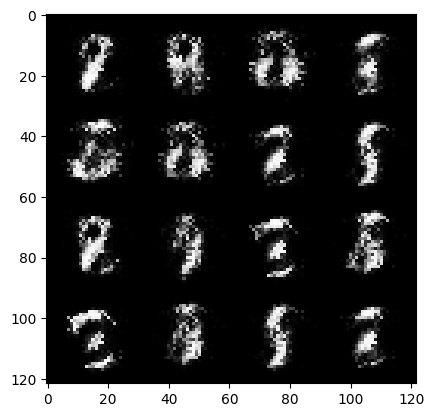

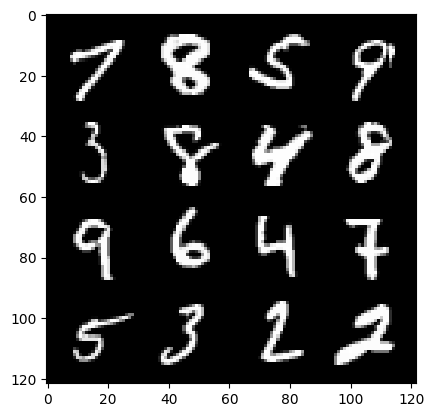

20: step 9600/ Gen loss: 4.214844179948174 / disc_loss: 2.491975297095867


  0%|          | 0/469 [00:00<?, ?it/s]

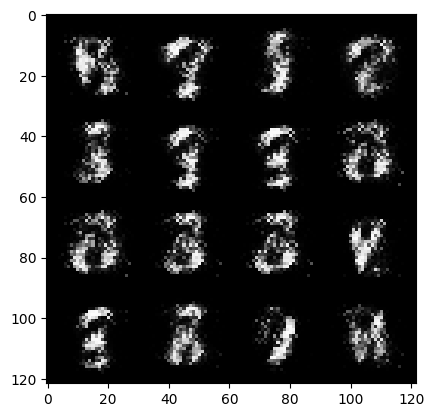

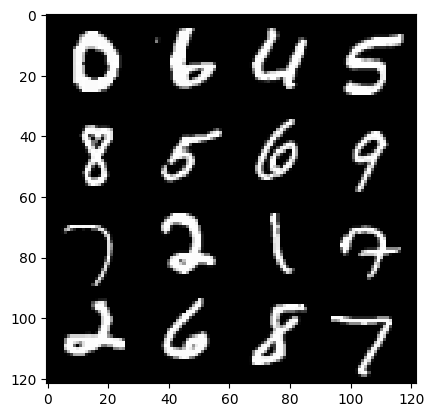

21: step 9900/ Gen loss: 4.08110265493393 / disc_loss: 2.525341041277465


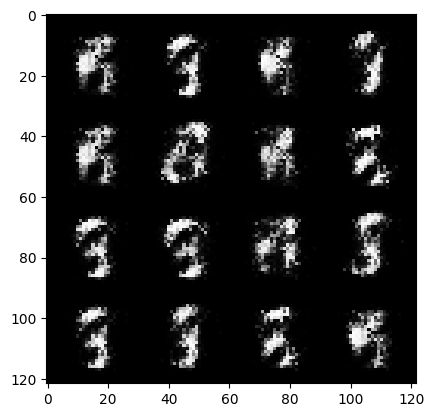

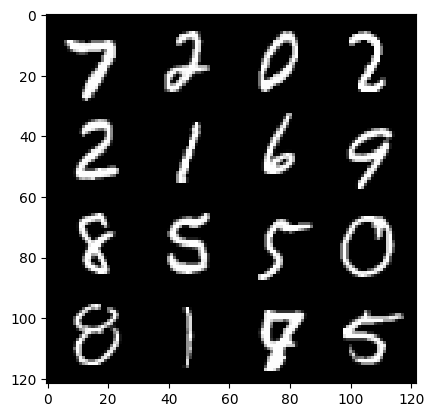

21: step 10200/ Gen loss: 4.154526311556499 / disc_loss: 2.558379327679672


  0%|          | 0/469 [00:00<?, ?it/s]

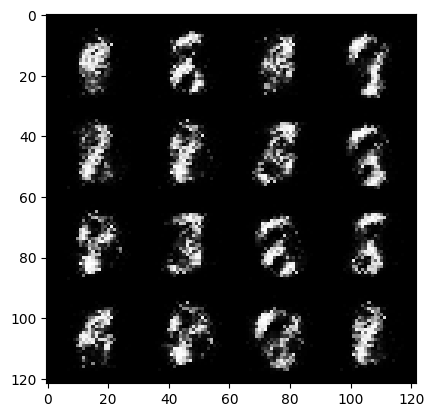

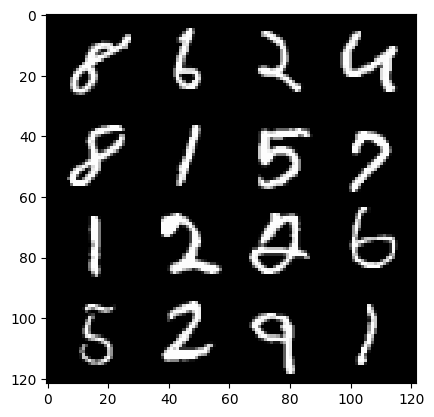

22: step 10500/ Gen loss: 4.033126198450724 / disc_loss: 2.595347422901539


  0%|          | 0/469 [00:00<?, ?it/s]

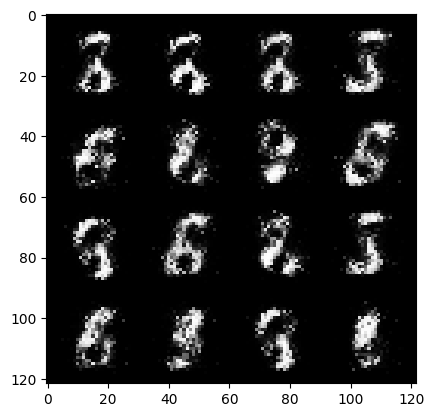

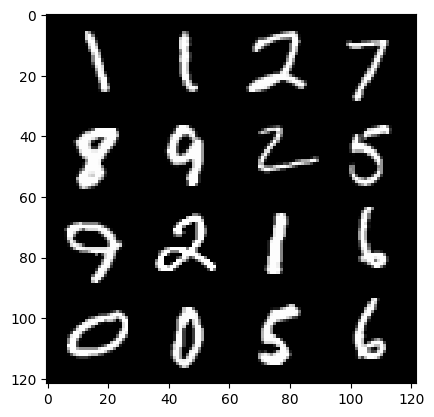

23: step 10800/ Gen loss: 4.180079961617785 / disc_loss: 2.6263271882291885


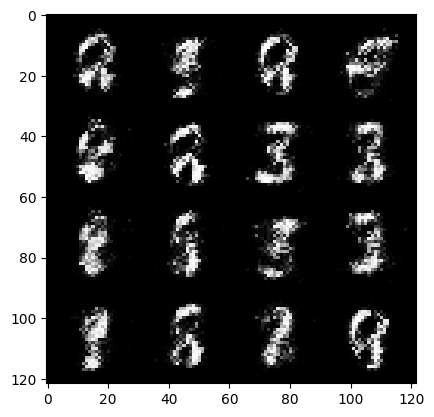

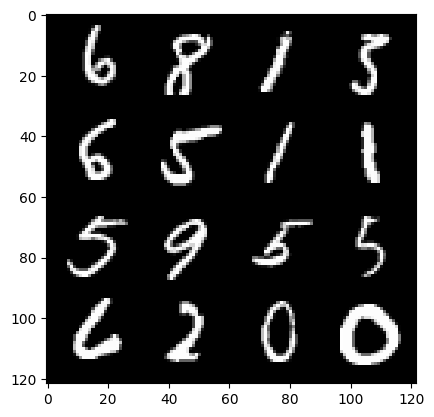

23: step 11100/ Gen loss: 4.3293913769721994 / disc_loss: 2.655264683753873


  0%|          | 0/469 [00:00<?, ?it/s]

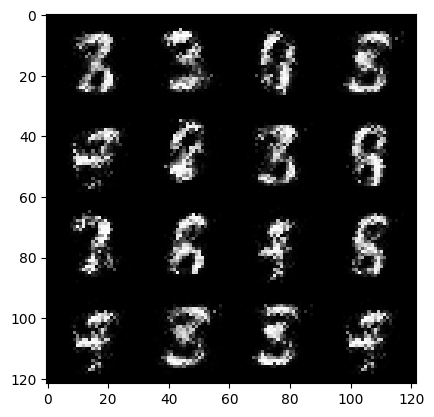

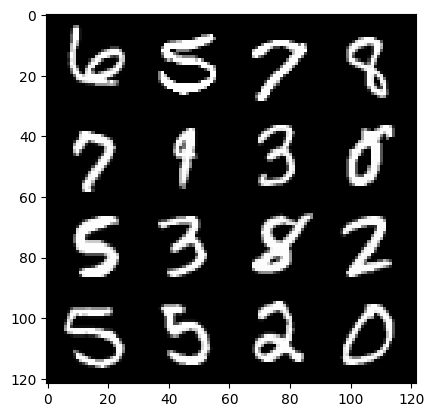

24: step 11400/ Gen loss: 4.493395674228672 / disc_loss: 2.6821875479724264


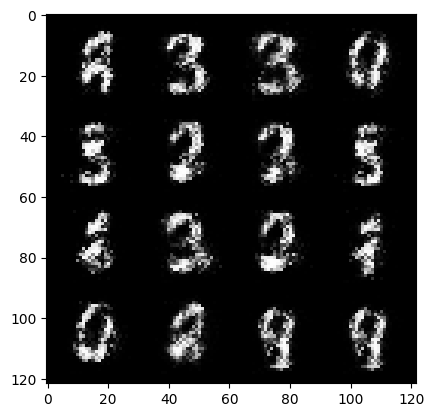

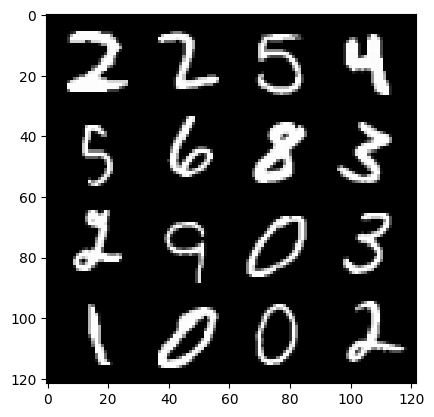

24: step 11700/ Gen loss: 4.2631851991017635 / disc_loss: 2.716262896268935


  0%|          | 0/469 [00:00<?, ?it/s]

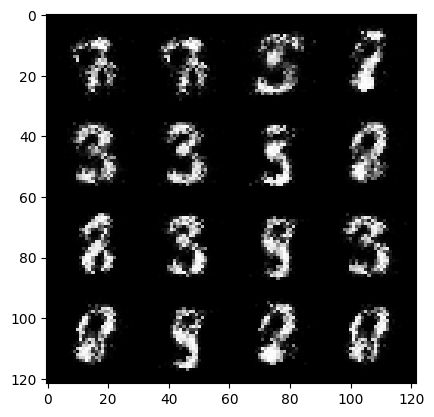

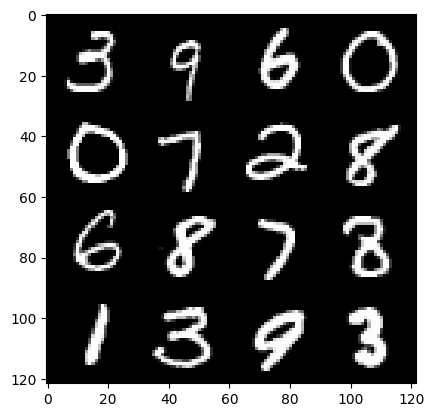

25: step 12000/ Gen loss: 4.128345753351848 / disc_loss: 2.754169342651339


  0%|          | 0/469 [00:00<?, ?it/s]

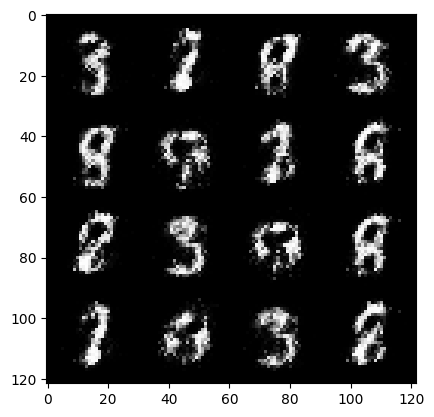

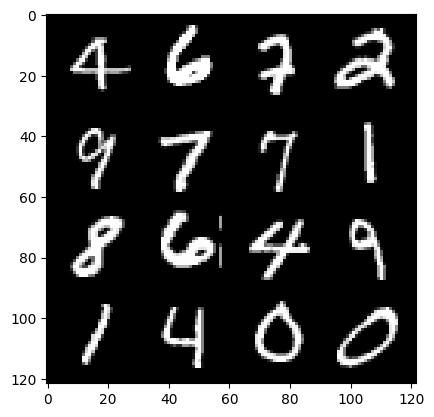

26: step 12300/ Gen loss: 4.200264598528545 / disc_loss: 2.787385362700244


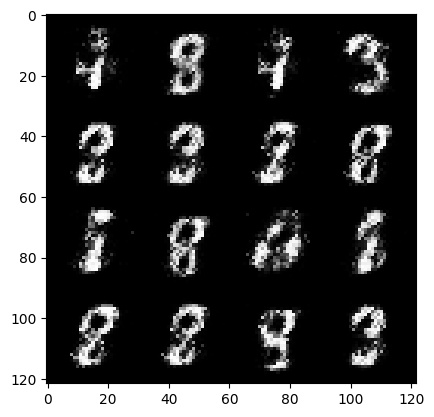

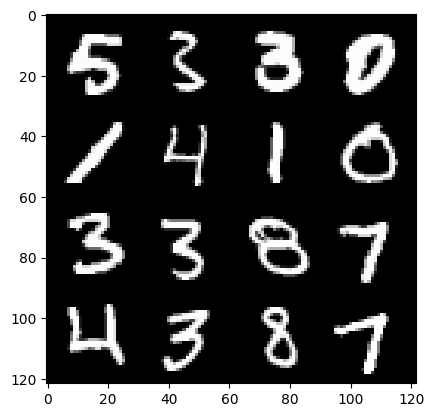

26: step 12600/ Gen loss: 4.080935535430909 / disc_loss: 2.824737638781466


  0%|          | 0/469 [00:00<?, ?it/s]

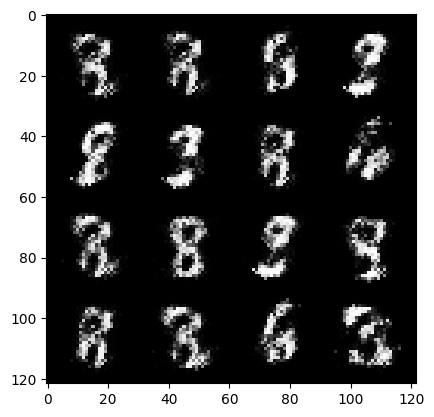

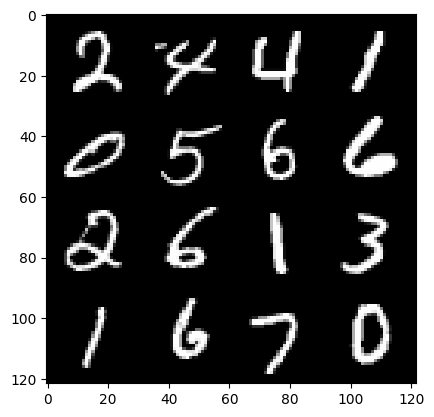

27: step 12900/ Gen loss: 4.187335569063822 / disc_loss: 2.8635565889564645


  0%|          | 0/469 [00:00<?, ?it/s]

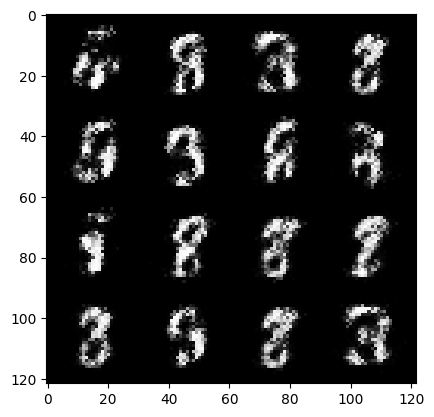

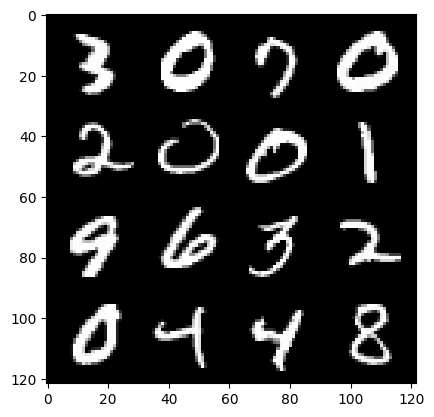

28: step 13200/ Gen loss: 4.096591487725576 / disc_loss: 2.910234909597785


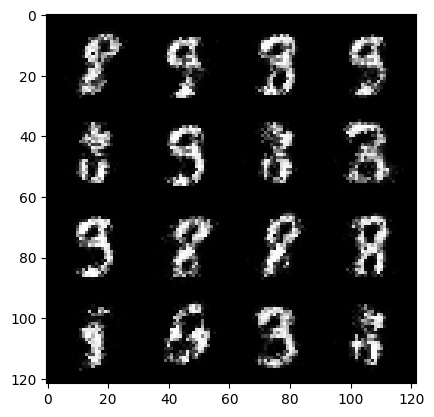

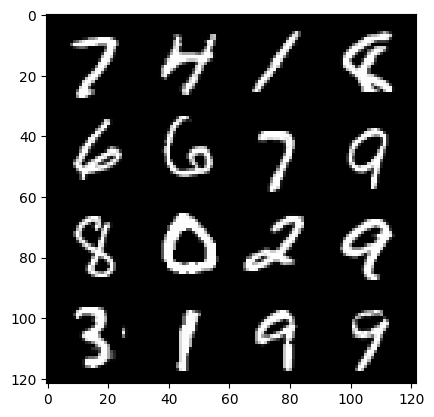

28: step 13500/ Gen loss: 4.036130256652834 / disc_loss: 2.9554026624249907


  0%|          | 0/469 [00:00<?, ?it/s]

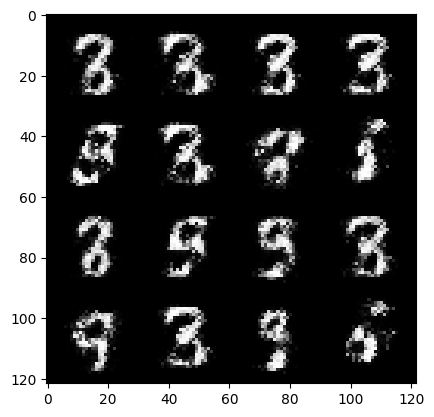

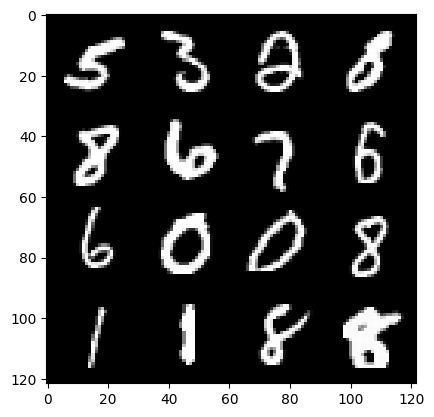

29: step 13800/ Gen loss: 4.196926479339598 / disc_loss: 2.995220891280721


  0%|          | 0/469 [00:00<?, ?it/s]

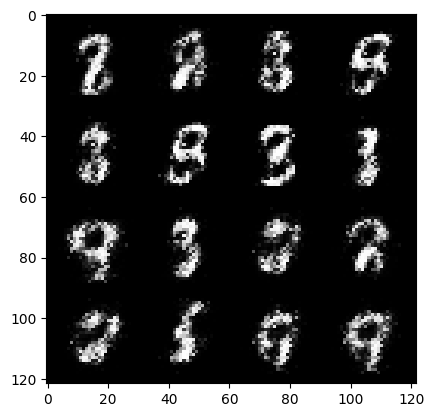

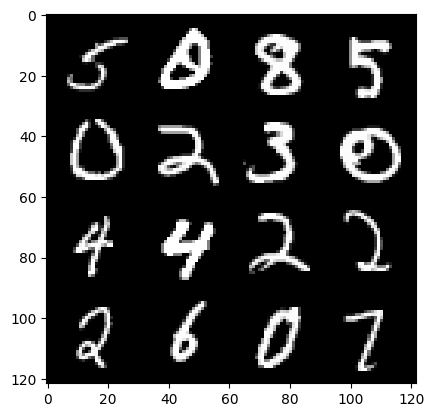

30: step 14100/ Gen loss: 4.230045930544534 / disc_loss: 3.0345939405635005


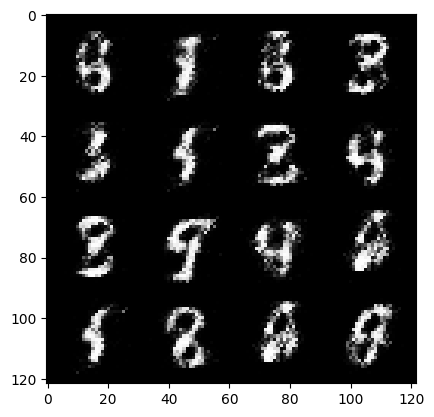

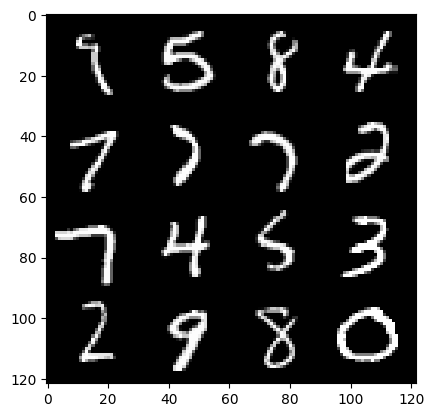

30: step 14400/ Gen loss: 4.112896751562754 / disc_loss: 3.0798867235736305


  0%|          | 0/469 [00:00<?, ?it/s]

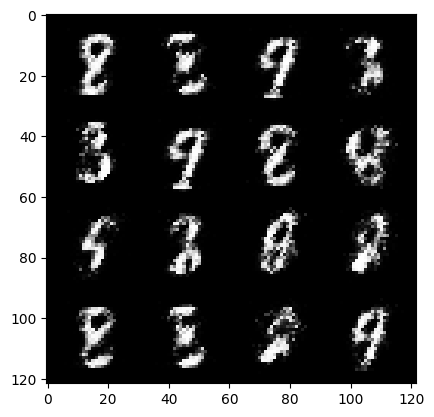

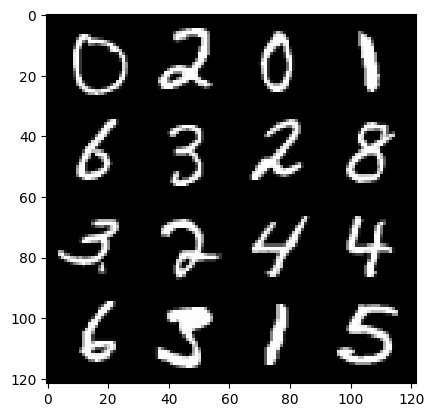

31: step 14700/ Gen loss: 3.931428882280986 / disc_loss: 3.1295210914965743


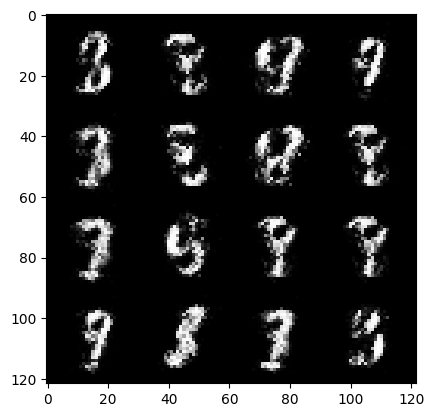

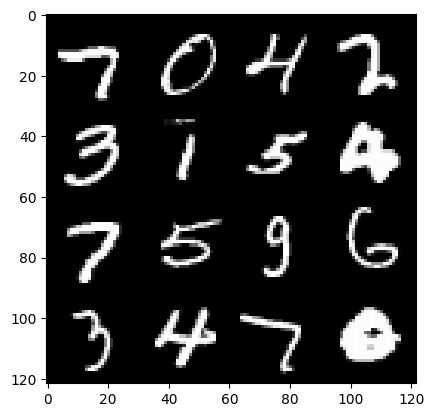

31: step 15000/ Gen loss: 3.8336839731534353 / disc_loss: 3.1825178172967106


  0%|          | 0/469 [00:00<?, ?it/s]

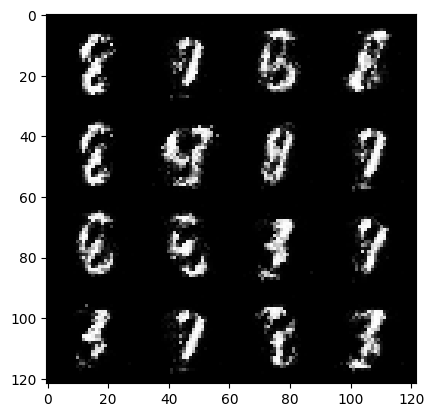

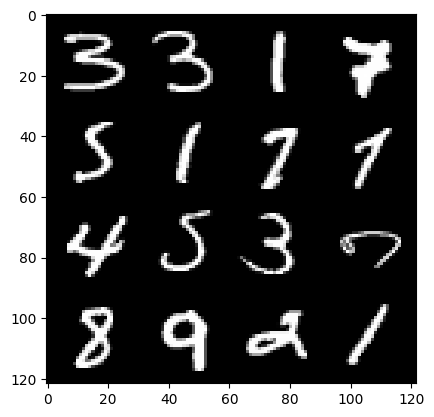

32: step 15300/ Gen loss: 3.860177428722381 / disc_loss: 3.2317343814081214


  0%|          | 0/469 [00:00<?, ?it/s]

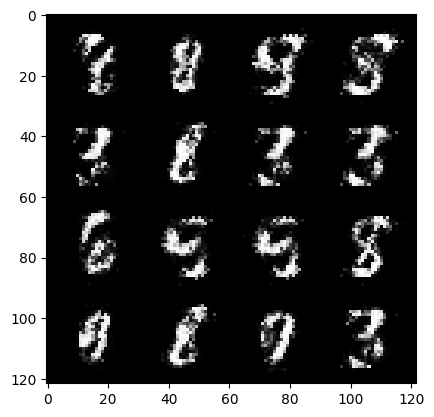

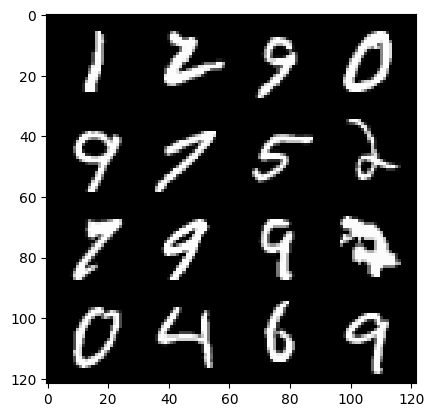

33: step 15600/ Gen loss: 4.139276008605956 / disc_loss: 3.2745779249537756


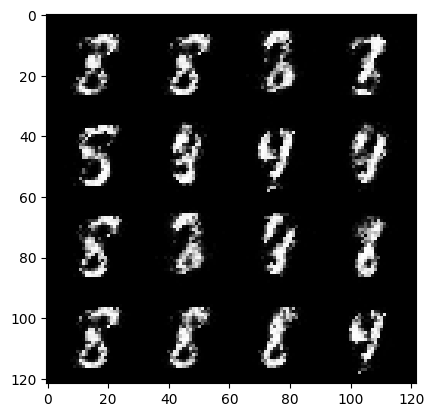

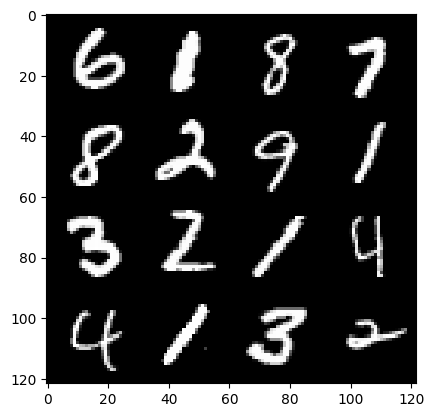

33: step 15900/ Gen loss: 4.022446144421894 / disc_loss: 3.3193905699687747


  0%|          | 0/469 [00:00<?, ?it/s]

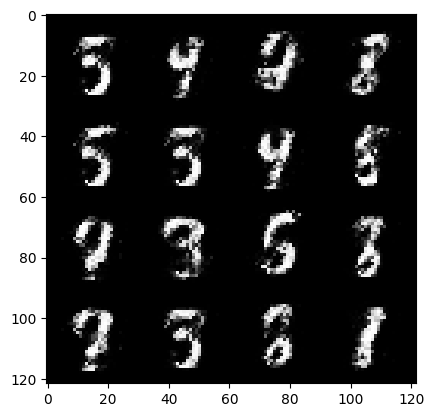

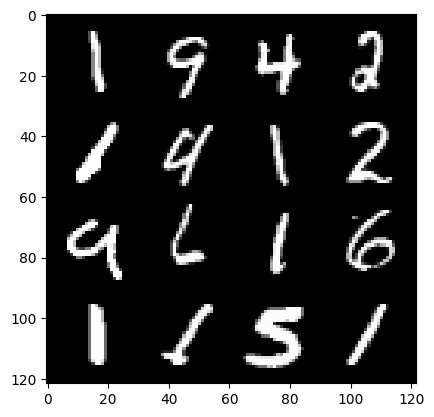

34: step 16200/ Gen loss: 3.905335770448048 / disc_loss: 3.373500885795814


  0%|          | 0/469 [00:00<?, ?it/s]

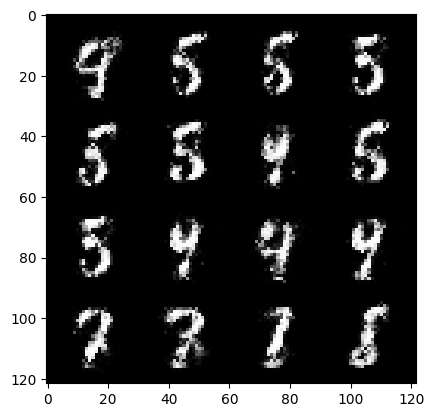

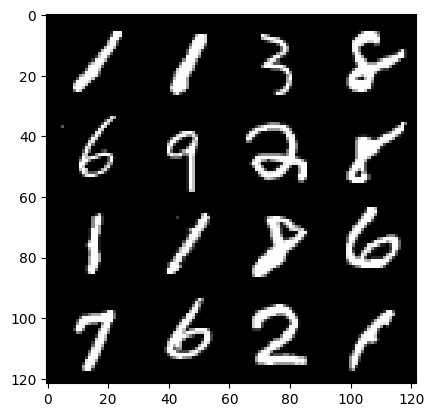

35: step 16500/ Gen loss: 4.10418739716212 / disc_loss: 3.4201725046460982


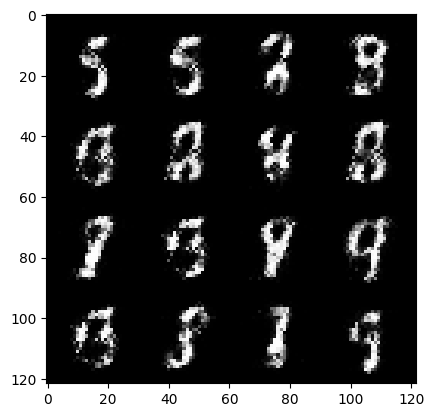

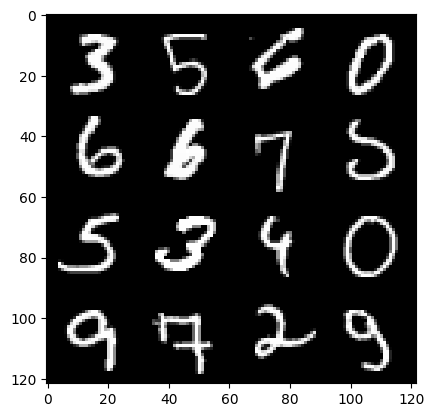

35: step 16800/ Gen loss: 4.081924453576412 / disc_loss: 3.4773519892618245


  0%|          | 0/469 [00:00<?, ?it/s]

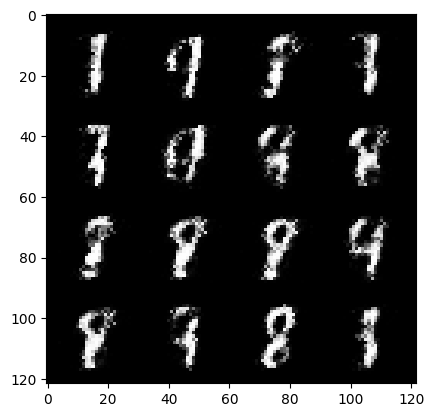

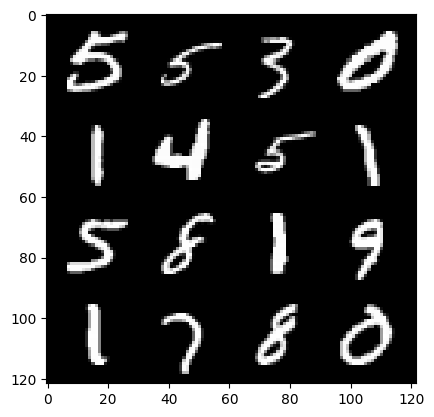

36: step 17100/ Gen loss: 3.9717648919423443 / disc_loss: 3.5415371032059384


  0%|          | 0/469 [00:00<?, ?it/s]

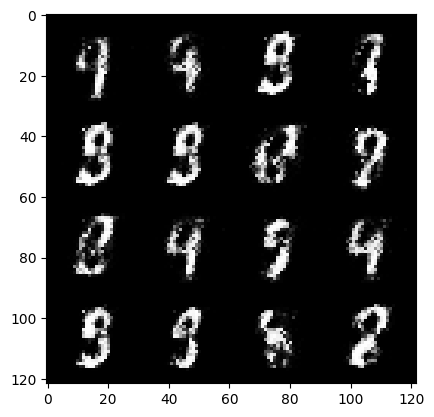

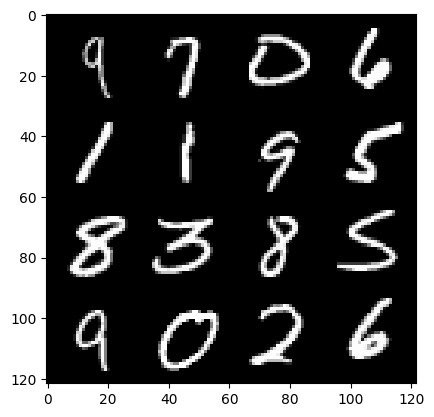

37: step 17400/ Gen loss: 3.7366047946612047 / disc_loss: 3.6190420344161685


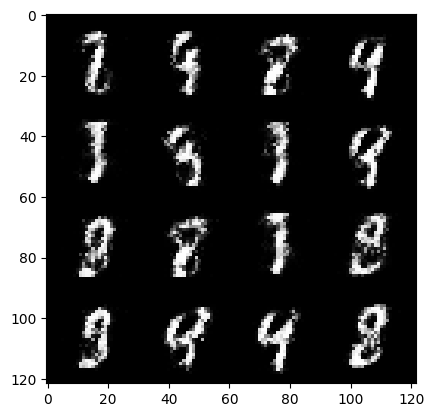

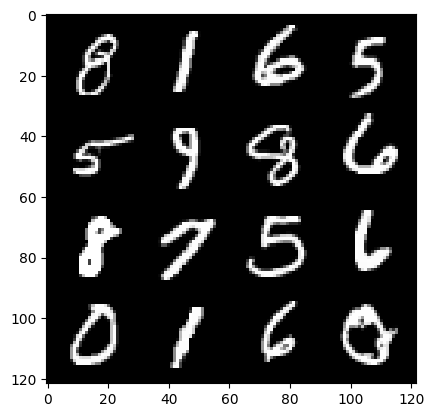

37: step 17700/ Gen loss: 3.82325847387314 / disc_loss: 3.6907546159563145


  0%|          | 0/469 [00:00<?, ?it/s]

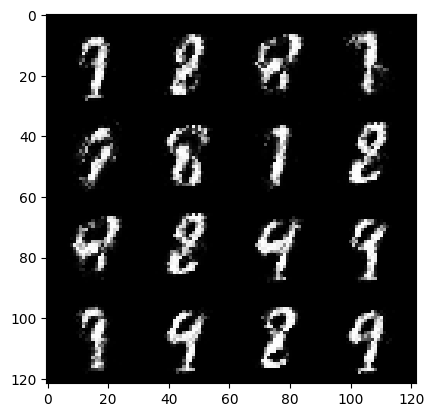

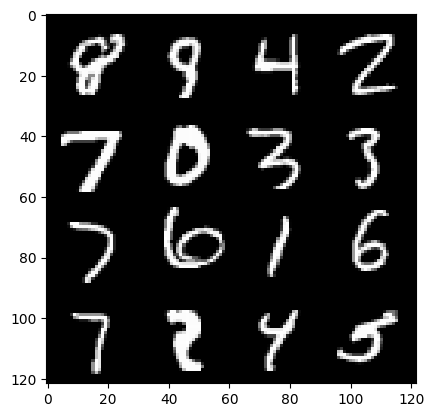

38: step 18000/ Gen loss: 3.679698599974316 / disc_loss: 3.7618739383729984


  0%|          | 0/469 [00:00<?, ?it/s]

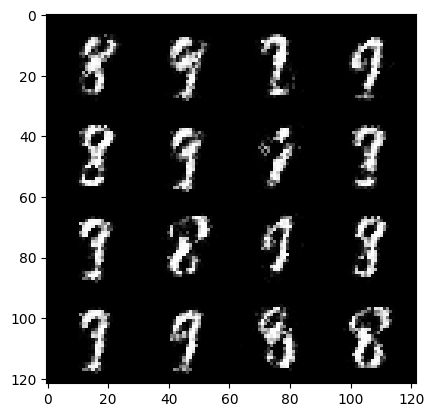

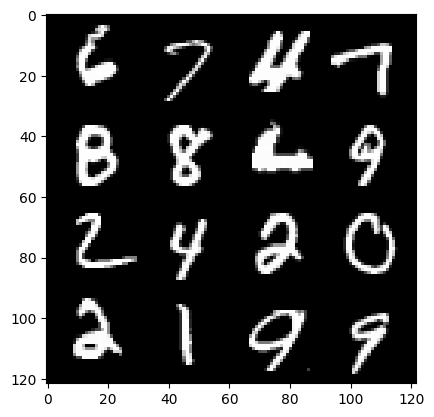

39: step 18300/ Gen loss: 3.7392487406730646 / disc_loss: 3.8321976875700234


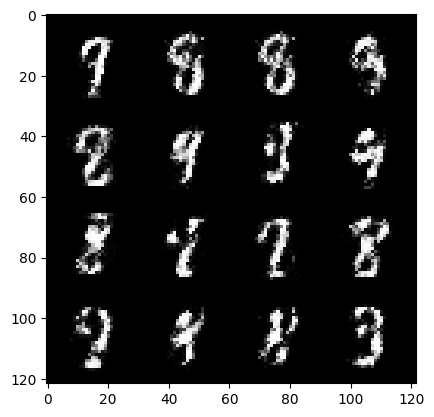

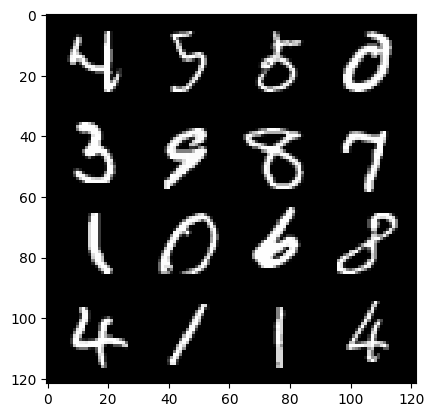

39: step 18600/ Gen loss: 3.8248608104387927 / disc_loss: 3.9020770364875745


  0%|          | 0/469 [00:00<?, ?it/s]

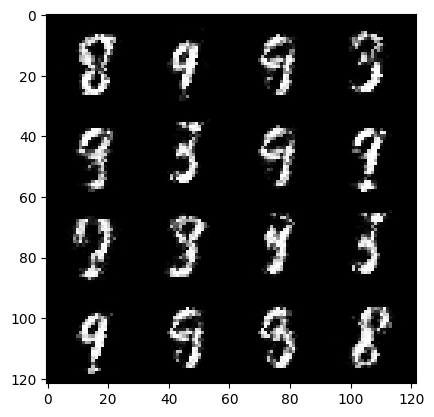

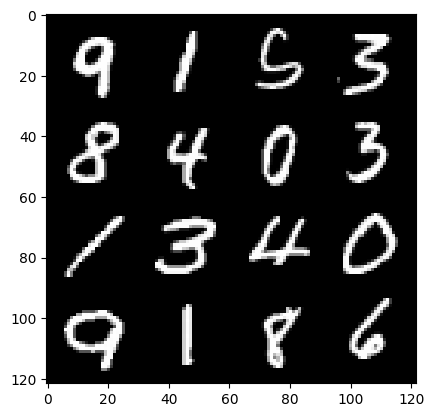

40: step 18900/ Gen loss: 3.831276510556539 / disc_loss: 3.9759365983928405


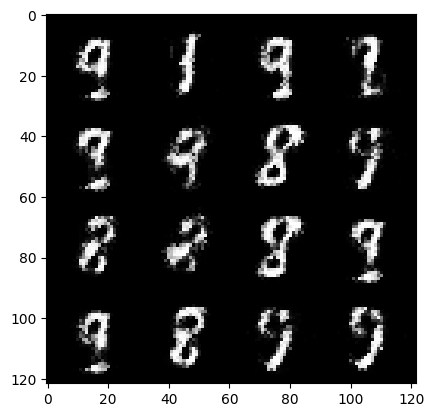

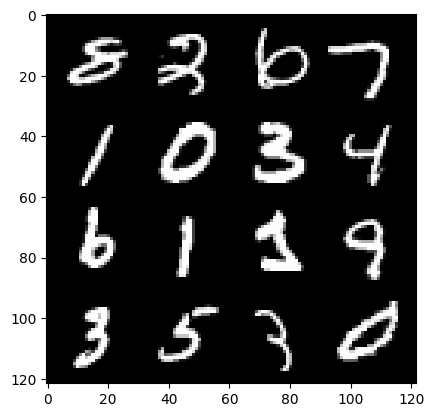

40: step 19200/ Gen loss: 3.9133780050277696 / disc_loss: 4.058451572228239


  0%|          | 0/469 [00:00<?, ?it/s]

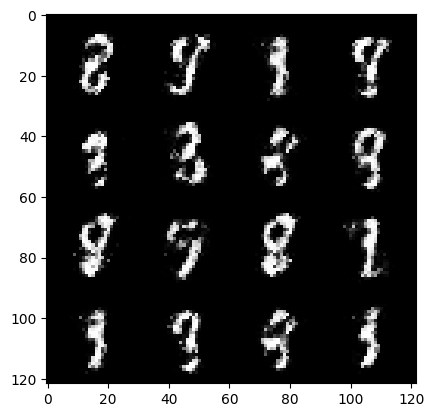

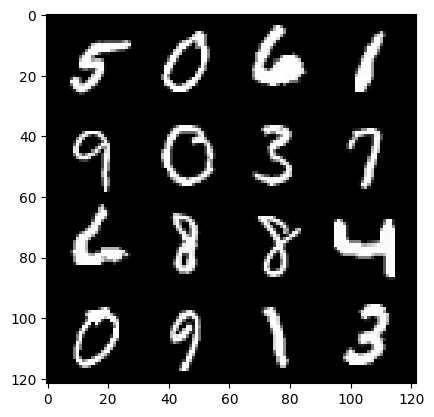

41: step 19500/ Gen loss: 3.702505835692091 / disc_loss: 4.143299528664623


  0%|          | 0/469 [00:00<?, ?it/s]

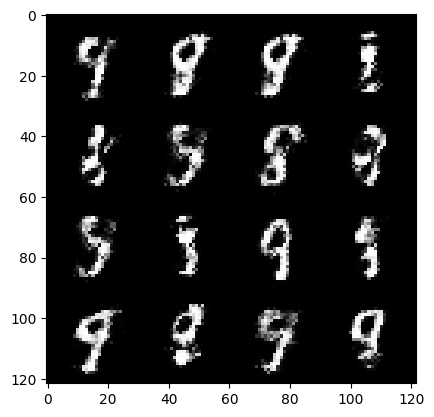

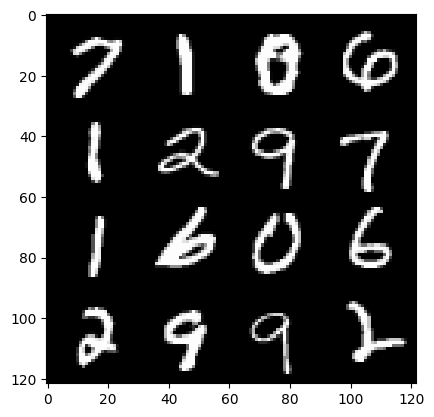

42: step 19800/ Gen loss: 3.7580025823911045 / disc_loss: 4.227100046090804


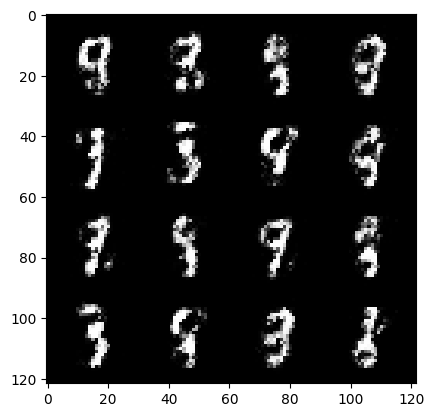

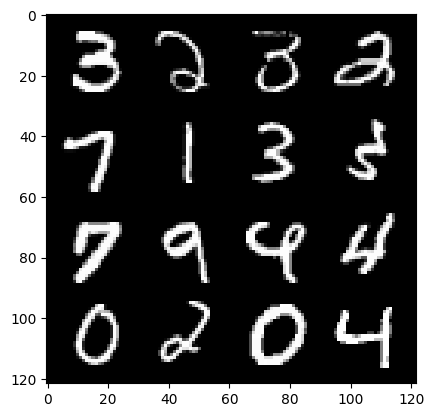

42: step 20100/ Gen loss: 3.74664221763611 / disc_loss: 4.306544709075258


  0%|          | 0/469 [00:00<?, ?it/s]

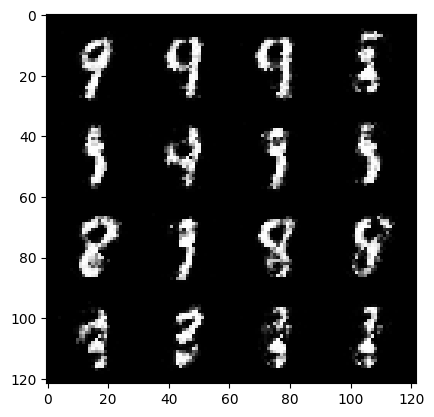

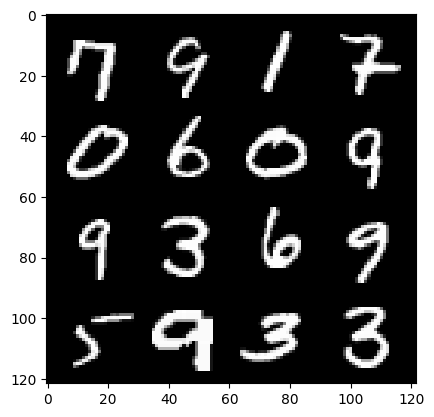

43: step 20400/ Gen loss: 3.8079918742179872 / disc_loss: 4.379123880174023


  0%|          | 0/469 [00:00<?, ?it/s]

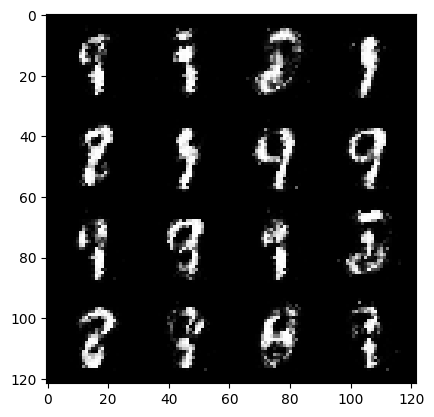

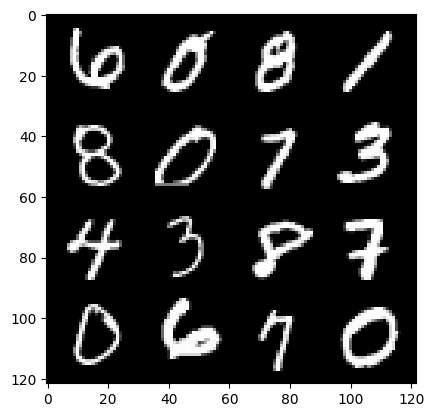

44: step 20700/ Gen loss: 3.6581286414464294 / disc_loss: 4.452816364001495


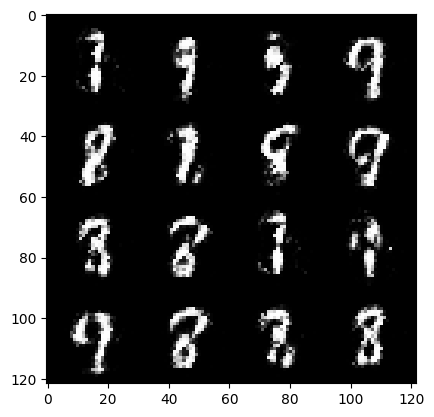

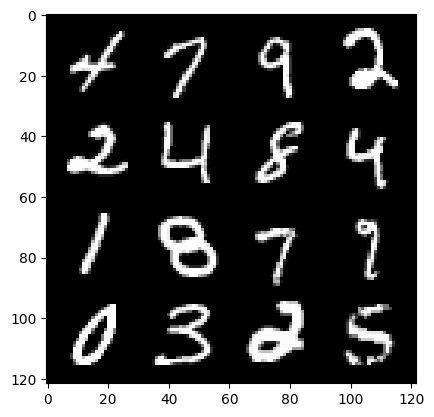

44: step 21000/ Gen loss: 3.8258582456906627 / disc_loss: 4.529759095503649


  0%|          | 0/469 [00:00<?, ?it/s]

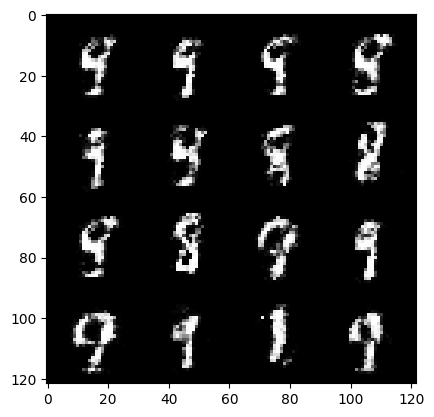

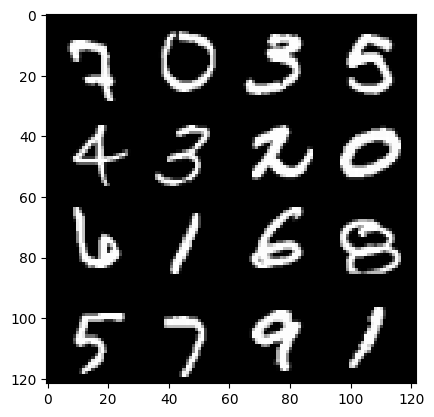

45: step 21300/ Gen loss: 3.459111184279125 / disc_loss: 4.634059670697913


  0%|          | 0/469 [00:00<?, ?it/s]

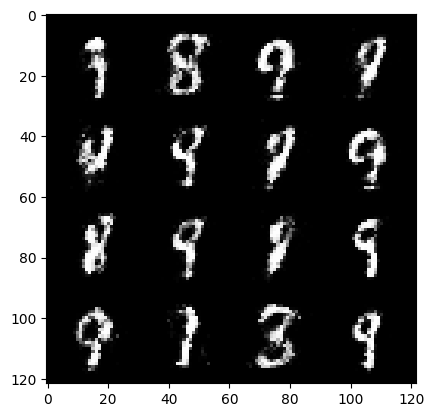

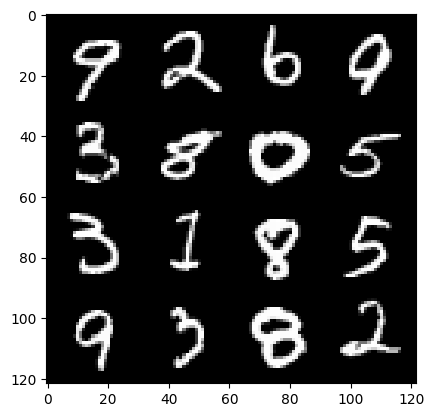

46: step 21600/ Gen loss: 3.6046406563123097 / disc_loss: 4.740048075746767


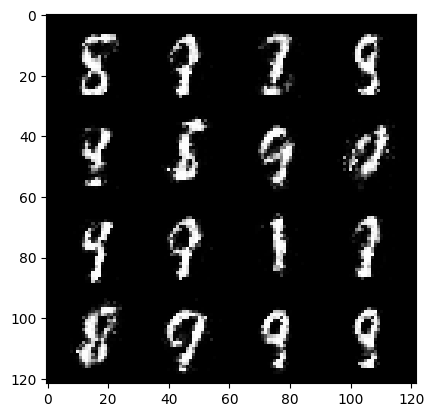

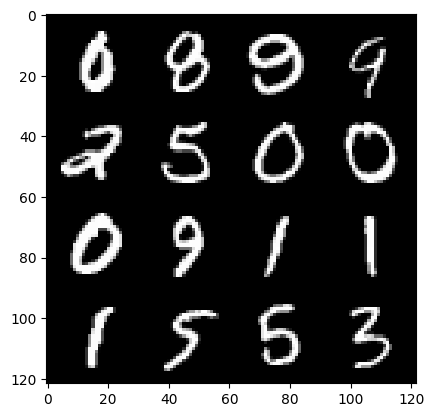

46: step 21900/ Gen loss: 3.5516984653472923 / disc_loss: 4.834278539462661


  0%|          | 0/469 [00:00<?, ?it/s]

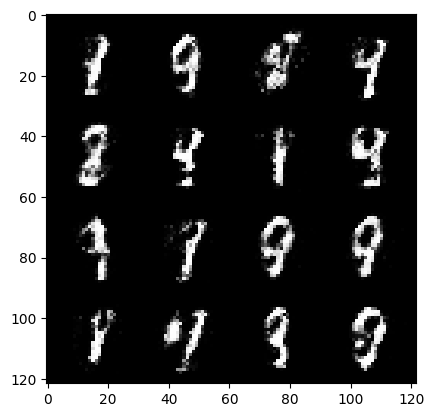

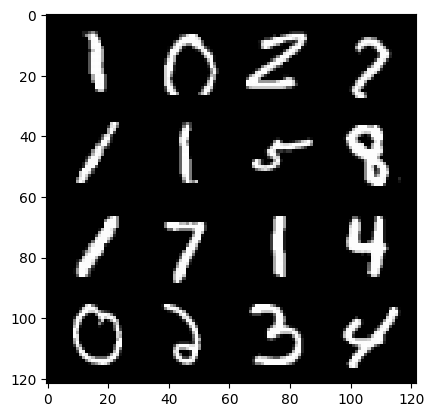

47: step 22200/ Gen loss: 3.5096128567059846 / disc_loss: 4.9328555175724365


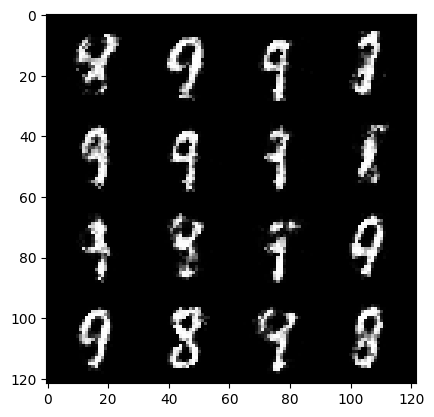

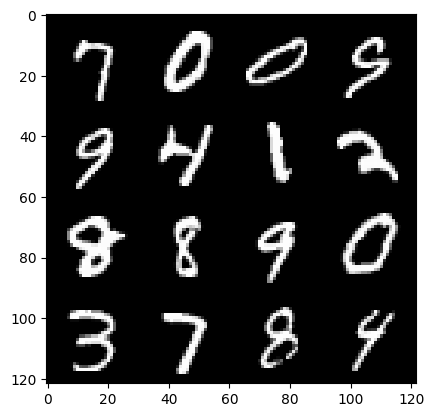

47: step 22500/ Gen loss: 3.545792065461476 / disc_loss: 5.041578890538494


  0%|          | 0/469 [00:00<?, ?it/s]

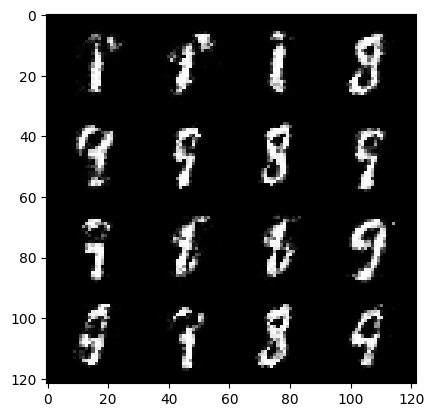

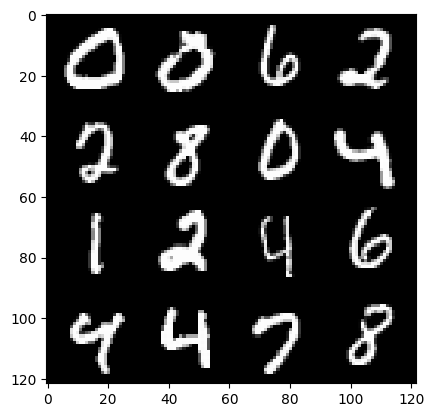

48: step 22800/ Gen loss: 3.4765465386708576 / disc_loss: 5.161074735081479


  0%|          | 0/469 [00:00<?, ?it/s]

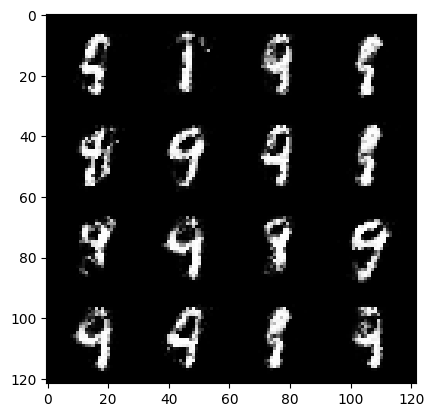

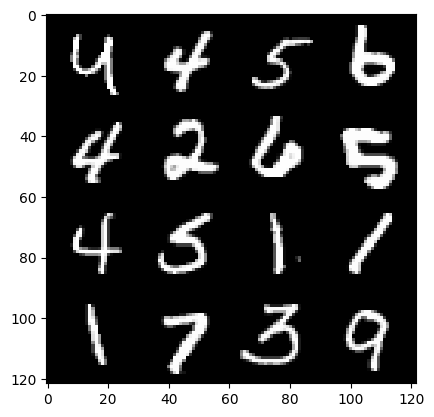

49: step 23100/ Gen loss: 3.291712493896485 / disc_loss: 5.282015540308037


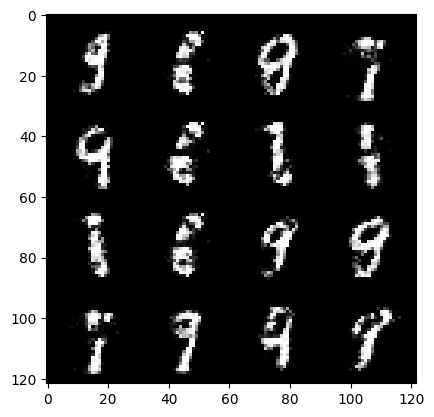

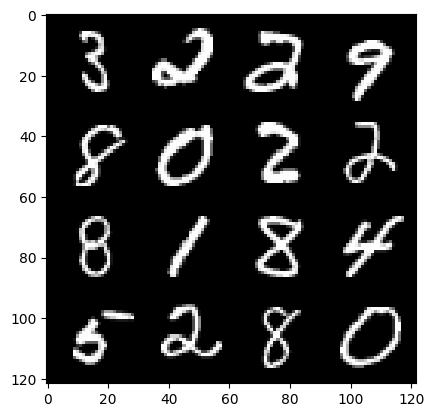

49: step 23400/ Gen loss: 3.3052153317133595 / disc_loss: 5.409934449599452


  0%|          | 0/469 [00:00<?, ?it/s]

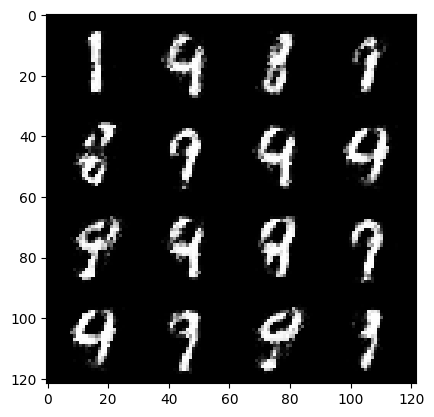

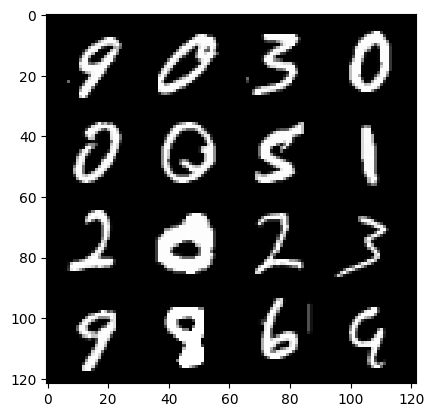

50: step 23700/ Gen loss: 3.2563552125295026 / disc_loss: 5.535352781917915


  0%|          | 0/469 [00:00<?, ?it/s]

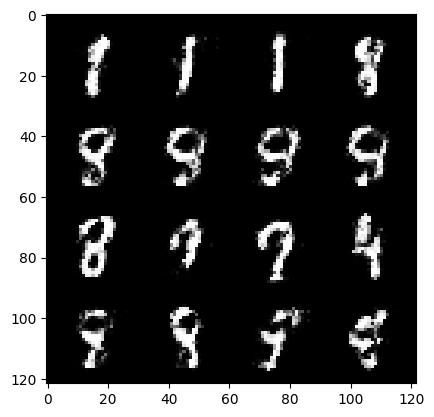

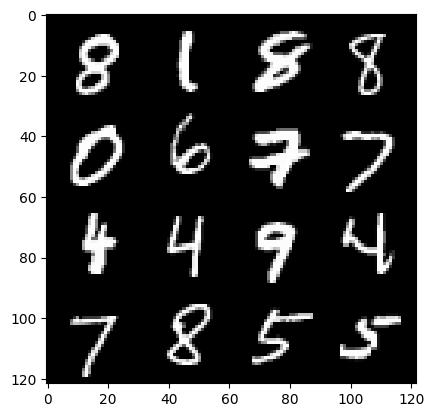

51: step 24000/ Gen loss: 3.353890563646952 / disc_loss: 5.6632687526506835


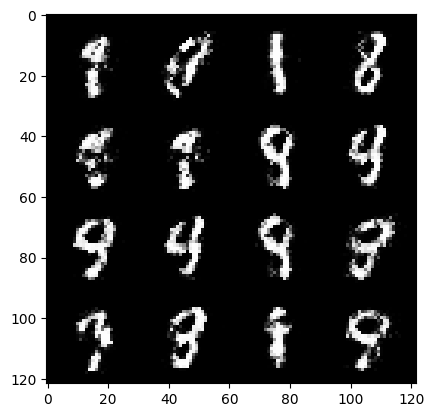

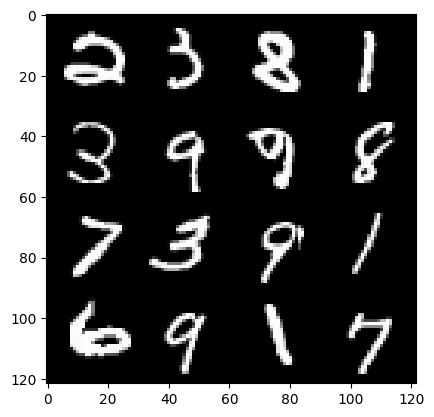

51: step 24300/ Gen loss: 3.2526515976587955 / disc_loss: 5.787162204887731


  0%|          | 0/469 [00:00<?, ?it/s]

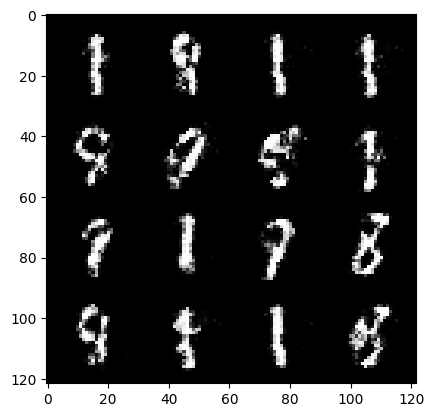

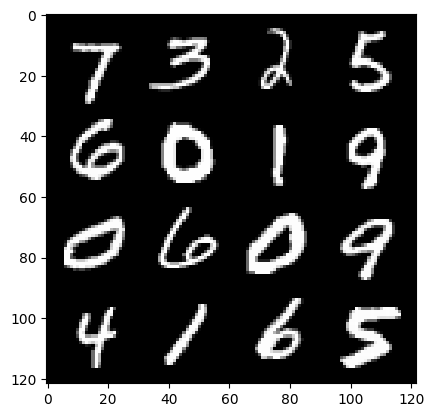

52: step 24600/ Gen loss: 3.2705853899319943 / disc_loss: 5.923069315906624


  0%|          | 0/469 [00:00<?, ?it/s]

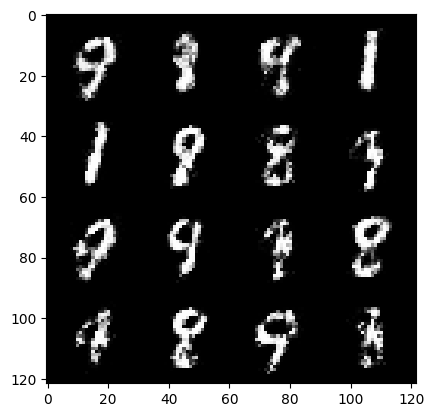

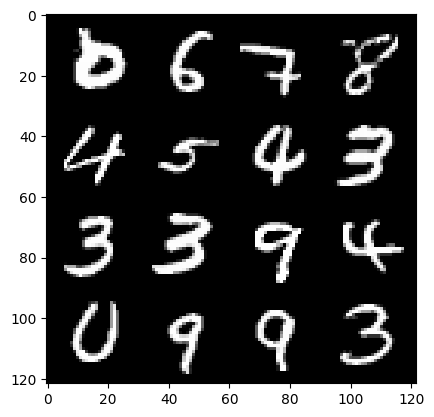

53: step 24900/ Gen loss: 3.252928133010866 / disc_loss: 6.081646573549763


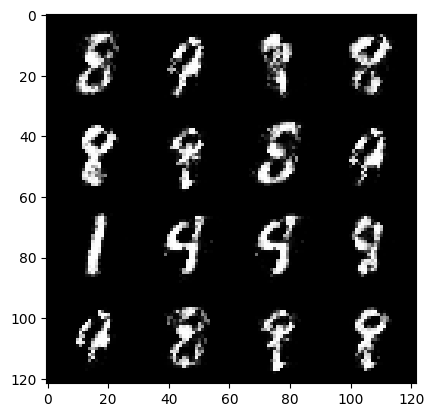

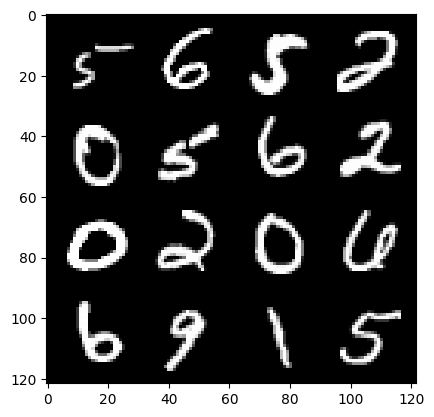

53: step 25200/ Gen loss: 3.212512876192728 / disc_loss: 6.234726909554257


  0%|          | 0/469 [00:00<?, ?it/s]

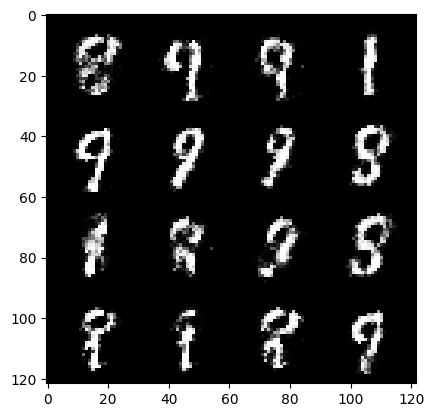

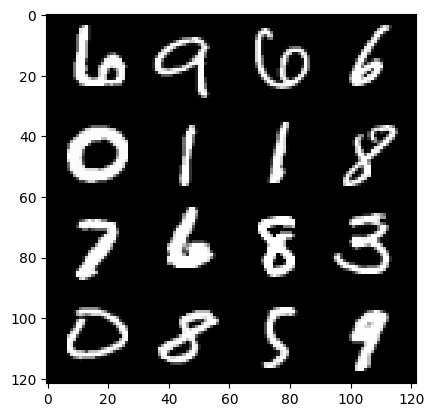

54: step 25500/ Gen loss: 3.1811086908976223 / disc_loss: 6.37235122771934


  0%|          | 0/469 [00:00<?, ?it/s]

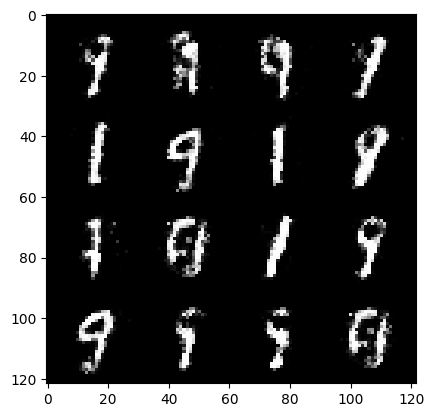

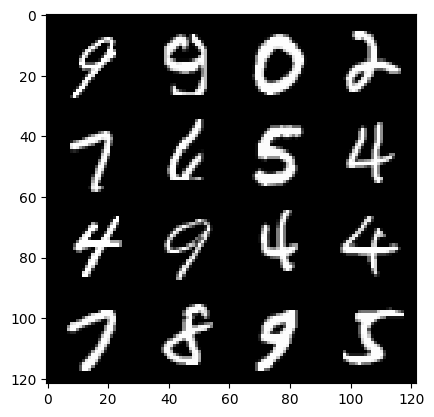

55: step 25800/ Gen loss: 3.014302704334259 / disc_loss: 6.503040677352499


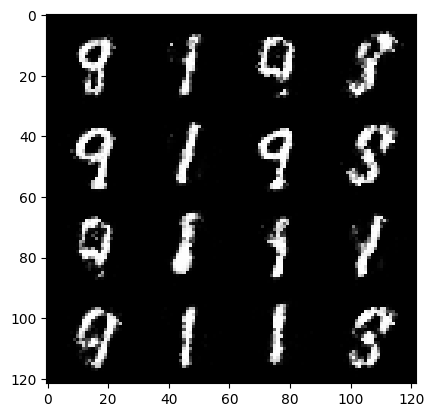

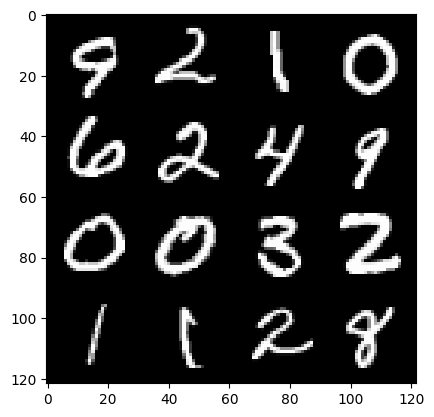

55: step 26100/ Gen loss: 3.095716040929157 / disc_loss: 6.645764886320878


  0%|          | 0/469 [00:00<?, ?it/s]

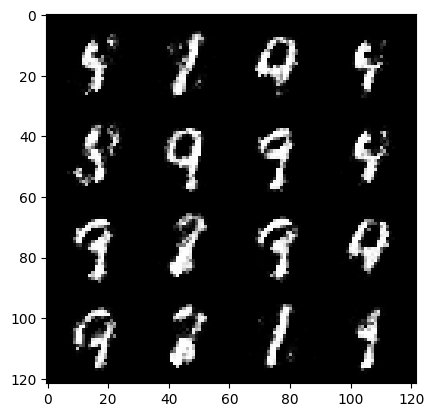

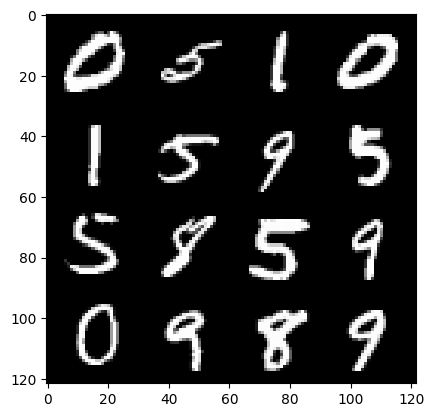

56: step 26400/ Gen loss: 3.1347101577123 / disc_loss: 6.786089215433836


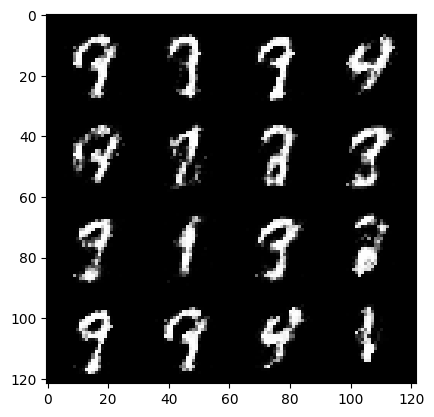

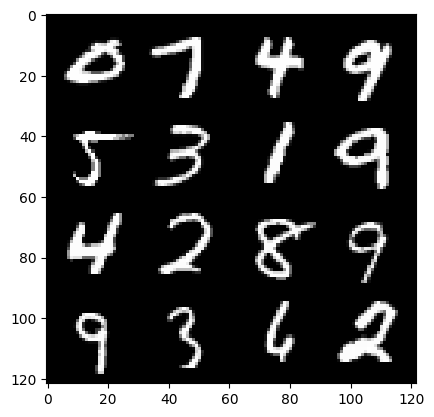

56: step 26700/ Gen loss: 3.172715588410695 / disc_loss: 6.936412358178432


  0%|          | 0/469 [00:00<?, ?it/s]

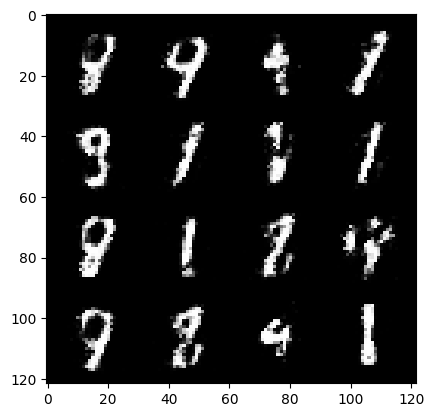

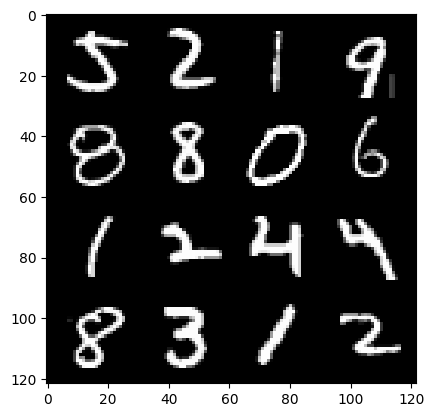

57: step 27000/ Gen loss: 3.1931786648432428 / disc_loss: 7.0970644297140195


  0%|          | 0/469 [00:00<?, ?it/s]

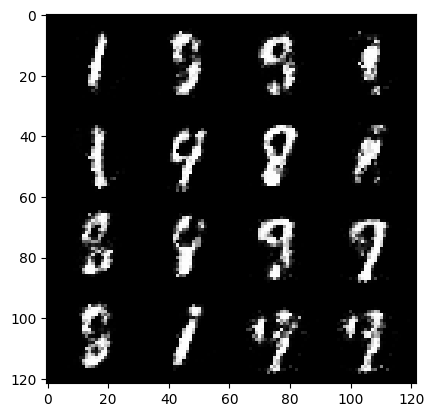

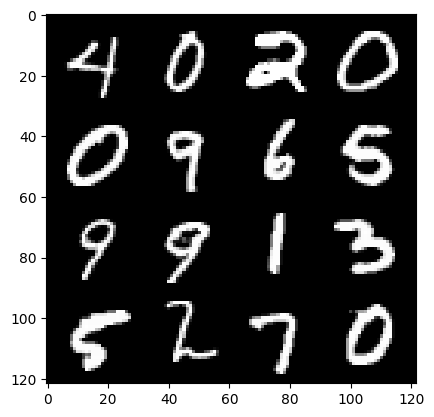

58: step 27300/ Gen loss: 3.029924908479055 / disc_loss: 7.267116533983493


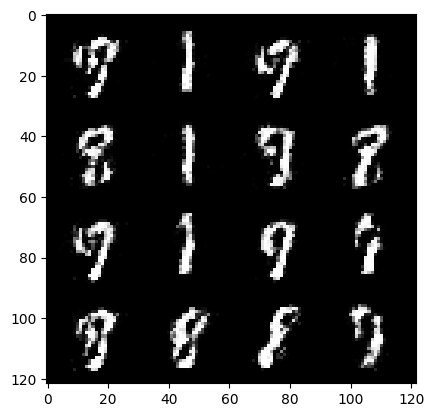

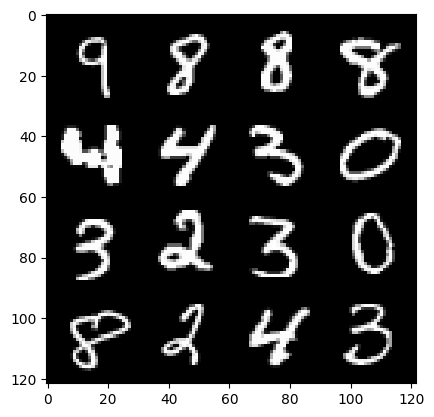

58: step 27600/ Gen loss: 3.0313340306282037 / disc_loss: 7.42598695848757


  0%|          | 0/469 [00:00<?, ?it/s]

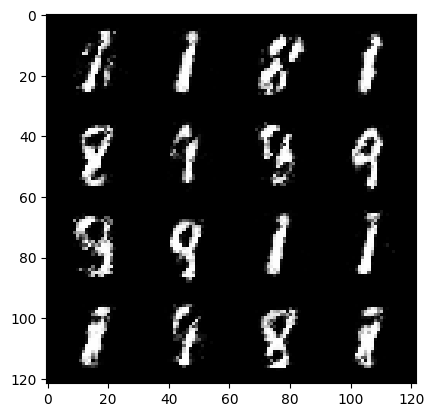

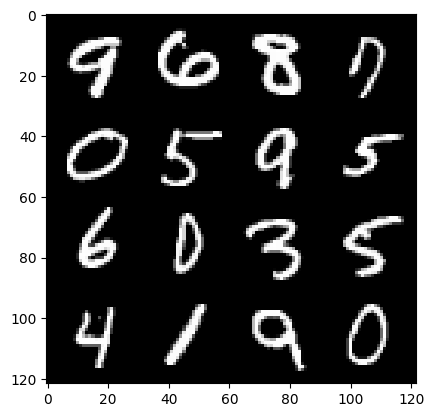

59: step 27900/ Gen loss: 3.007153713703154 / disc_loss: 7.602736057608064


  0%|          | 0/469 [00:00<?, ?it/s]

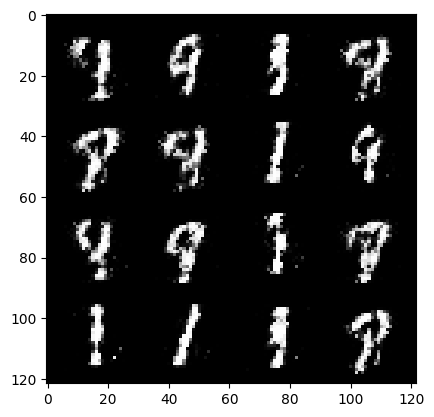

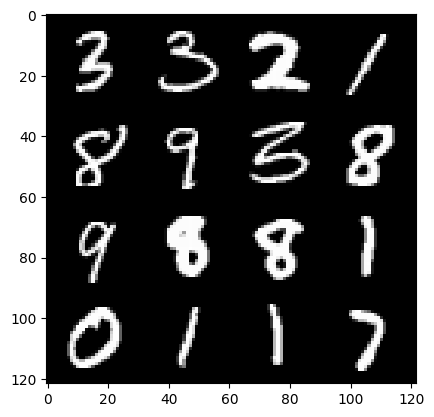

60: step 28200/ Gen loss: 3.077370699246725 / disc_loss: 7.792811418343322


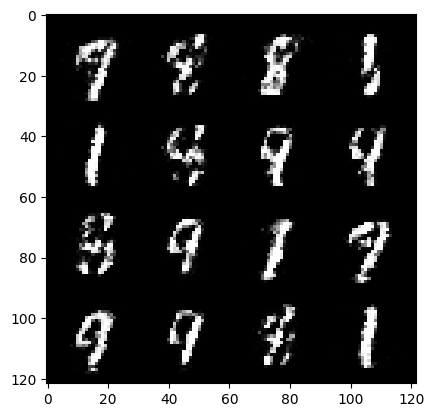

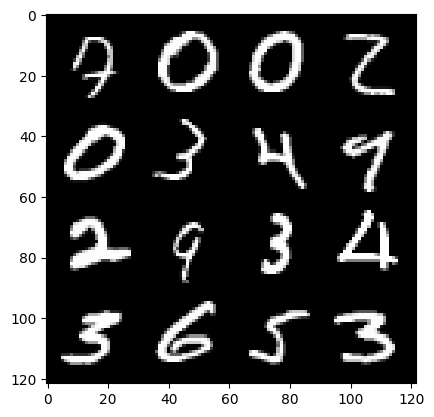

60: step 28500/ Gen loss: 3.0370668601989768 / disc_loss: 7.9694552570519175


  0%|          | 0/469 [00:00<?, ?it/s]

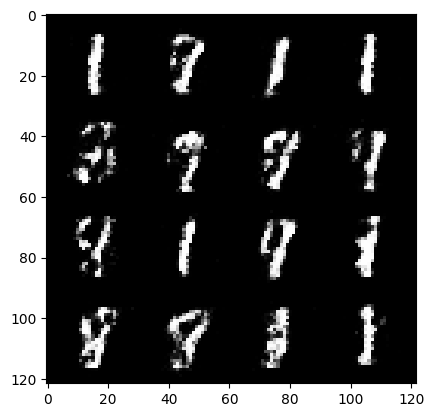

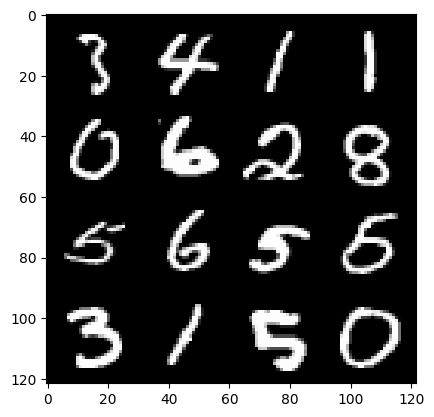

61: step 28800/ Gen loss: 2.915042877991993 / disc_loss: 8.148506517180547


  0%|          | 0/469 [00:00<?, ?it/s]

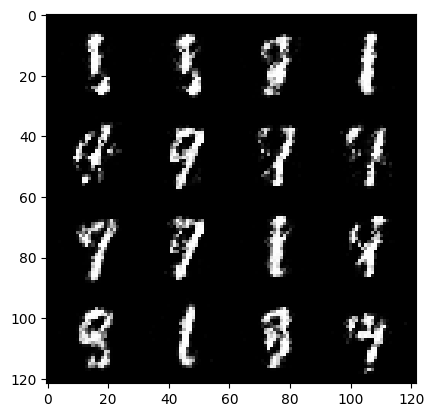

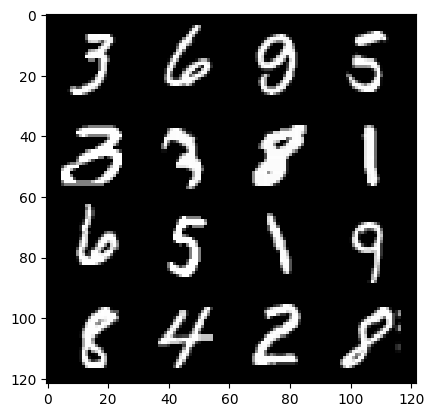

62: step 29100/ Gen loss: 2.9392677934964486 / disc_loss: 8.320151743286592


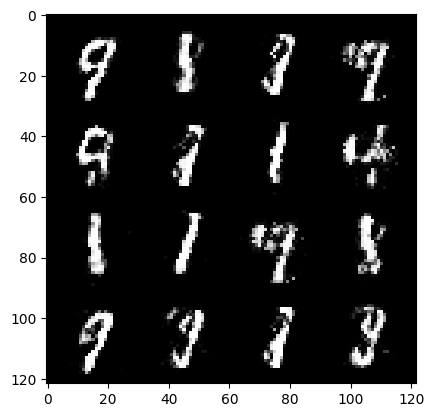

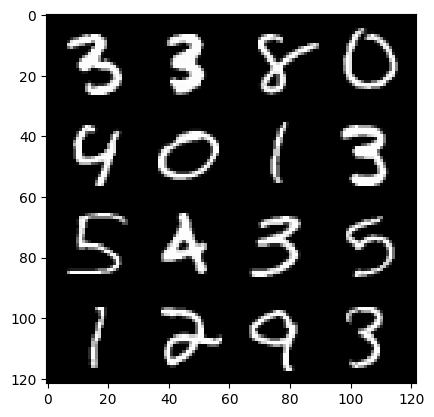

62: step 29400/ Gen loss: 2.927468318939212 / disc_loss: 8.499941824196508


  0%|          | 0/469 [00:00<?, ?it/s]

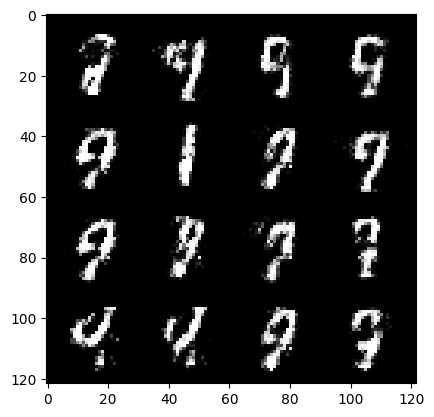

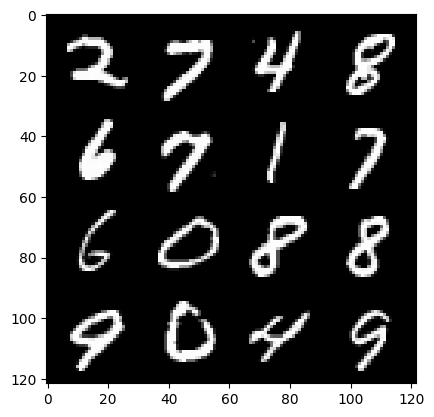

63: step 29700/ Gen loss: 2.778458166122437 / disc_loss: 8.716259323724834


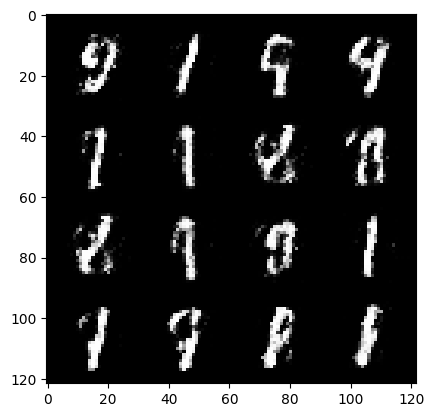

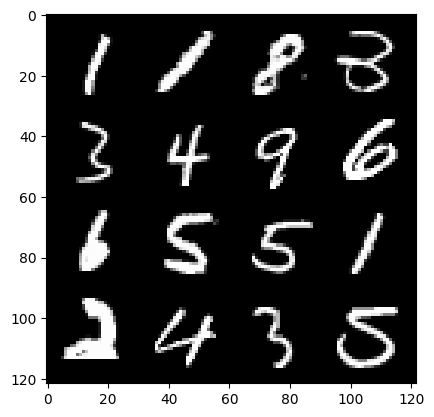

63: step 30000/ Gen loss: 2.840273857116697 / disc_loss: 8.925119762637953


  0%|          | 0/469 [00:00<?, ?it/s]

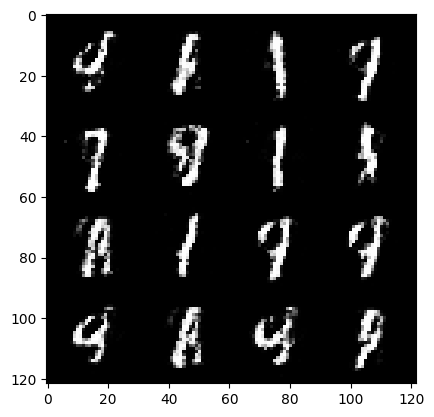

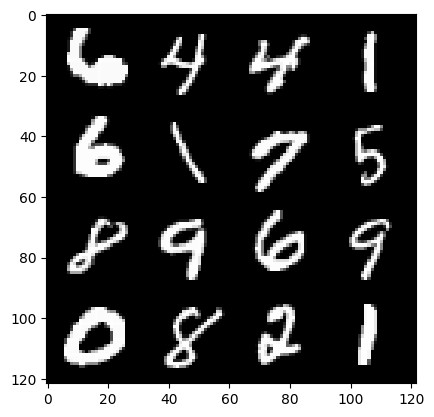

64: step 30300/ Gen loss: 2.7759257936477666 / disc_loss: 9.128257628002505


  0%|          | 0/469 [00:00<?, ?it/s]

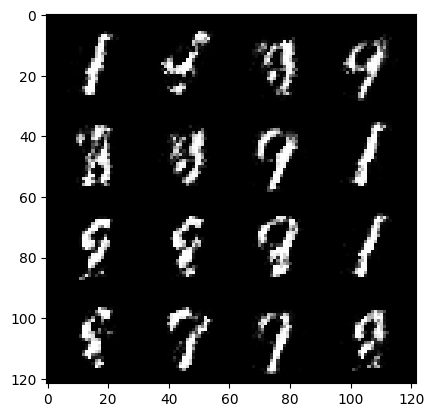

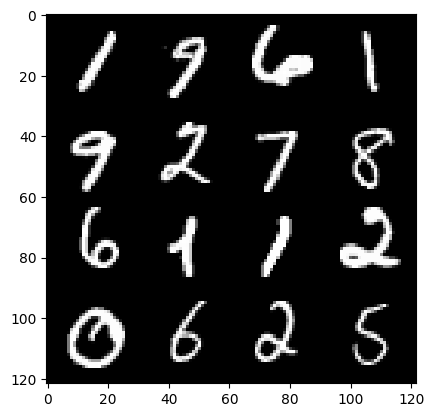

65: step 30600/ Gen loss: 2.8606501952807117 / disc_loss: 9.314179361307355


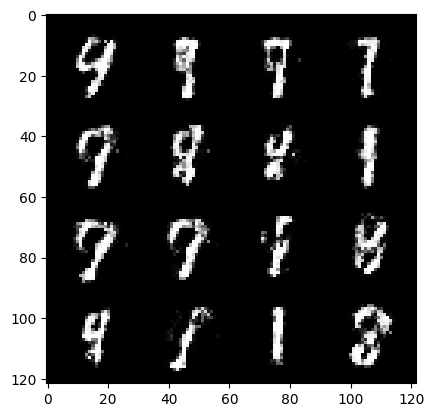

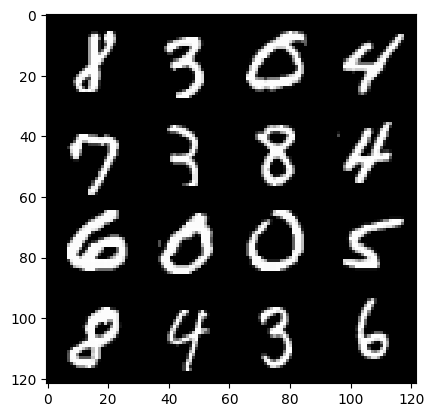

65: step 30900/ Gen loss: 2.82207587560018 / disc_loss: 9.53394368113948


  0%|          | 0/469 [00:00<?, ?it/s]

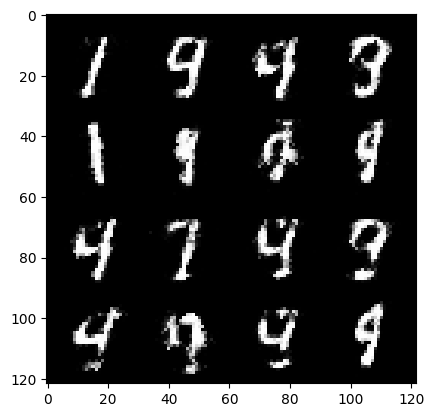

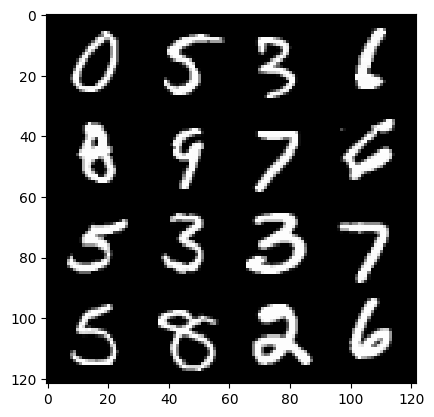

66: step 31200/ Gen loss: 2.736331359545392 / disc_loss: 9.762728148692577


  0%|          | 0/469 [00:00<?, ?it/s]

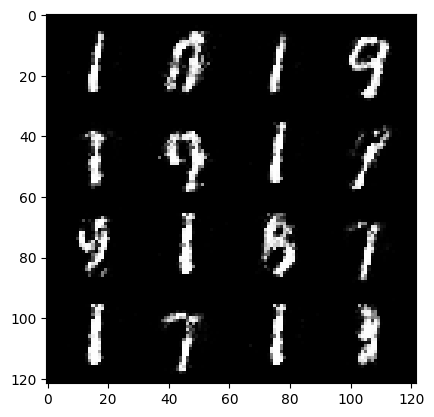

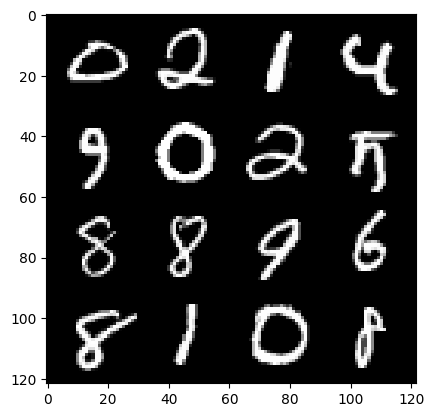

67: step 31500/ Gen loss: 2.6246610800425207 / disc_loss: 9.986151068477566


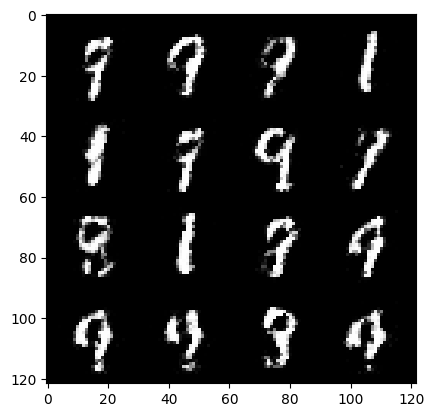

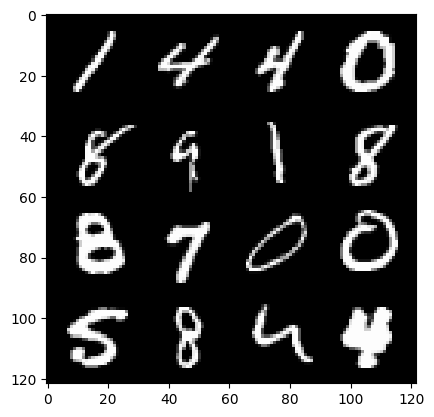

67: step 31800/ Gen loss: 2.6823467540740973 / disc_loss: 10.190911846874888


  0%|          | 0/469 [00:00<?, ?it/s]

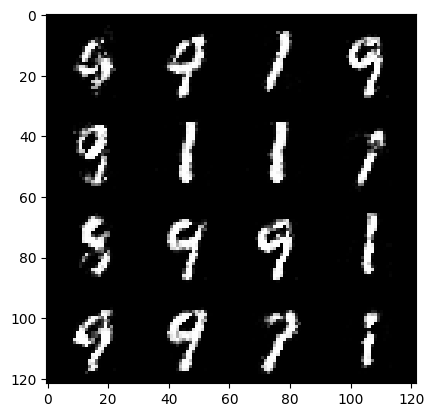

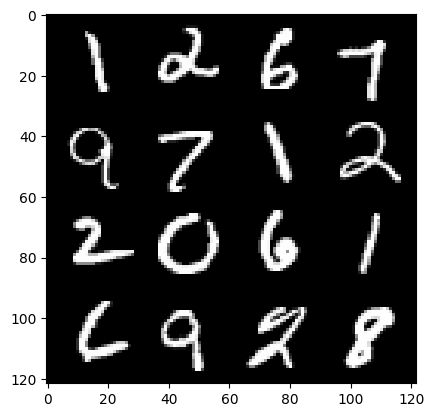

68: step 32100/ Gen loss: 2.700402677059172 / disc_loss: 10.421320607581471


  0%|          | 0/469 [00:00<?, ?it/s]

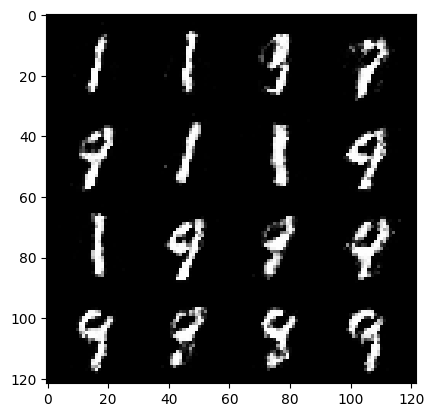

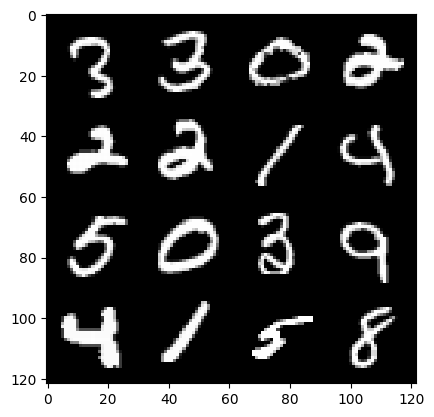

69: step 32400/ Gen loss: 2.5101672744750965 / disc_loss: 10.638347405710554


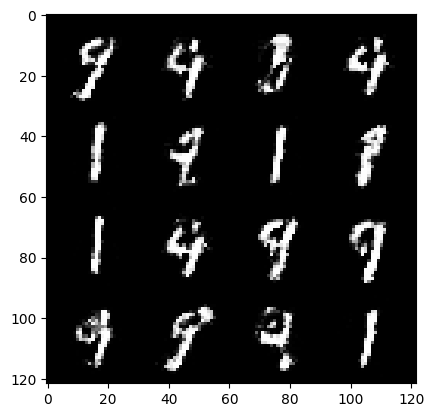

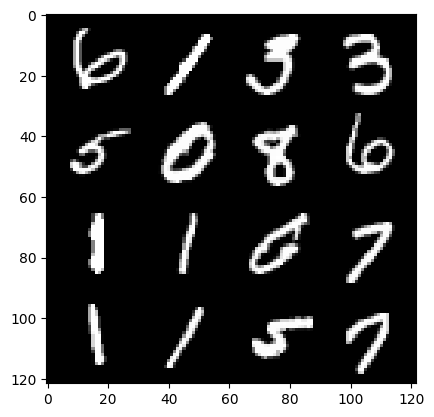

69: step 32700/ Gen loss: 2.67070289214452 / disc_loss: 10.862591541080391


  0%|          | 0/469 [00:00<?, ?it/s]

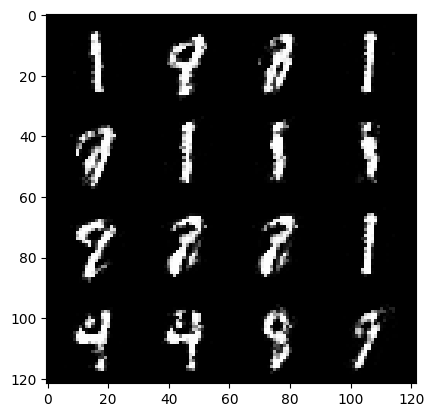

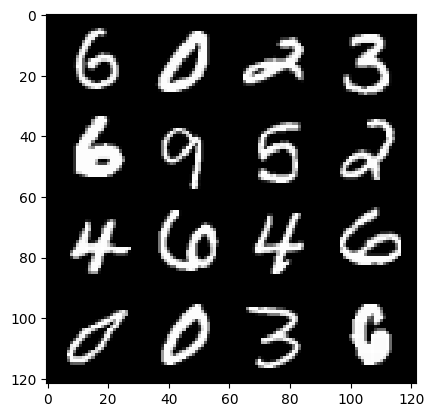

70: step 33000/ Gen loss: 2.506114151477813 / disc_loss: 11.115798068959238


  0%|          | 0/469 [00:00<?, ?it/s]

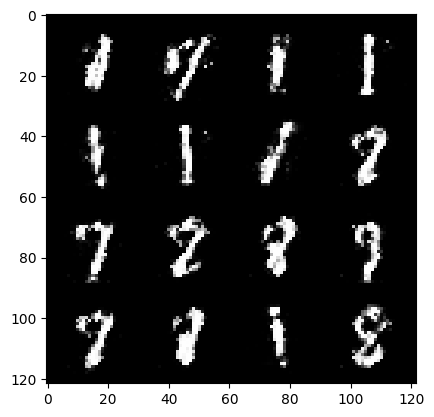

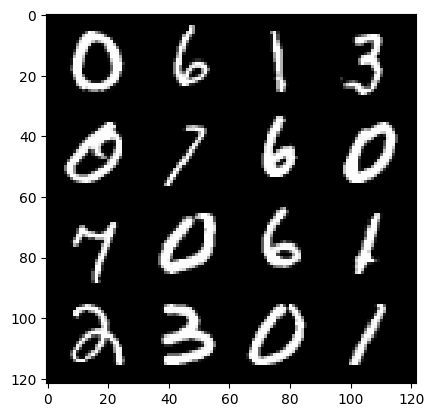

71: step 33300/ Gen loss: 2.5450945059458436 / disc_loss: 11.37144004982584


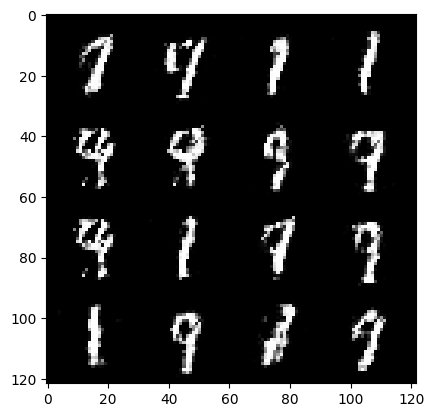

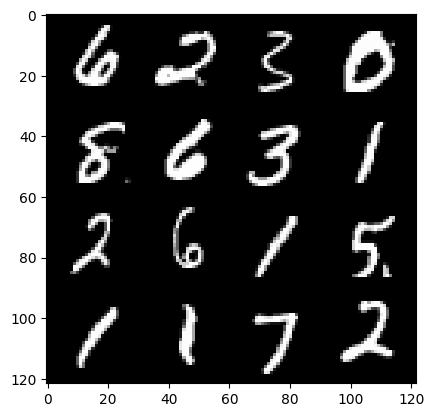

71: step 33600/ Gen loss: 2.52766636530558 / disc_loss: 11.597402979501808


  0%|          | 0/469 [00:00<?, ?it/s]

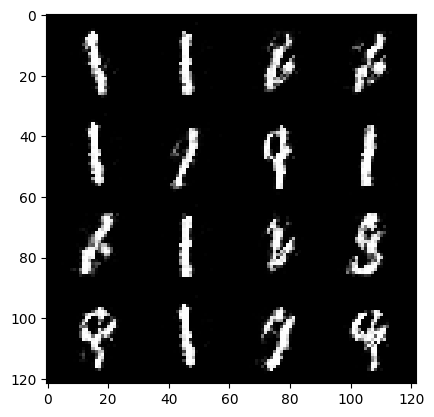

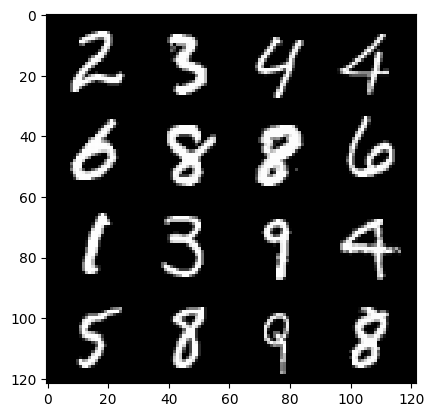

72: step 33900/ Gen loss: 2.4992772841453545 / disc_loss: 11.813031777658784


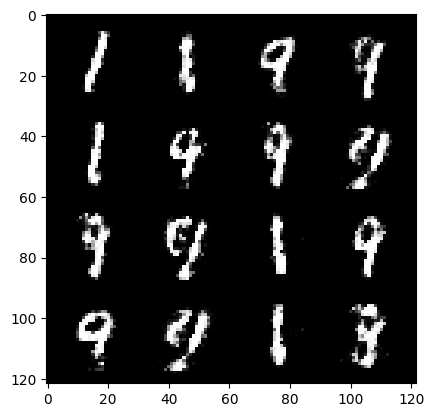

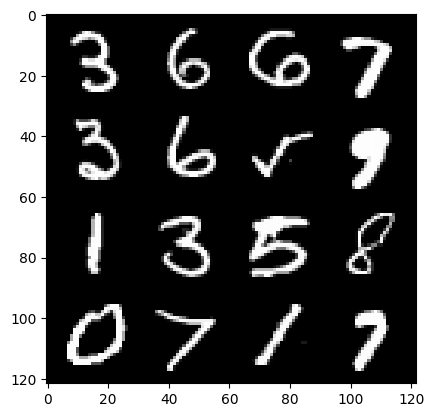

72: step 34200/ Gen loss: 2.5461017775535573 / disc_loss: 12.028913416036684


  0%|          | 0/469 [00:00<?, ?it/s]

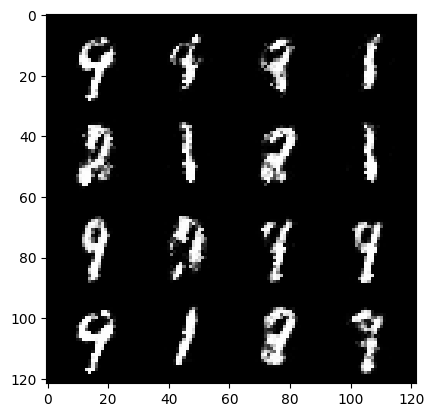

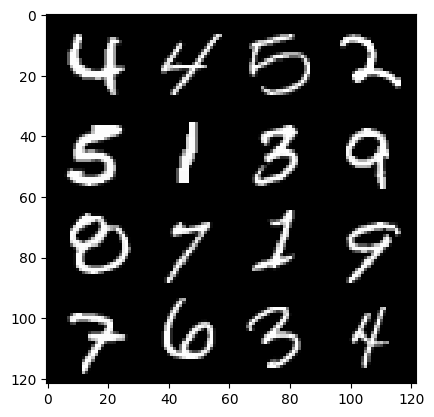

73: step 34500/ Gen loss: 2.4202294695377353 / disc_loss: 12.259730177689327


  0%|          | 0/469 [00:00<?, ?it/s]

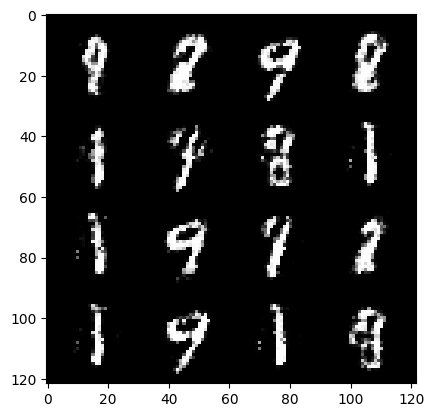

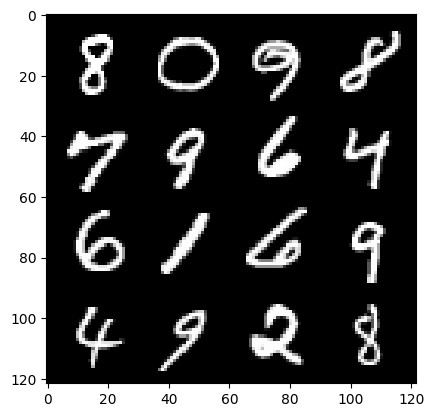

74: step 34800/ Gen loss: 2.421042251984279 / disc_loss: 12.517091305274505


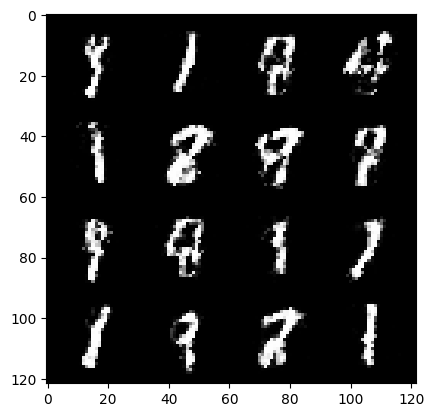

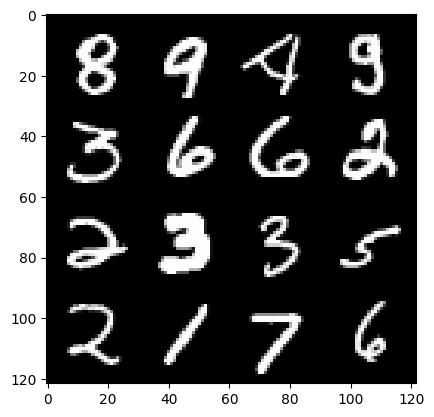

74: step 35100/ Gen loss: 2.423919070561725 / disc_loss: 12.742634682475254


  0%|          | 0/469 [00:00<?, ?it/s]

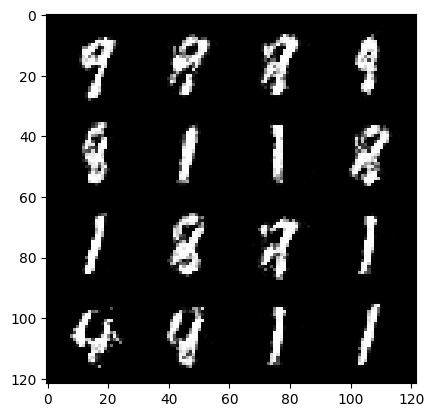

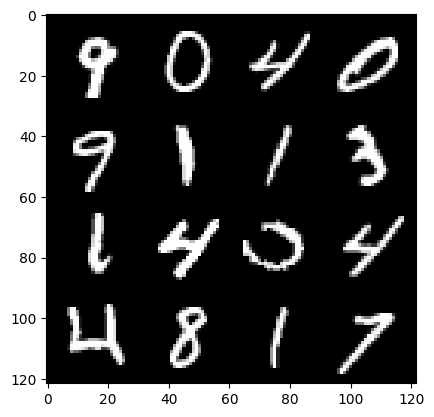

75: step 35400/ Gen loss: 2.4746452418963103 / disc_loss: 12.965466095426406


  0%|          | 0/469 [00:00<?, ?it/s]

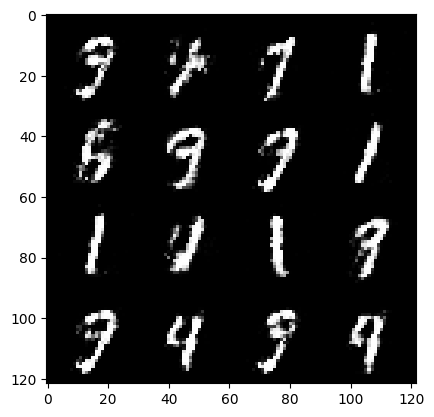

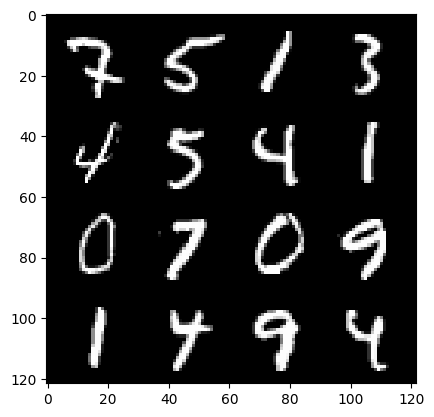

76: step 35700/ Gen loss: 2.32425056974093 / disc_loss: 13.213562718747786


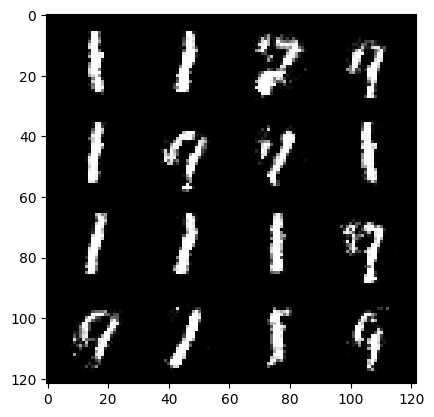

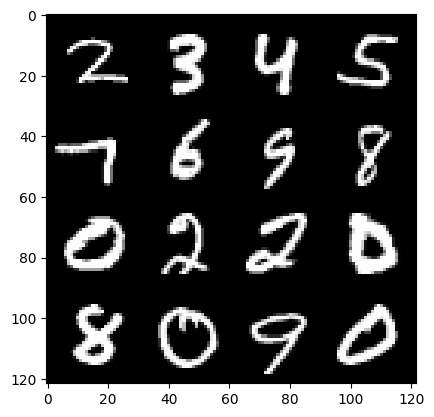

76: step 36000/ Gen loss: 2.439372900724412 / disc_loss: 13.47728400783611


  0%|          | 0/469 [00:00<?, ?it/s]

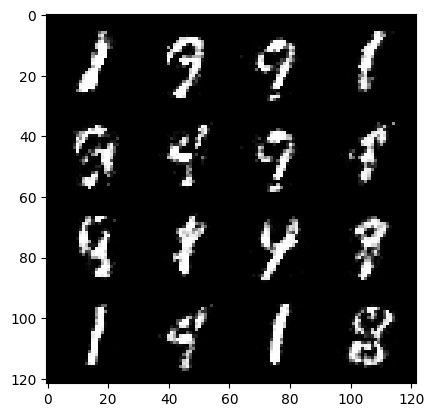

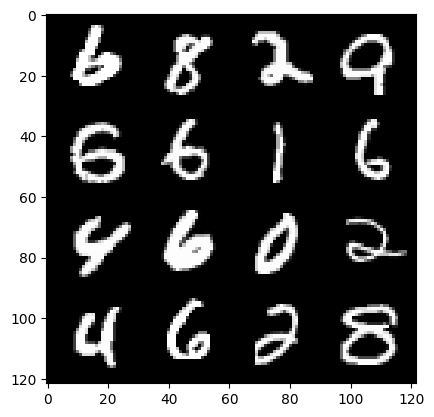

77: step 36300/ Gen loss: 2.3684799249966915 / disc_loss: 13.72955029231185


  0%|          | 0/469 [00:00<?, ?it/s]

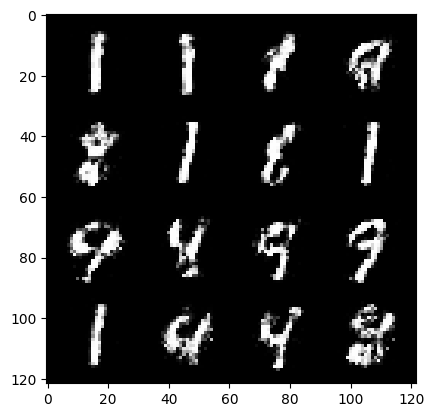

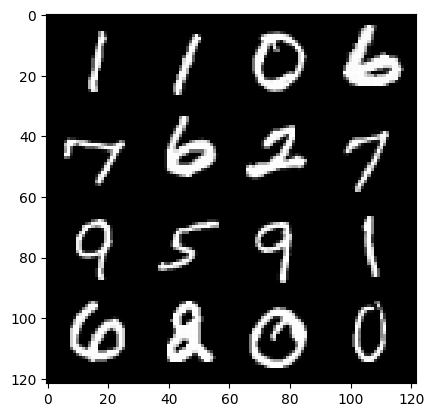

78: step 36600/ Gen loss: 2.270062570969264 / disc_loss: 13.992902917383862


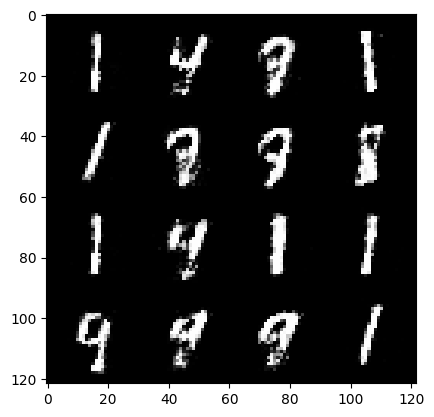

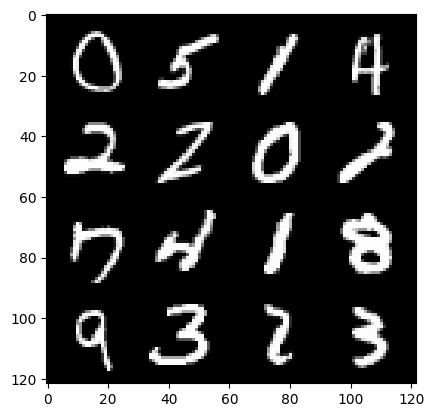

78: step 36900/ Gen loss: 2.358268679777781 / disc_loss: 14.238112912991397


  0%|          | 0/469 [00:00<?, ?it/s]

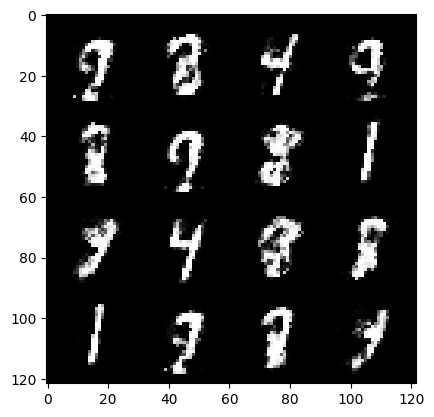

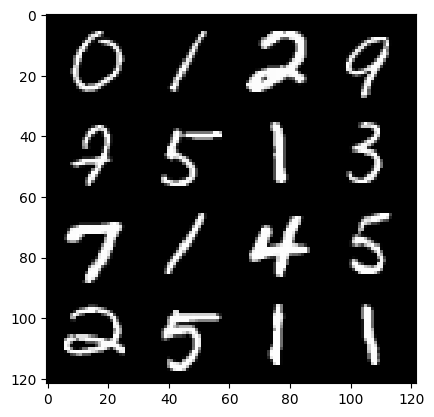

79: step 37200/ Gen loss: 2.3412642200787848 / disc_loss: 14.4823825661031


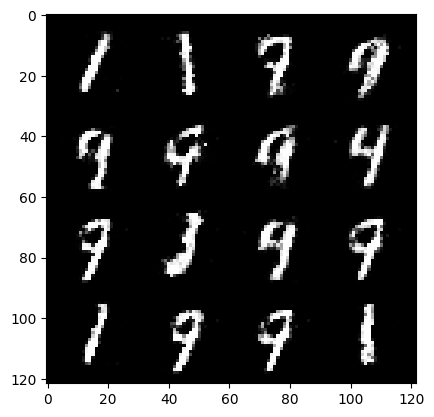

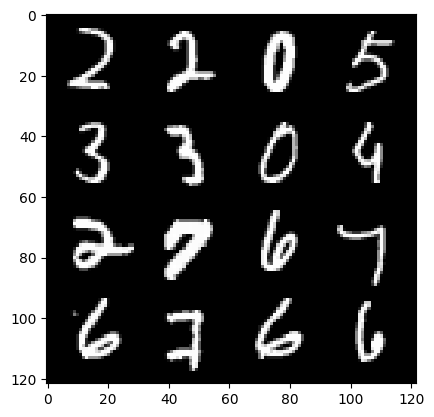

79: step 37500/ Gen loss: 2.3102367198467273 / disc_loss: 14.73514813216405


  0%|          | 0/469 [00:00<?, ?it/s]

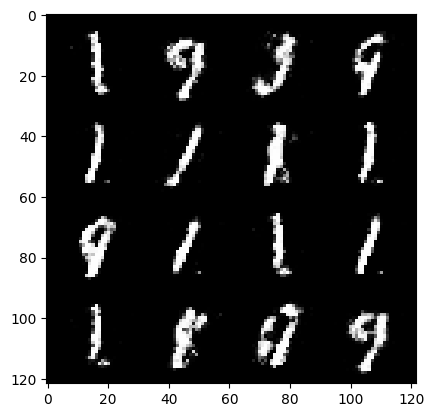

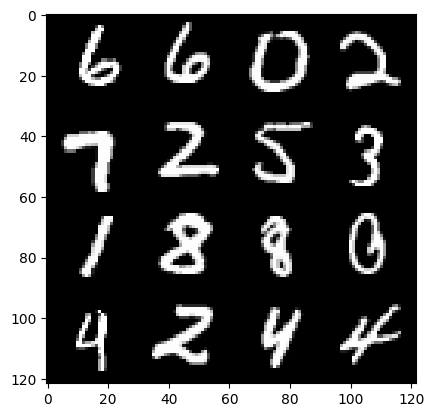

80: step 37800/ Gen loss: 2.2731779344876593 / disc_loss: 14.992391958752043


  0%|          | 0/469 [00:00<?, ?it/s]

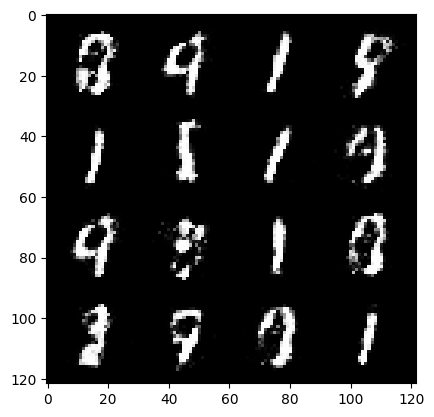

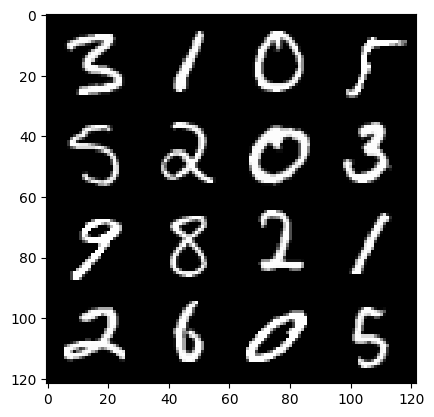

81: step 38100/ Gen loss: 2.2981774918238314 / disc_loss: 15.240924125680099


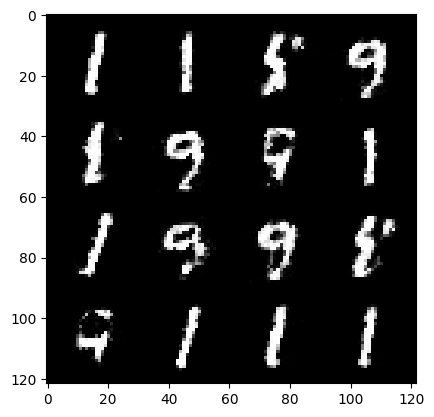

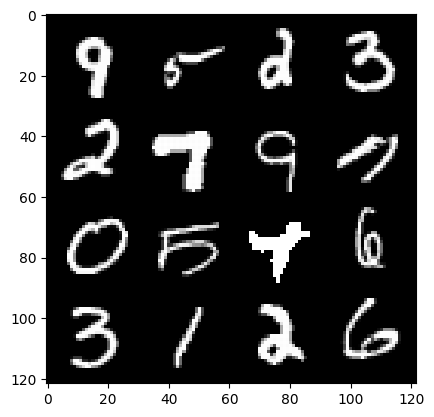

81: step 38400/ Gen loss: 2.184200808604558 / disc_loss: 15.512194127359765


  0%|          | 0/469 [00:00<?, ?it/s]

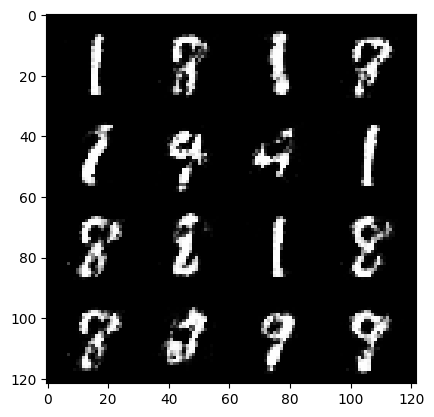

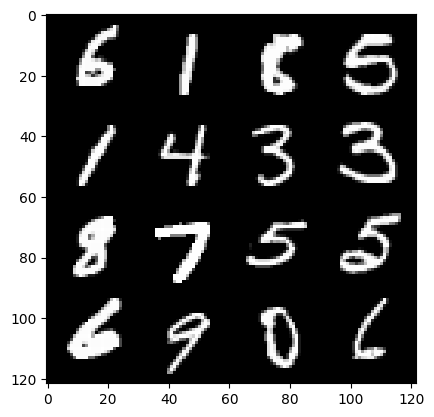

82: step 38700/ Gen loss: 2.117636357148488 / disc_loss: 15.79780246006327


  0%|          | 0/469 [00:00<?, ?it/s]

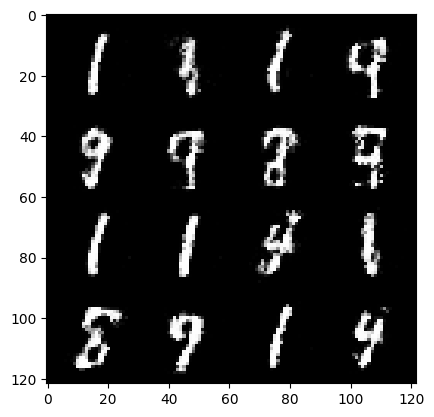

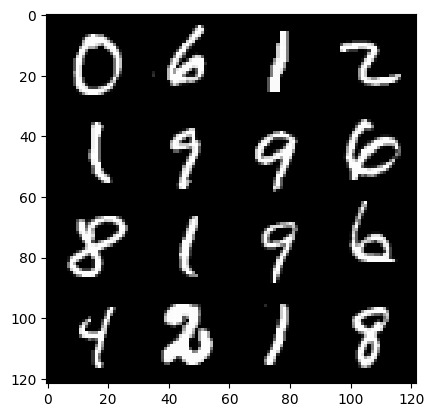

83: step 39000/ Gen loss: 2.1237896517912556 / disc_loss: 16.059474378246826


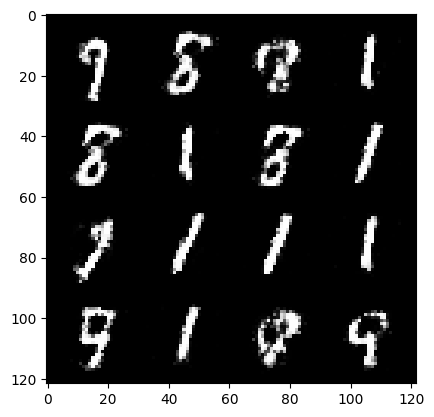

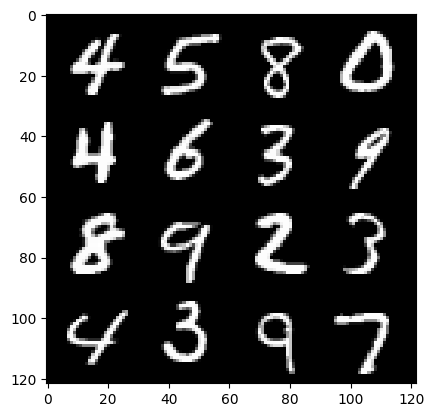

83: step 39300/ Gen loss: 2.1140103979905454 / disc_loss: 16.31873998872317


  0%|          | 0/469 [00:00<?, ?it/s]

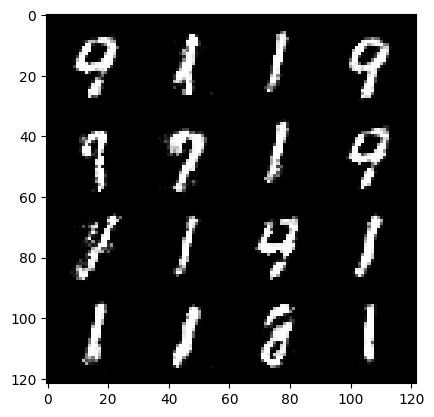

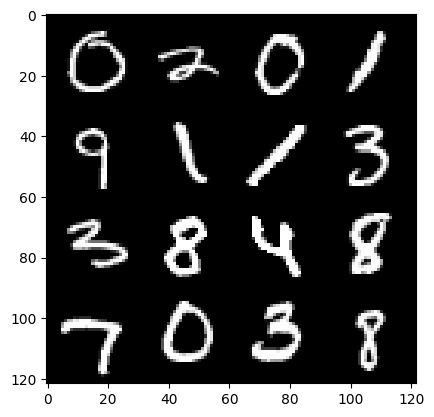

84: step 39600/ Gen loss: 2.1635257009665185 / disc_loss: 16.57340618398663


  0%|          | 0/469 [00:00<?, ?it/s]

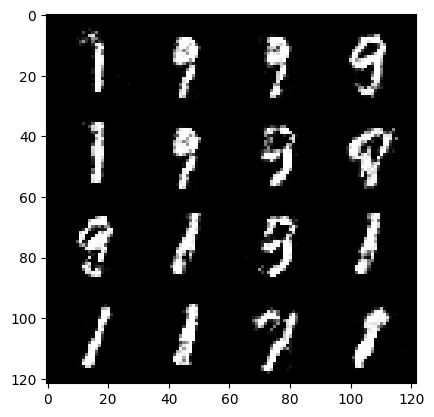

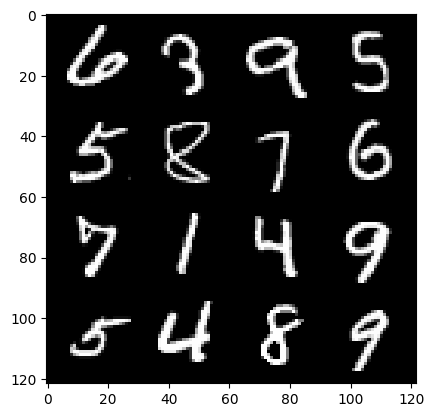

85: step 39900/ Gen loss: 2.166879009803136 / disc_loss: 16.837931363501898


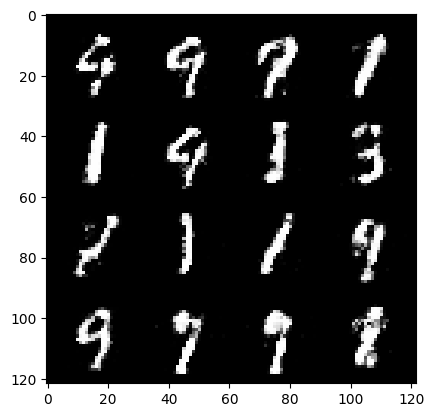

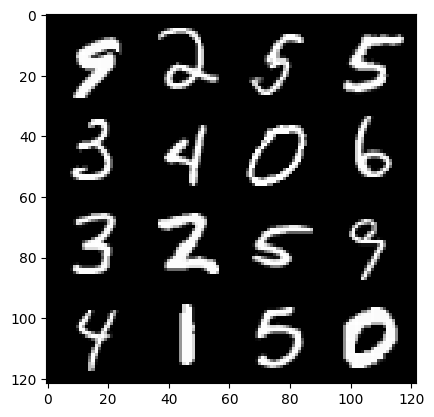

85: step 40200/ Gen loss: 2.1356392955780037 / disc_loss: 17.09743729732308


  0%|          | 0/469 [00:00<?, ?it/s]

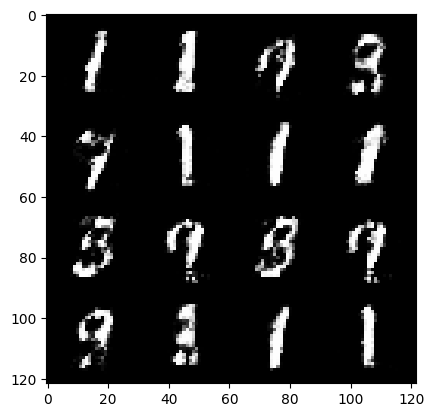

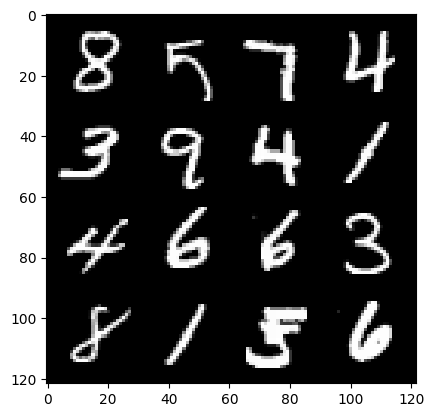

86: step 40500/ Gen loss: 2.1241616503397616 / disc_loss: 17.386257040568935


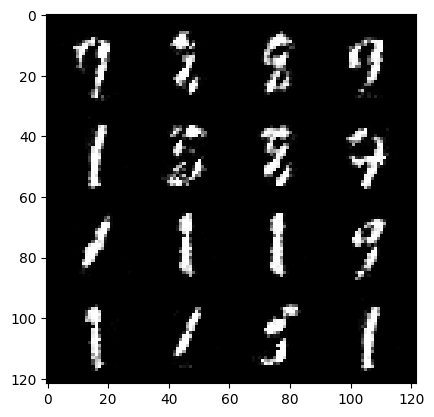

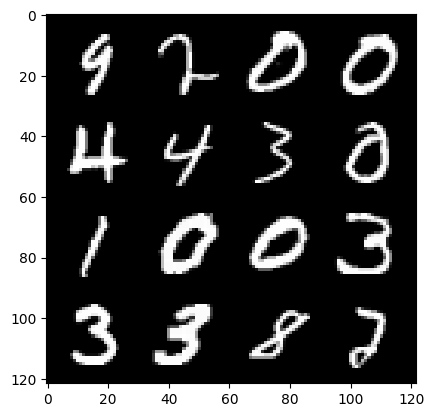

86: step 40800/ Gen loss: 2.000954629977543 / disc_loss: 17.690078879067038


  0%|          | 0/469 [00:00<?, ?it/s]

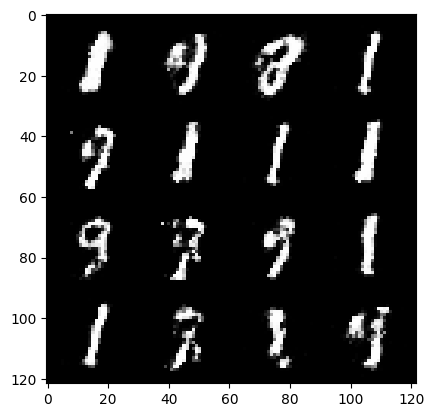

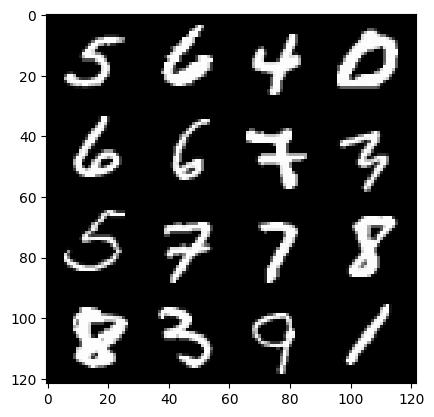

87: step 41100/ Gen loss: 2.031720631519954 / disc_loss: 17.968655558644446


  0%|          | 0/469 [00:00<?, ?it/s]

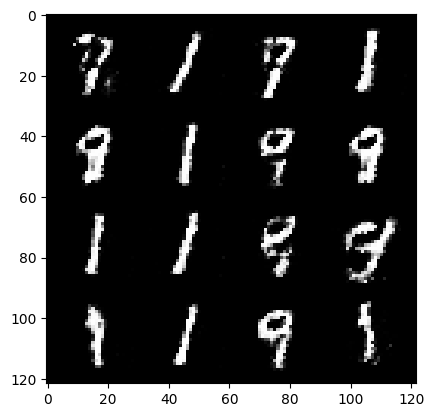

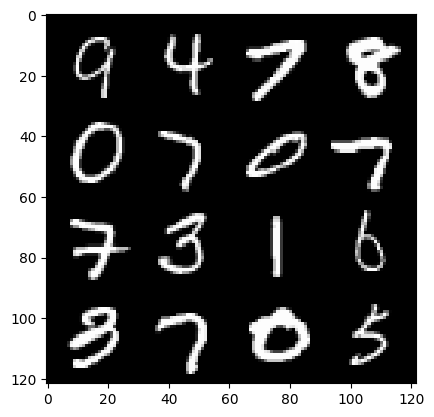

88: step 41400/ Gen loss: 2.022460023562113 / disc_loss: 18.258606645880874


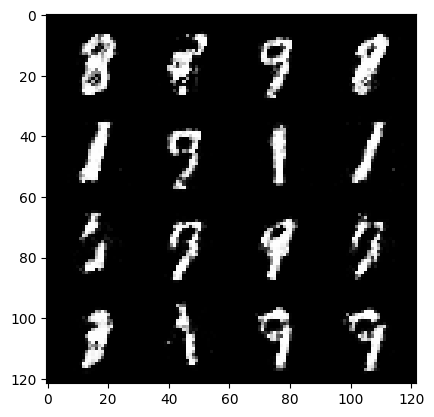

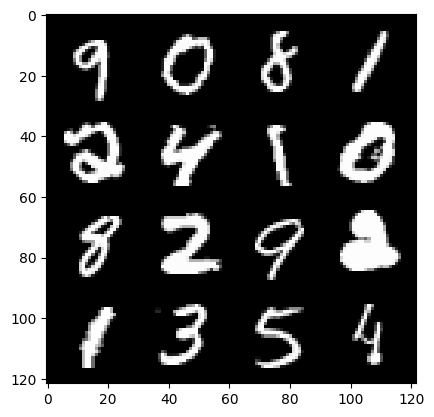

88: step 41700/ Gen loss: 2.0070062343279518 / disc_loss: 18.54626219443357


  0%|          | 0/469 [00:00<?, ?it/s]

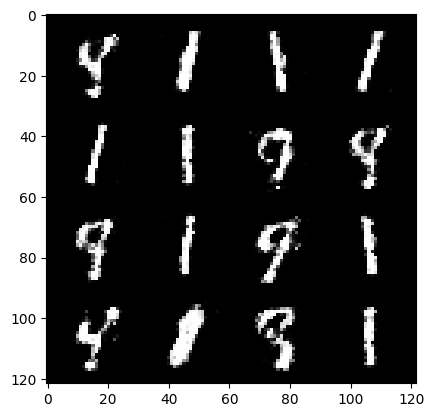

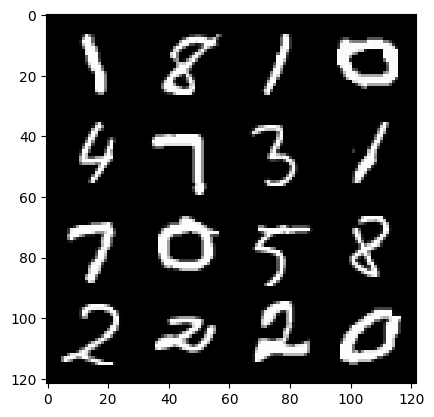

89: step 42000/ Gen loss: 1.9734028450647996 / disc_loss: 18.828423817126694


  0%|          | 0/469 [00:00<?, ?it/s]

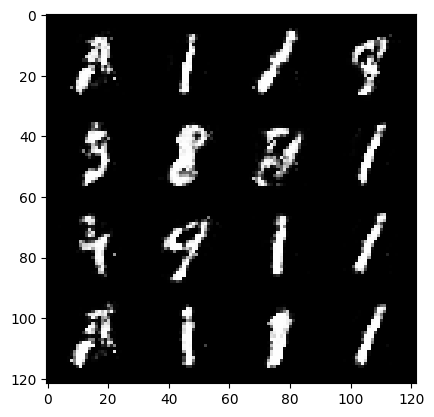

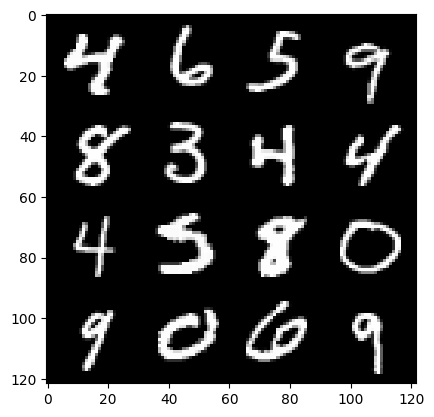

90: step 42300/ Gen loss: 1.988665342728298 / disc_loss: 19.113065151392146


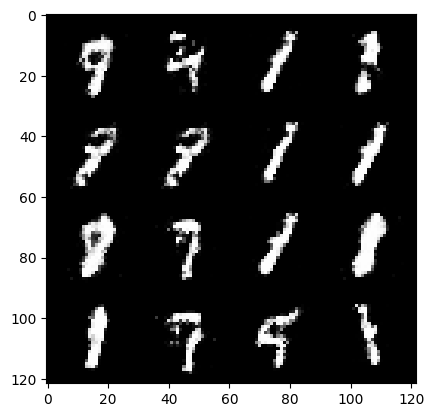

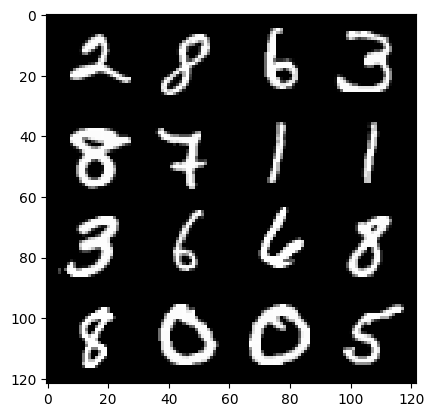

90: step 42600/ Gen loss: 1.9312729481856017 / disc_loss: 19.41382961255182


  0%|          | 0/469 [00:00<?, ?it/s]

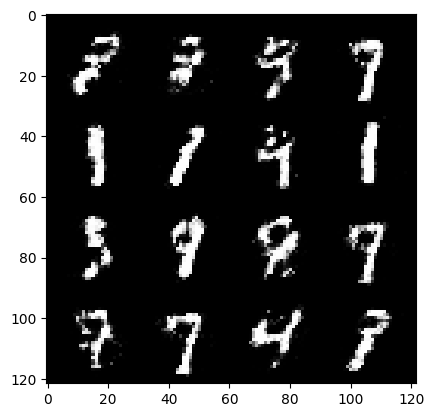

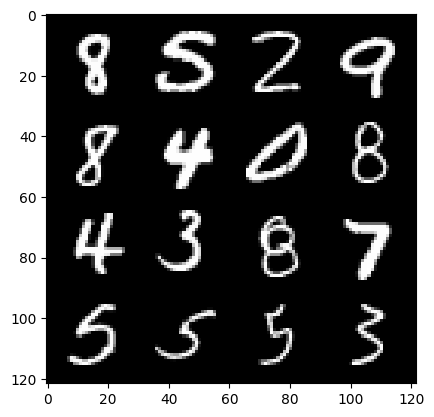

91: step 42900/ Gen loss: 1.9319614926973974 / disc_loss: 19.718384148000375


  0%|          | 0/469 [00:00<?, ?it/s]

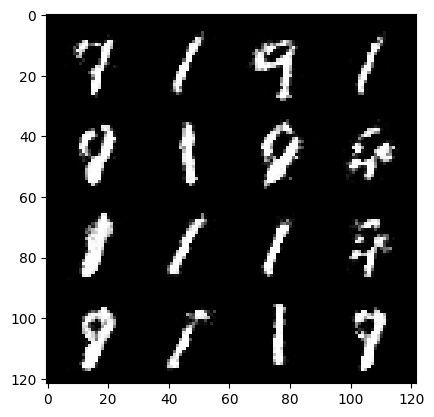

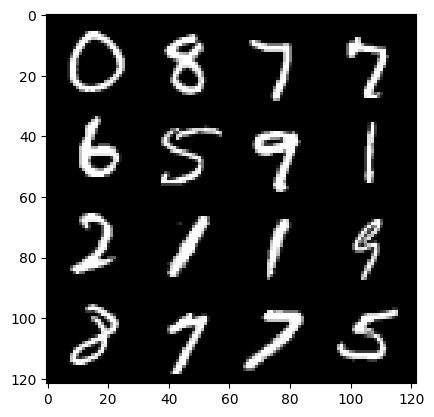

92: step 43200/ Gen loss: 1.8486058894793198 / disc_loss: 20.047627493410033


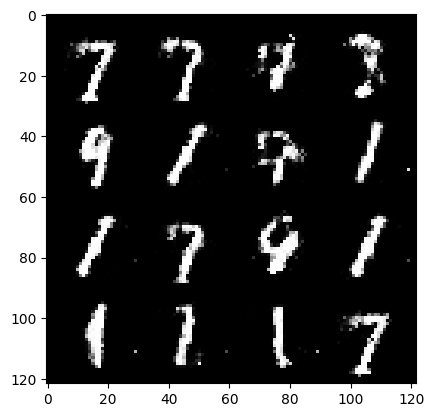

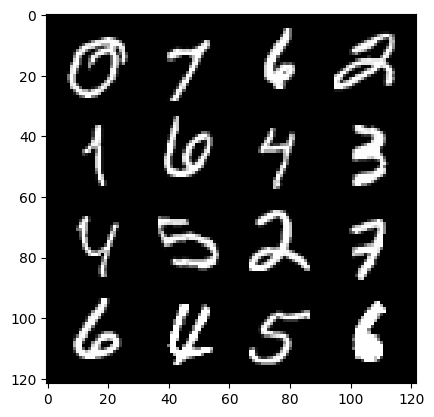

92: step 43500/ Gen loss: 1.884650119940441 / disc_loss: 20.357817526974994


  0%|          | 0/469 [00:00<?, ?it/s]

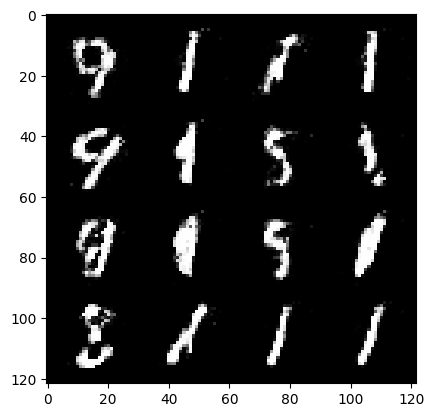

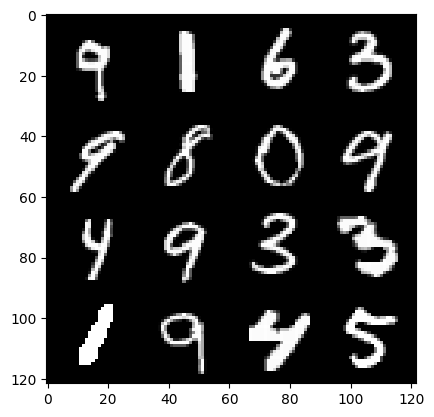

93: step 43800/ Gen loss: 1.9601330176989247 / disc_loss: 20.639853620845813


  0%|          | 0/469 [00:00<?, ?it/s]

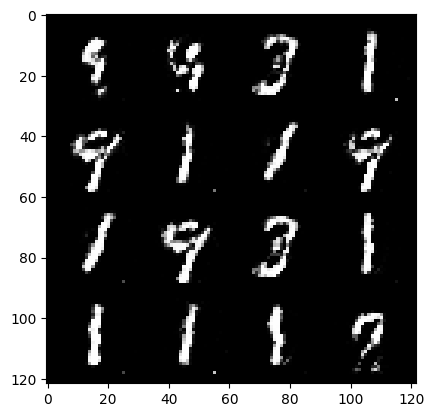

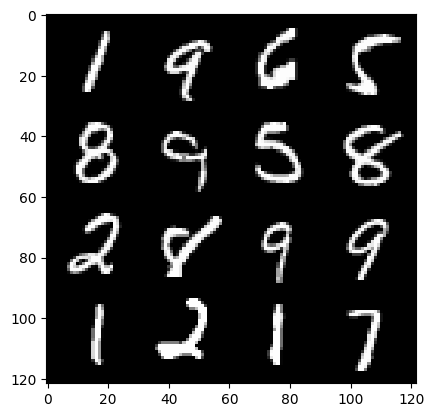

94: step 44100/ Gen loss: 1.9373100801308945 / disc_loss: 20.94207024471834


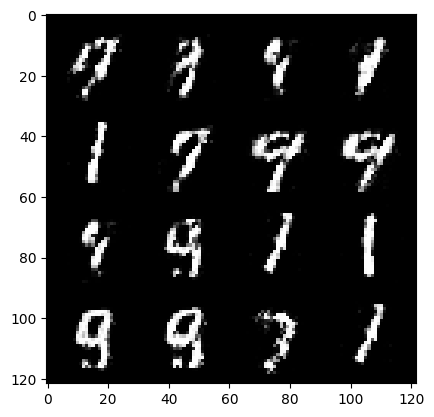

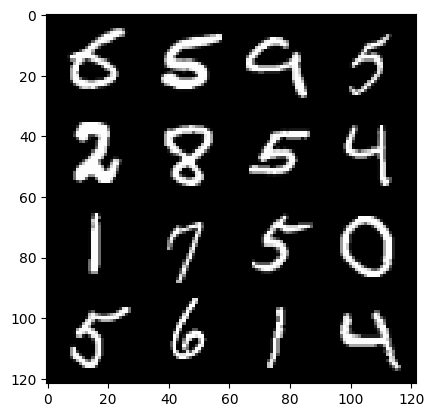

94: step 44400/ Gen loss: 1.9201910742123913 / disc_loss: 21.223953928817068


  0%|          | 0/469 [00:00<?, ?it/s]

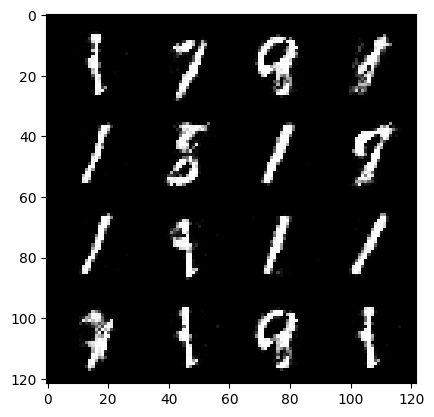

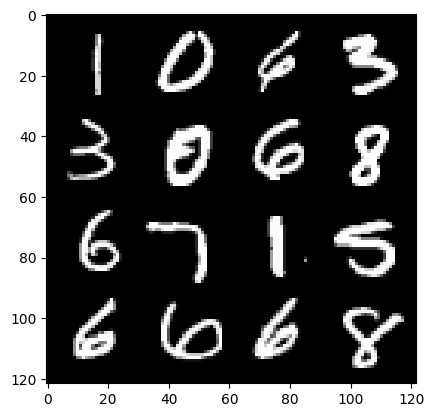

95: step 44700/ Gen loss: 1.9588919186592115 / disc_loss: 21.498517993260194


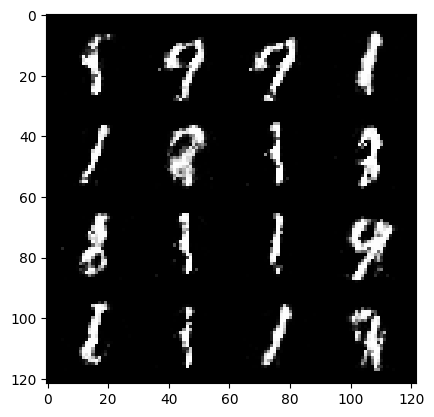

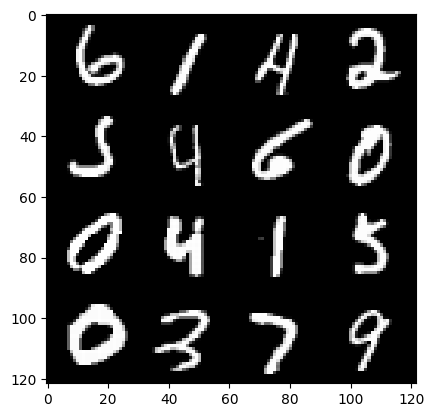

95: step 45000/ Gen loss: 1.9145246247450498 / disc_loss: 21.791781701315205


  0%|          | 0/469 [00:00<?, ?it/s]

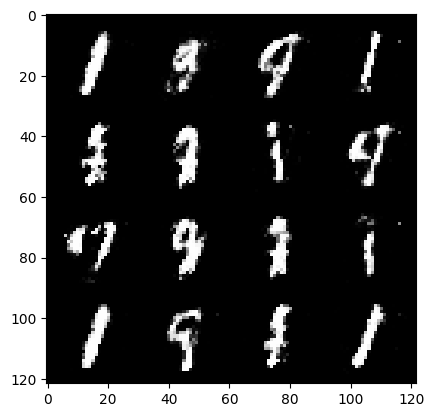

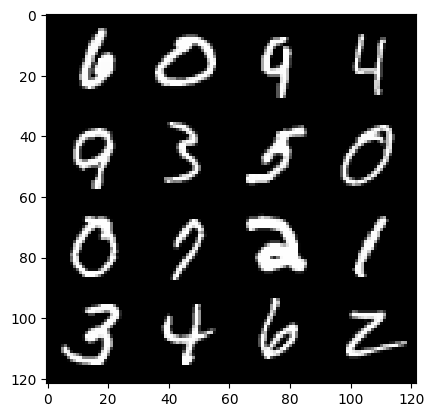

96: step 45300/ Gen loss: 1.9046971853574126 / disc_loss: 22.07840945886447


  0%|          | 0/469 [00:00<?, ?it/s]

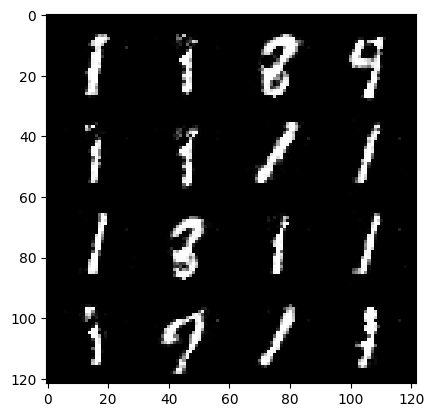

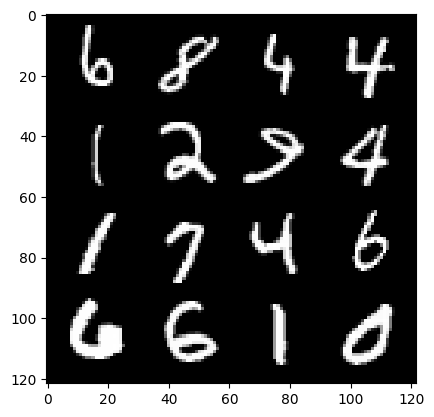

97: step 45600/ Gen loss: 1.9508101495107022 / disc_loss: 22.372347881564256


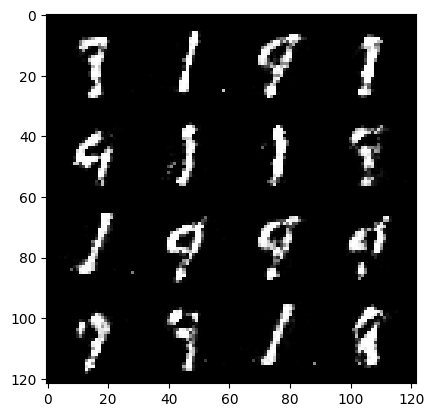

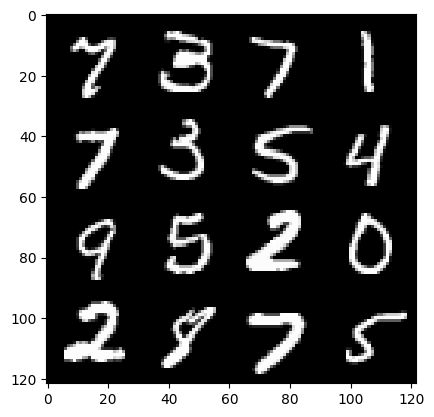

97: step 45900/ Gen loss: 1.9205409622192395 / disc_loss: 22.655646687218333


  0%|          | 0/469 [00:00<?, ?it/s]

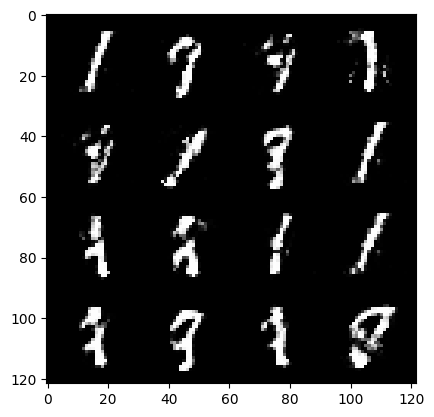

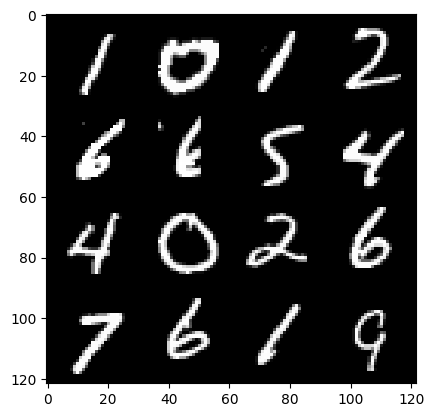

98: step 46200/ Gen loss: 1.8875533457597107 / disc_loss: 22.95327623468515


  0%|          | 0/469 [00:00<?, ?it/s]

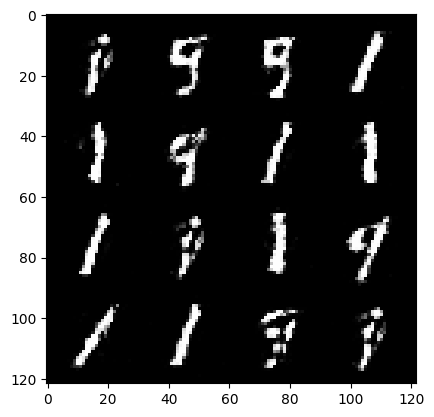

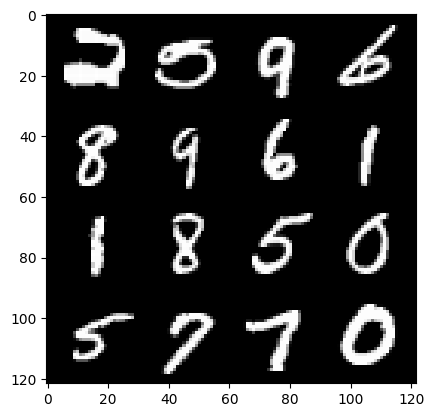

99: step 46500/ Gen loss: 1.9915727945168813 / disc_loss: 23.21661485018208


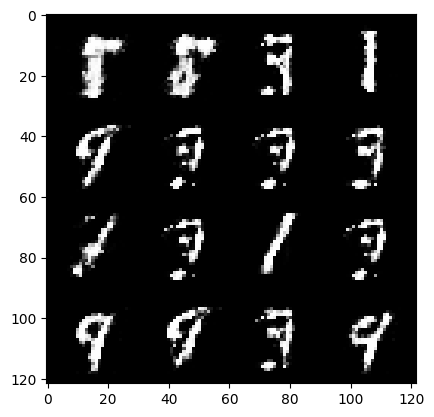

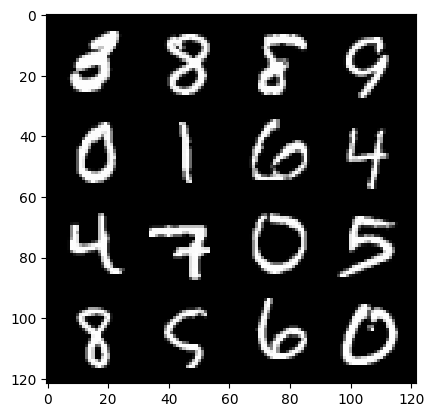

99: step 46800/ Gen loss: 1.960740719238917 / disc_loss: 23.48937992673989


  0%|          | 0/469 [00:00<?, ?it/s]

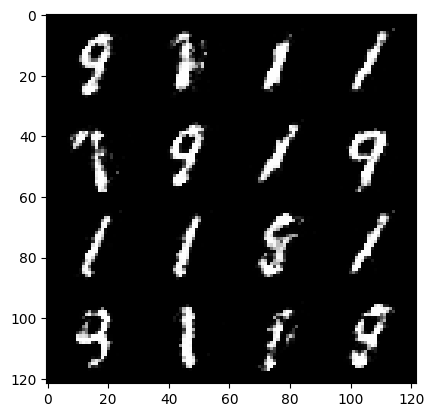

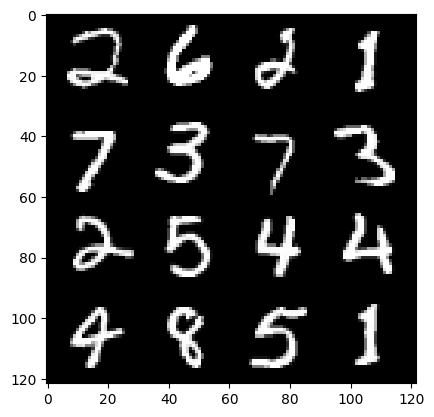

100: step 47100/ Gen loss: 1.9863096841176355 / disc_loss: 23.749207459855857


  0%|          | 0/469 [00:00<?, ?it/s]

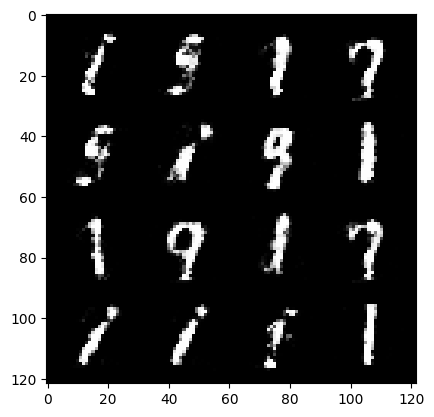

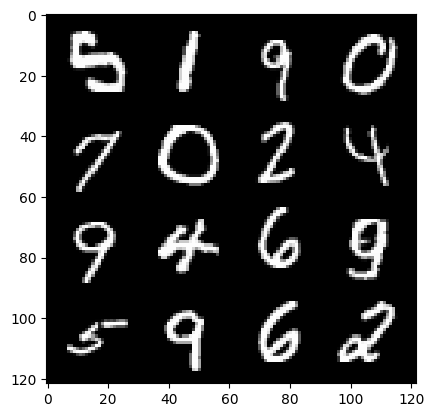

101: step 47400/ Gen loss: 1.9894203253587073 / disc_loss: 24.03075413477298


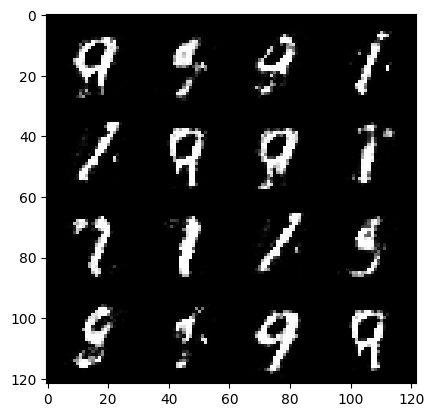

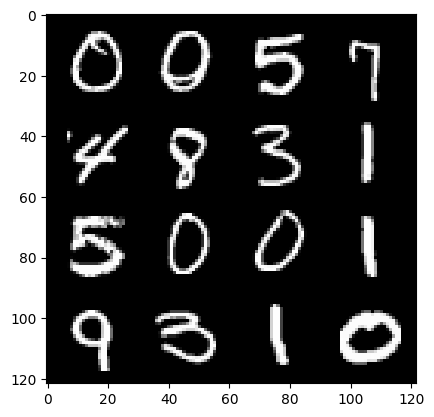

101: step 47700/ Gen loss: 1.9654579643408452 / disc_loss: 24.311364705829558


  0%|          | 0/469 [00:00<?, ?it/s]

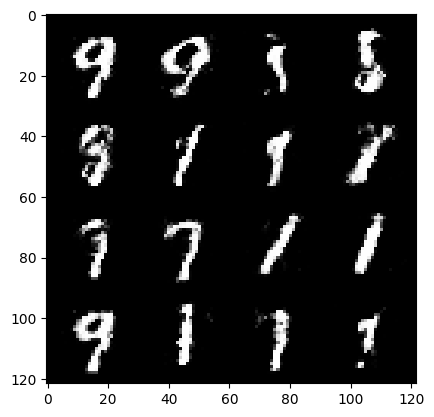

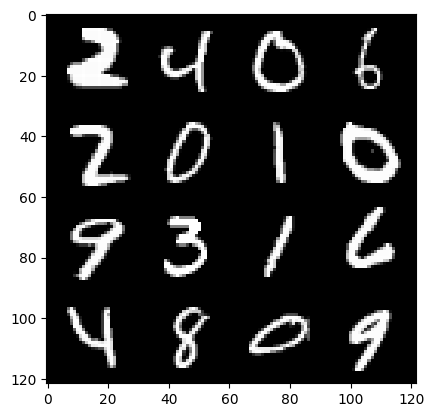

102: step 48000/ Gen loss: 1.9410329433282214 / disc_loss: 24.58148967605704


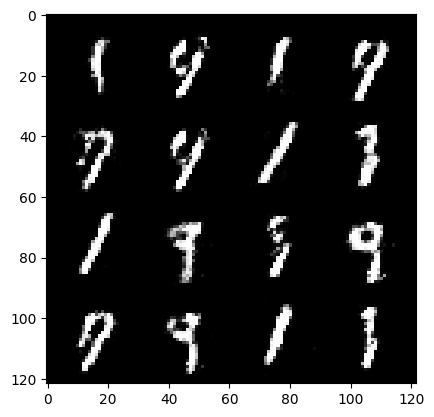

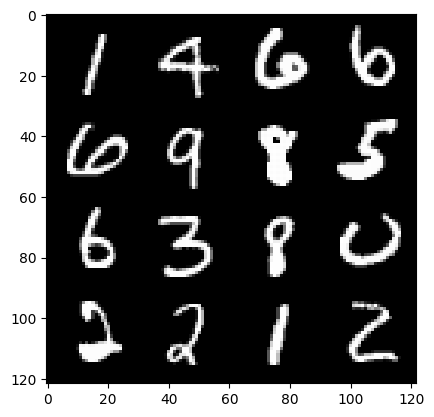

102: step 48300/ Gen loss: 1.915825860500336 / disc_loss: 24.861322846679617


  0%|          | 0/469 [00:00<?, ?it/s]

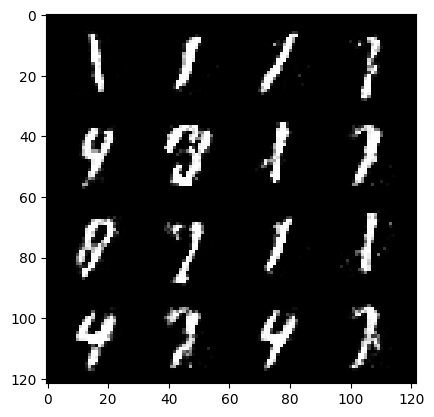

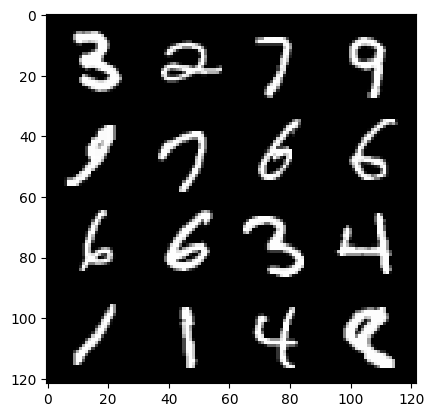

103: step 48600/ Gen loss: 1.8751853326956436 / disc_loss: 25.164265228230484


  0%|          | 0/469 [00:00<?, ?it/s]

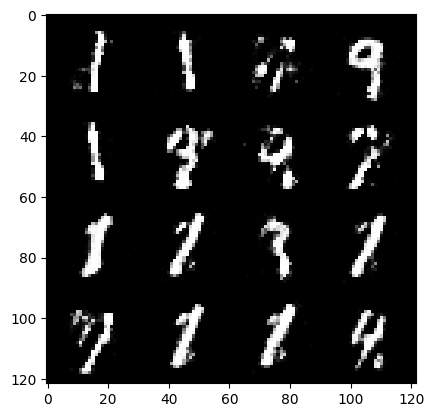

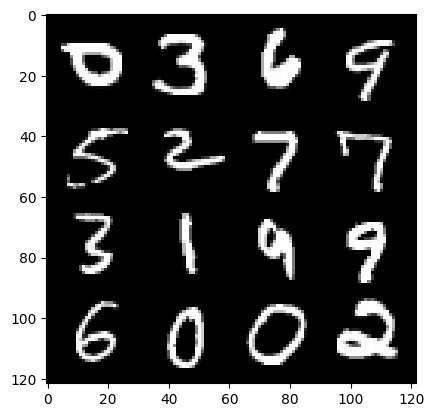

104: step 48900/ Gen loss: 1.829204429388047 / disc_loss: 25.461585323133807


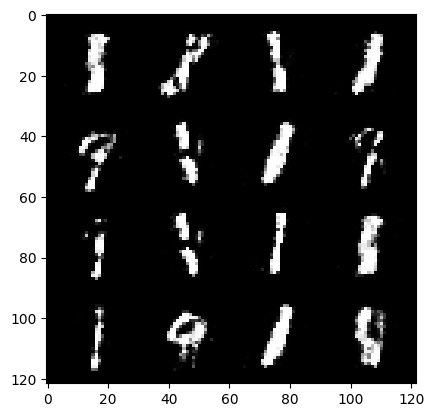

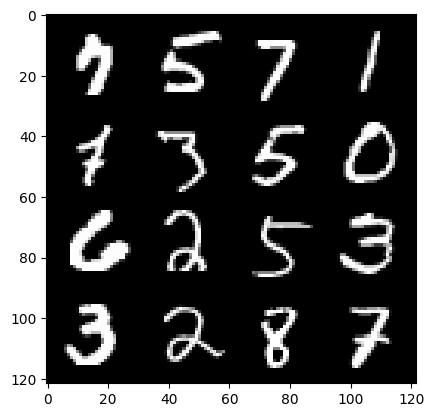

104: step 49200/ Gen loss: 1.8428892350196837 / disc_loss: 25.773296617188784


  0%|          | 0/469 [00:00<?, ?it/s]

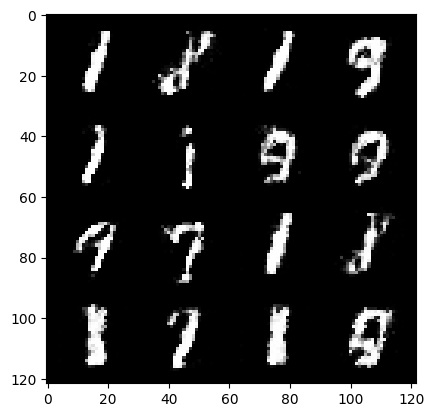

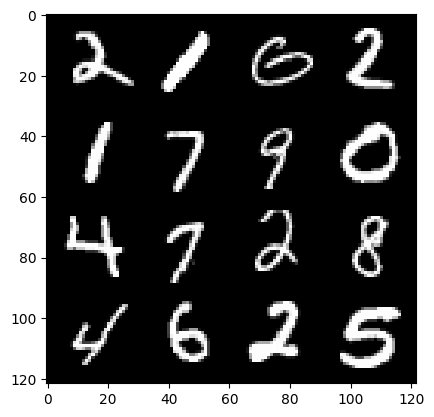

105: step 49500/ Gen loss: 1.8452408627669006 / disc_loss: 26.06557171634705


  0%|          | 0/469 [00:00<?, ?it/s]

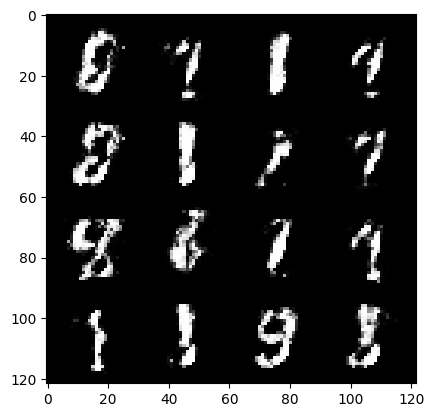

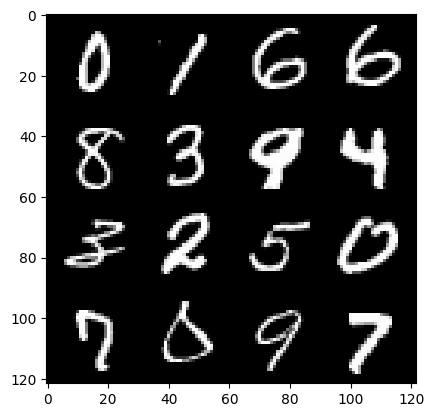

106: step 49800/ Gen loss: 1.845370151201883 / disc_loss: 26.368579777547424


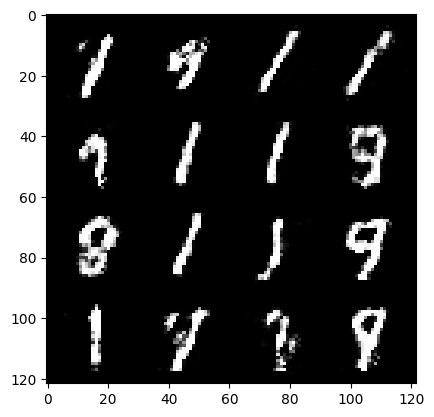

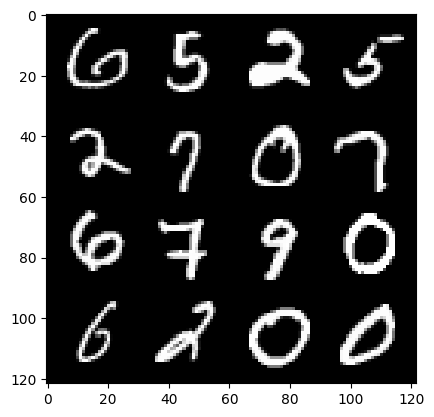

106: step 50100/ Gen loss: 1.7913498787085222 / disc_loss: 26.68140681372953


  0%|          | 0/469 [00:00<?, ?it/s]

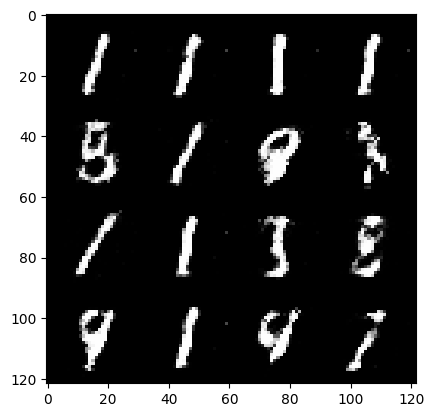

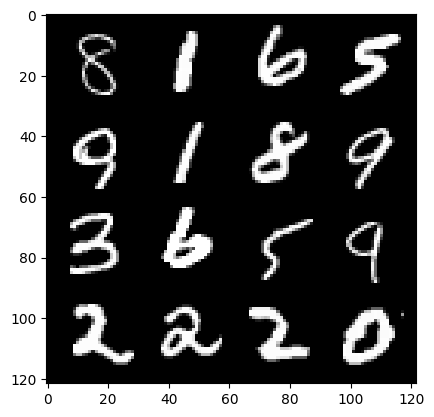

107: step 50400/ Gen loss: 1.7559630461533855 / disc_loss: 27.01371396185828


  0%|          | 0/469 [00:00<?, ?it/s]

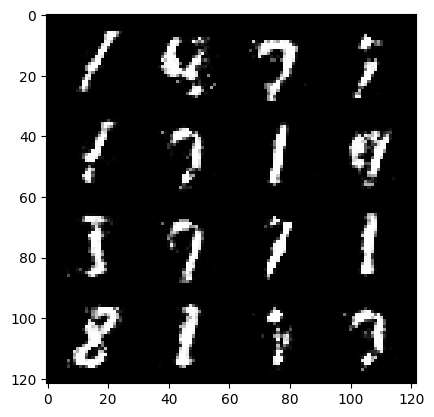

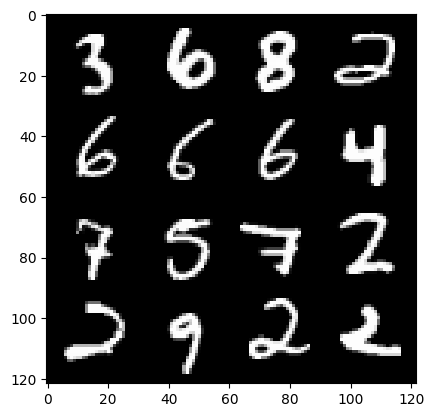

108: step 50700/ Gen loss: 1.7439931889375044 / disc_loss: 27.334713713445996


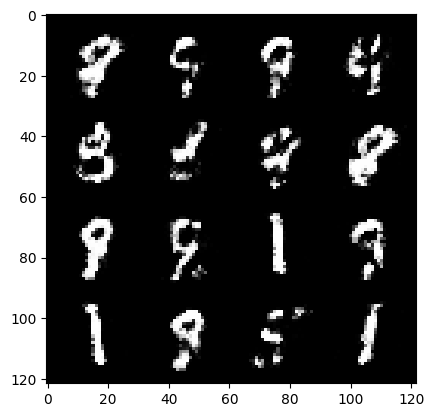

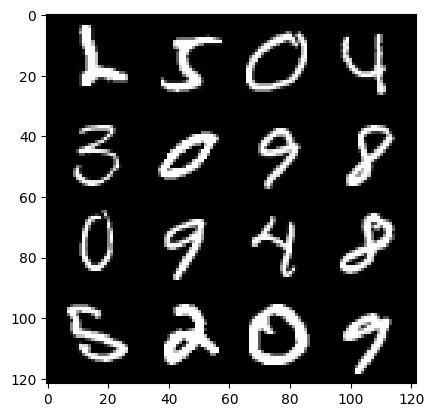

108: step 51000/ Gen loss: 1.7454163833459222 / disc_loss: 27.682968804159522


  0%|          | 0/469 [00:00<?, ?it/s]

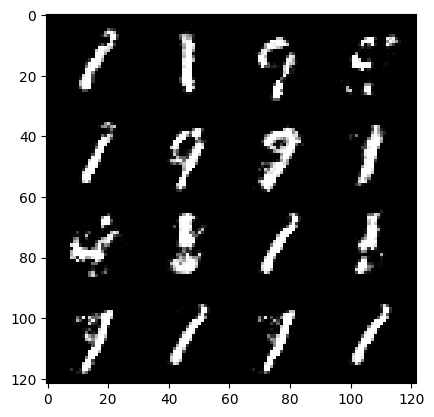

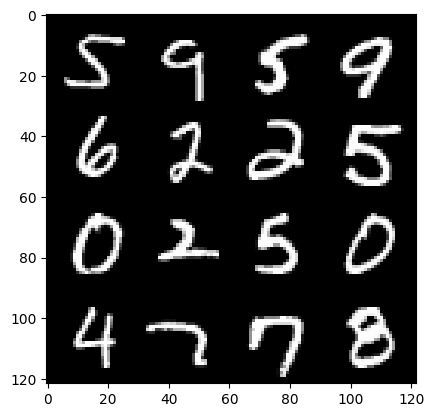

109: step 51300/ Gen loss: 1.6335390746593472 / disc_loss: 28.023015900719933


  0%|          | 0/469 [00:00<?, ?it/s]

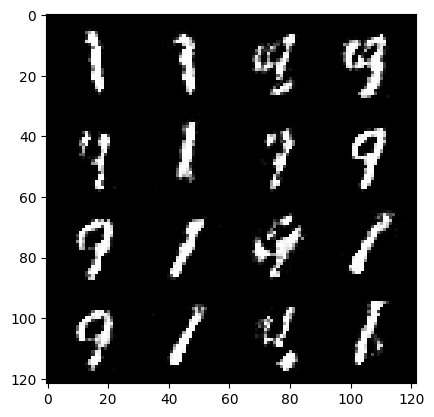

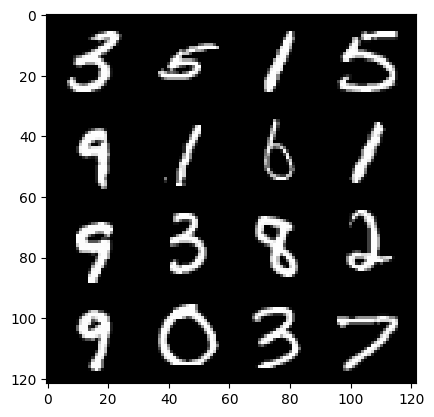

110: step 51600/ Gen loss: 1.6891386723518356 / disc_loss: 28.355672498612368


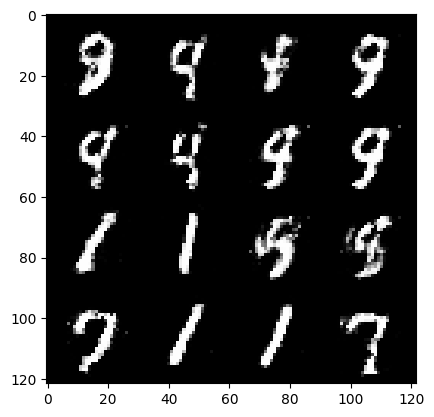

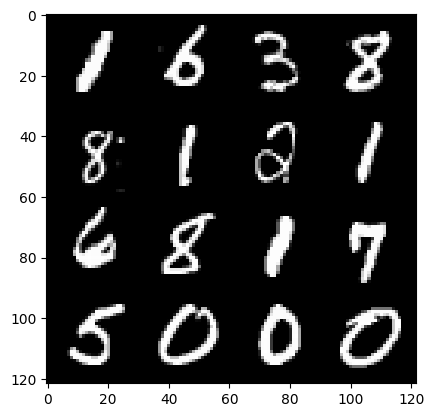

110: step 51900/ Gen loss: 1.6763248340288797 / disc_loss: 28.715016834853852


  0%|          | 0/469 [00:00<?, ?it/s]

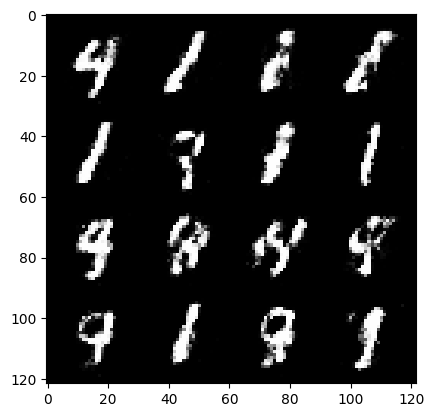

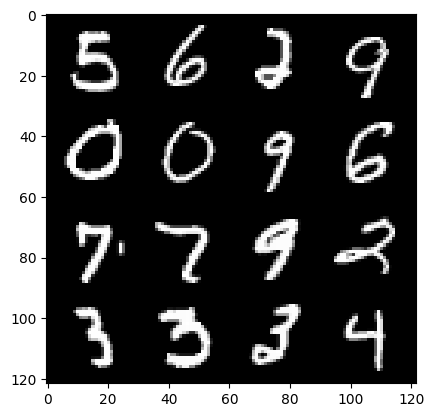

111: step 52200/ Gen loss: 1.6718309970696783 / disc_loss: 29.054566695808145


In [ ]:
# 60000/128 = 469 steps in each epochs.
# Each step is going to process 128 images= size of batch(except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader): # we recieve a set of real images and labels but ofc we dont need labels as it is not supervised learning.
    #discriminator
    disc_opt.zero_grad() #at begining of each of the steps set discriminator gradient to zero.

    cur_bs = len(real) #real = 128x1x28x28 foe each batch.
    real = real.view(cur_bs, -1) #128 x 784
    real = real.to(device) #save real images data to cuda

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)

    disc_loss.backward(retain_graph =True) #backward propagation after calvulating loss for gradients updation.
    disc_opt.step() #tweek and update parameters of discriminators.


    #generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()


    #visualization and stats
    mean_disc_loss += disc_loss.item()/ info_step #calculate the average discriminator loss after 300 steps
    mean_gen_loss += gen_loss.item()/info_step #calculate average generator loss after 300 steps.

    if cur_step%info_step==0 and cur_step>0:  #function to show the real and fake images generated as well as the losses after each 300 steps
      fake_noise = gen_noise(cur_bs,z_dim)
      fake= gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step}/ Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss,mean_dic_loss =0,0
    cur_step+=1